<a href="https://colab.research.google.com/github/amiryarahmadi/NGC6946/blob/main/SALSA_NGC6946.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#I MAP

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from matplotlib.colors import LogNorm
import warnings
warnings.simplefilter('ignore')
%matplotlib inline
from astropy.io.fits import PrimaryHDU

In [4]:
8.79*(6.9/6)**2

11.624775000000001

#Stokes I: 6cm, 18arcsec

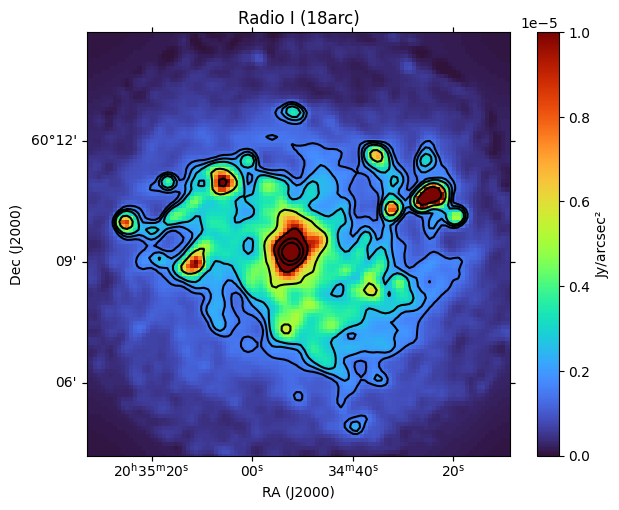

In [5]:
I_path_18arc = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits'
I_18arc = fits.open(I_path_18arc)
I_data_18arc = I_18arc[0].data
header_18arc = I_18arc[0].header

if I_data_18arc.ndim > 2:
    I_data_18arc = I_data_18arc[0]

# Parameters
beam_fwhm_arcsec = 18        # FWHM of the beam in arcseconds
pixel_size_arcsec = 6        # Pixel size in arcseconds

# Beam and pixel area
beam_area = 1.133 * beam_fwhm_arcsec**2
pixel_area = pixel_size_arcsec**2

# Convert Jy/beam → Jy/pixel
conversion_factor_jy_pixel_18arc = pixel_area / beam_area
I_data_jy_pixel_18arc = I_data_18arc * conversion_factor_jy_pixel_18arc

# Convert Jy/pixel → Jy/arcsec²
I_data_jy_arcsec2_18arc = I_data_jy_pixel_18arc / pixel_area

# Define rms and contour levels in Jy/arcsec²
rms_jy_beam = 6e-5
rms_jy_pixel_18arc = rms_jy_beam * conversion_factor_jy_pixel_18arc
rms_jy_arcsec2_18arc = rms_jy_pixel_18arc / pixel_area

levels_arcsec2_18arc = np.array([9, 12, 16, 32, 64, 128, 256]) * rms_jy_arcsec2_18arc

wcs_18arc = WCS(header_18arc, naxis=2)

fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs_18arc)

img = ax.imshow(I_data_jy_arcsec2_18arc.squeeze(), origin='lower', cmap='turbo', vmin=0, vmax=1e-5)
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Jy/arcsec²')

ax.contour(I_data_jy_arcsec2_18arc.squeeze(), levels=levels_arcsec2_18arc, colors='k')

ax.set_title('Radio I (18arc)')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()



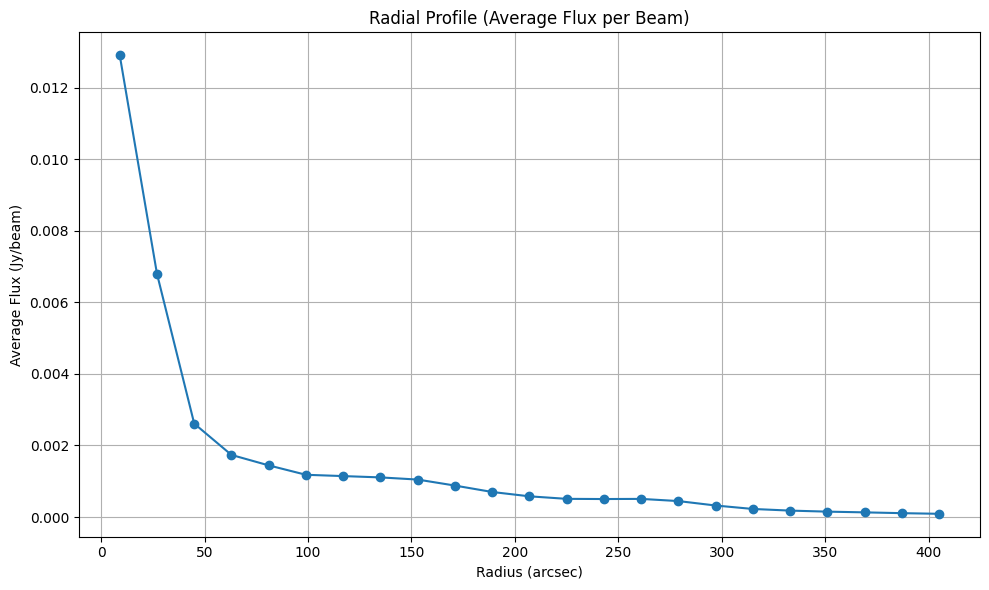

In [6]:


inner_radii = np.array([0.0, 18.0, 36.0, 54.0, 72.0, 90.0, 108.0, 126.0, 144.0, 162.0,
                        180.0, 198.0, 216.0, 234.0, 252.0, 270.0, 288.0, 306.0, 324.0,
                        342.0, 360.0, 378.0, 396.0])
outer_radii = np.array([18.0, 36.0, 54.0, 72.0, 90.0, 108.0, 126.0, 144.0, 162.0, 180.0,
                        198.0, 216.0, 234.0, 252.0, 270.0, 288.0, 306.0, 324.0, 342.0,
                        360.0, 378.0, 396.0, 414.0])
average_flux = np.array([1.2910E-02, 6.7994E-03, 2.6110E-03, 1.7354E-03, 1.4434E-03,
                         1.1804E-03, 1.1439E-03, 1.1072E-03, 1.0466E-03, 8.7889E-04,
                         6.9970E-04, 5.7830E-04, 5.0751E-04, 5.0230E-04, 5.0633E-04,
                         4.4546E-04, 3.2144E-04, 2.2486E-04, 1.7899E-04, 1.4990E-04,
                         1.2966E-04, 1.0735E-04, 8.9655E-05])

# Compute mid-radii
mid_radii = (inner_radii + outer_radii) / 2

# Plot the radial profile
plt.figure(figsize=(10, 6))
plt.plot(mid_radii, average_flux, marker='o', linestyle='-')
plt.title('Radial Profile (Average Flux per Beam)')
plt.xlabel('Radius (arcsec)')
plt.ylabel('Average Flux (Jy/beam)')
plt.grid(True)
plt.tight_layout()
plt.show()


#Stokes I: 6cm, 15arcsec

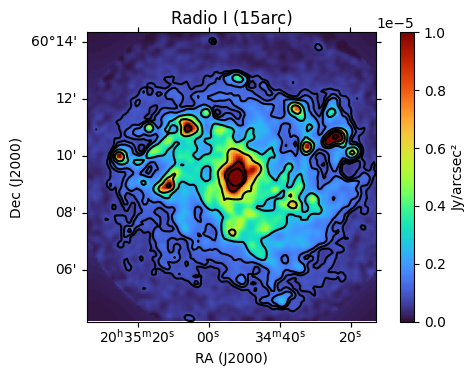

In [7]:
I_path_15arc = '/content/drive/MyDrive/SALSA_NGC6946/ngc6946_I_5grid.fits'
I_15arc = fits.open(I_path_15arc)
I_data_15arc = I_15arc[0].data
header_15arc = I_15arc[0].header
I_15arc.close()

# Ensure 2D data
if I_data_15arc.ndim > 2:
    I_data_15arc = I_data_15arc[0]

# Parameters
beam_fwhm_arcsec = 15        # FWHM of the beam in arcseconds
pixel_size_arcsec = 5        # Pixel size in arcseconds

# Beam and pixel area
beam_area_15arc = 1.133 * beam_fwhm_arcsec**2
pixel_area_15arc = pixel_size_arcsec**2

# Convert Jy/beam → Jy/pixel
conversion_factor_jy_pixel_15arc = pixel_area_15arc / beam_area_15arc
I_data_jy_pixel_15arc = I_data_15arc * conversion_factor_jy_pixel_15arc

# Convert Jy/pixel → Jy/arcsec²
I_data_jy_arcsec2_15arc = I_data_jy_pixel_15arc / pixel_area_15arc

# Define rms and contour levels in Jy/arcsec²
rms_jy_beam_15arc = 22e-6
rms_jy_pixel_15arc = rms_jy_beam_15arc * conversion_factor_jy_pixel_15arc
rms_jy_arcsec2_15arc = rms_jy_pixel_15arc / pixel_area_15arc

levels_arcsec2_15arc = np.array([9, 12, 16, 32, 64, 128, 256]) * rms_jy_arcsec2_15arc

# WCS setup
wcs_15arc = WCS(header_15arc, naxis=2)

# Plot
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs_15arc)

img = ax.imshow(I_data_jy_arcsec2_15arc.squeeze(), origin='lower', cmap='turbo', vmin=0, vmax=1e-5)
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Jy/arcsec²')

ax.contour(I_data_jy_arcsec2_15arc.squeeze(), levels=levels_arcsec2_15arc, colors='k')

ax.set_title('Radio I (15arc)')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim([60, 242 - 60])
plt.ylim([60, 242 - 60])
plt.tight_layout()
plt.show()



#Synchrotron map

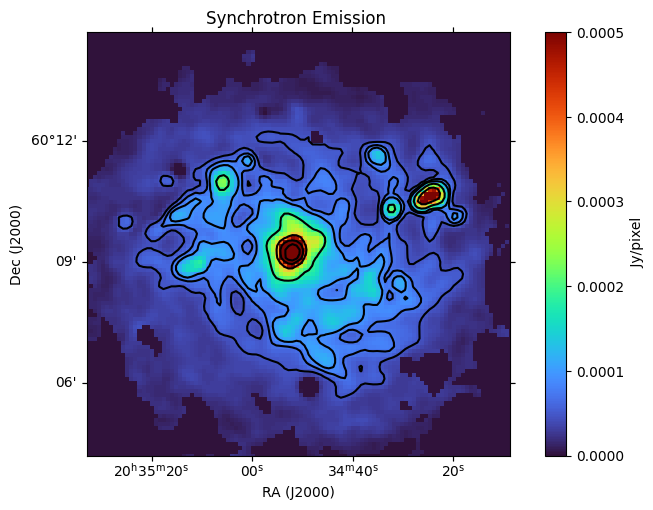

In [8]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from matplotlib.colors import LogNorm
import warnings
warnings.simplefilter('ignore')
%matplotlib inline


I = '/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits'


I = fits.open(I)
I_data = I[0].data
header = I[0].header


if I_data.ndim > 2:

    I_data = I_data[0]

# Convert intensity from Jy/beam to Jy/pixel
beam_area = 1.133 * 18 * 18  # Beam area in arcsec^2
pixel_area = 6 * 6  # Pixel area in arcsec^2


conversion_factor = pixel_area / beam_area
I_data_jy_pixel = I_data * conversion_factor  # Convert intensity to Jy/pixel
rms_jy_pixel = 6e-5*conversion_factor
levels = np.array([8,12,16,32,64,128,256])*rms_jy_pixel

wcs = WCS(header, naxis=2)


fig = plt.figure(figsize=(9, 5.5))
ax = fig.add_subplot(111, projection=wcs)
img = ax.imshow(I_data_jy_pixel.squeeze(), origin='lower', cmap='turbo',vmin=0,vmax=0.0005)#norm=LogNorm())
#plt.xlim([60,242-60]); plt.ylim([60,242-60])
ax.set_title('Synchrotron Emission ')
cbar = plt.colorbar(img, ax=ax)
cbar.set_label(' Jy/pixel')
plt.contour(I_data_jy_pixel.squeeze(),levels=levels,colors='k')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()

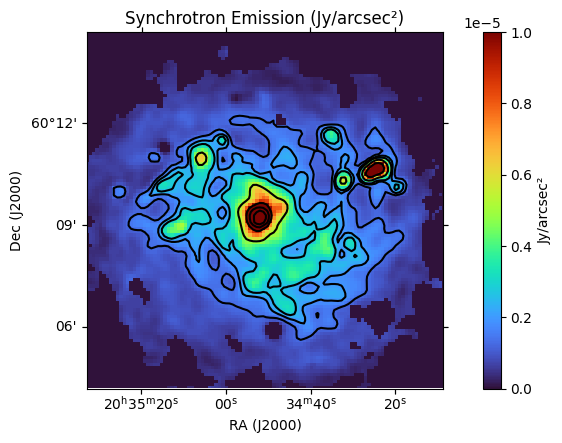

In [9]:

I_path = '/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits'
I = fits.open(I_path)
I_data = I[0].data
header = I[0].header
I.close()

# Ensure 2D data
if I_data.ndim > 2:
    I_data = I_data[0]

# Parameters
beam_fwhm_arcsec = 18        # FWHM of the beam in arcseconds (example value for 6cm)
pixel_size_arcsec = 6        # Pixel size in arcseconds (example value)

# Beam and pixel area
beam_area = 1.133 * beam_fwhm_arcsec**2         # Beam area in arcsec² (assuming Gaussian beam)
pixel_area = pixel_size_arcsec**2               # Pixel area in arcsec²

# Convert Jy/beam → Jy/pixel
conversion_factor_jy_pixel = pixel_area / beam_area
I_data_jy_pixel = I_data * conversion_factor_jy_pixel

# Convert Jy/pixel → Jy/arcsec²
I_data_jy_arcsec2 = I_data_jy_pixel / pixel_area

# Define rms and contour levels in Jy/arcsec²
rms_jy_beam = 6e-5                             # In Jy/beam (example RMS)
rms_jy_pixel = rms_jy_beam * conversion_factor_jy_pixel
rms_jy_arcsec2 = rms_jy_pixel / pixel_area

levels_arcsec2 = np.array([8, 12, 16, 32, 64, 128, 256]) * rms_jy_arcsec2

# WCS setup
wcs = WCS(header, naxis=2)

# Plotting
fig = plt.figure(figsize=(9, 5.5))
ax = fig.add_subplot(111, projection=wcs)

# Display the image with Jy/arcsec² units
img = ax.imshow(I_data_jy_arcsec2.squeeze(), origin='lower', cmap='turbo', vmin=0,vmax=1e-5)

# Colorbar setup
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Jy/arcsec²')

# Contour setup
ax.contour(I_data_jy_arcsec2.squeeze(), levels=levels_arcsec2, colors='k')

# Titles and labels
ax.set_title('Synchrotron Emission (Jy/arcsec²)')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')

# Adjust ticks and limits
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.tight_layout()
plt.show()



#Q Map

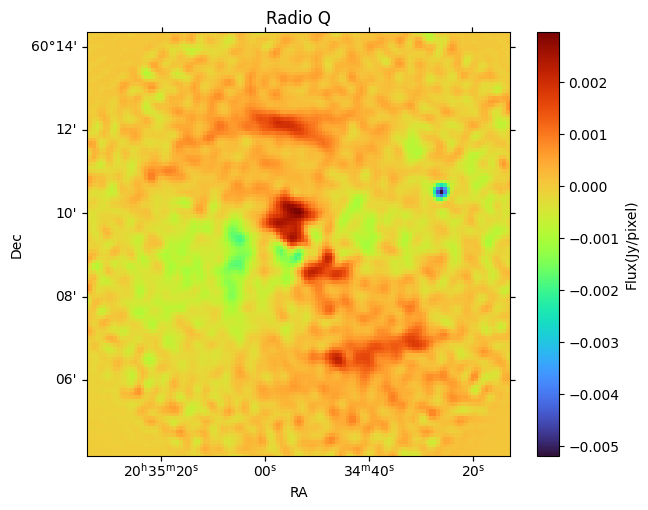

In [10]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from matplotlib.colors import LogNorm
import warnings
warnings.simplefilter('ignore')
%matplotlib inline

#File Path

Q = '/content/drive/MyDrive/SALSA_NGC6946/Q_5grid.fits'


# Open the FITS file and get the data and header
Q = fits.open(Q)
Q_data = Q[0].data
header = Q[0].header


# Check if the data is 3D and slice it if necessary
if Q_data.ndim > 2:
    # Slice to the first 2D frame if the data is 3D
    Q_data = Q_data[0]  # You can adjust this to select a different slice

# Convert intensity from Jy/beam to Jy/pixel
beam_area = 1.133 * 15 * 15  # Beam area in arcsec^2
pixel_area = 5 * 5  # Pixel area in arcsec^2

# Conversion factor from Jy/beam to Jy/pixel
conversion_factor = beam_area / pixel_area
Q_data_jy_pixel = Q_data * conversion_factor  # Convert intensity to Jy/pixel

# Create a WCS object from the header
wcs = WCS(header, naxis=2)

# Set up the plot with WCS
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs)

# Plot the image with LogNorm scaling
img = ax.imshow(Q_data_jy_pixel.squeeze(), origin='lower', cmap='turbo') #norm=LogNorm())
plt.xlim([60,242-60]); plt.ylim([60,242-60])
# Add the title and color bar
ax.set_title('Radio Q')
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Flux(Jy/pixel)')

# Show RA and Dec on the axes
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
plt.xticks(fontsize=14) # Increase x-axis tick font size
plt.yticks(fontsize=14) # Increase y-axis tick font size
# Show the plot
plt.show()


#U MAP

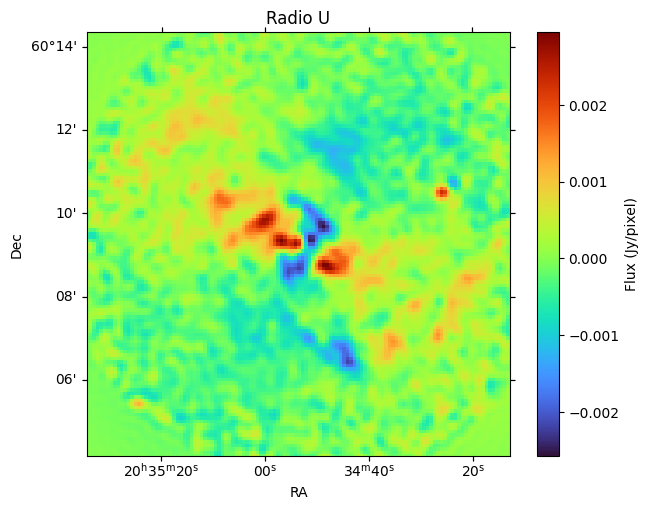

In [11]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from matplotlib.colors import LogNorm
import warnings
warnings.simplefilter('ignore')
%matplotlib inline
#File Path

U = '/content/drive/MyDrive/SALSA_NGC6946/U_5grid.fits'


# Open the FITS file and get the data and header
U = fits.open(U)
U_data = U[0].data
header = U[0].header


# Check if the data is 3D and slice it if necessary
if U_data.ndim > 2:
    # Slice to the first 2D frame if the data is 3D
    U_data = U_data[0]  # You can adjust this to select a different slice

# Convert intensity from Jy/beam to Jy/pixel
beam_area = 1.133 * 15 * 15  # Beam area in arcsec^2
pixel_area = 5 * 5  # Pixel area in arcsec^2

# Conversion factor from Jy/beam to Jy/pixel
conversion_factor = beam_area / pixel_area
U_data_jy_pixel = U_data * conversion_factor  # Convert intensity to Jy/pixel

# Create a WCS object from the header
wcs = WCS(header, naxis=2)

# Set up the plot with WCS
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs)

# Plot the image with LogNorm scaling
img = ax.imshow(U_data_jy_pixel.squeeze(), origin='lower', cmap='turbo') #norm=LogNorm())
plt.xlim([60,242-60]); plt.ylim([60,242-60])
# Add the title and color bar
ax.set_title('Radio U')
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Flux (Jy/pixel)')

# Show RA and Dec on the axes
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
plt.xticks(fontsize=14) # Increase x-axis tick font size
plt.yticks(fontsize=14) # Increase y-axis tick font size
# Show the plot
plt.show()


# Polarization Angle map

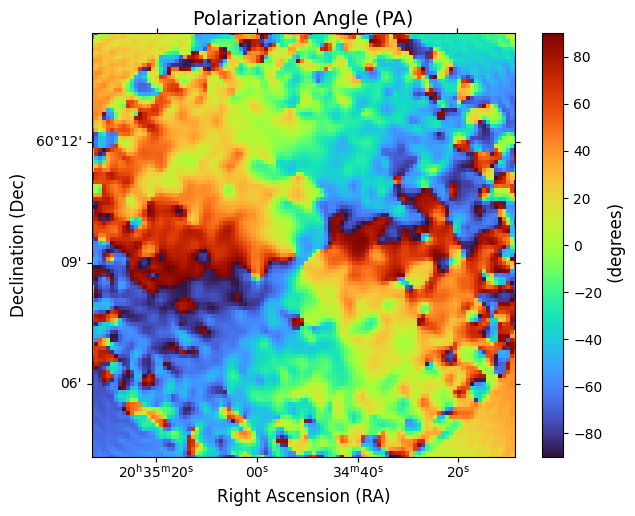

In [12]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from matplotlib.colors import Normalize
import warnings
warnings.simplefilter('ignore')
%matplotlib inline

# File path for PA map
PA_file = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946-POLA-18arcsec.fits'

# Open the FITS file and get the data and header
PA_hdul = fits.open(PA_file)
PA_data = PA_hdul[0].data
header = PA_hdul[0].header

# Check if the data is 3D and slice it if necessary
if PA_data.ndim > 2:
    PA_data = PA_data[0]  # Select the first 2D slice if the data is 3D

# Create a WCS object from the header
wcs = WCS(header, naxis=2)

# Set up the plot with WCS
fig = plt.figure(figsize=(7,5.5))
ax = fig.add_subplot(111, projection=wcs)

# Plot the PA map with linear scaling (normalize between the min and max of the PA data)
img = ax.imshow(PA_data.squeeze(), origin='lower', cmap='turbo',
          norm=Normalize(vmin=np.nanmin(PA_data), vmax=np.nanmax(PA_data)))


# Add the title and color bar
ax.set_title('Polarization Angle (PA)', fontsize=14)
cbar = plt.colorbar(img, ax=ax)
cbar.set_label(' (degrees)', fontsize=12)

# Show RA and Dec on the axes
ax.set_xlabel('Right Ascension (RA)', fontsize=12)
ax.set_ylabel('Declination (Dec)', fontsize=12)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])

# Display the plot
plt.show()



#Polarization Intensity Produced by AIPS: 18''

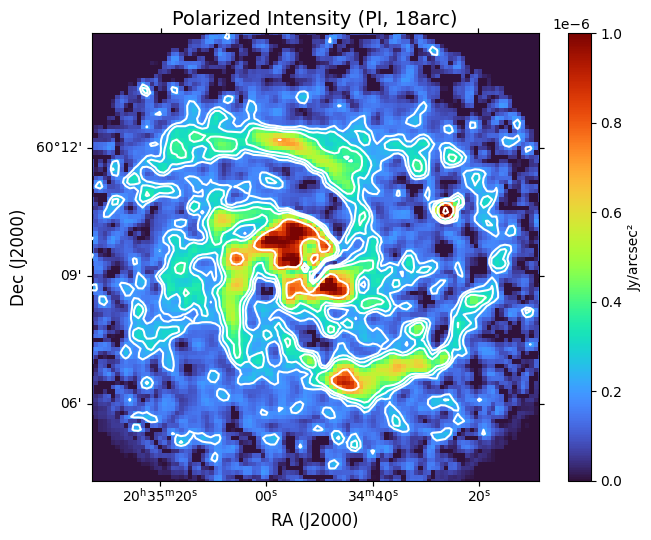

In [13]:
# --- Load PI FITS file ---
PI_file_18arc = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits'
hdul_18arc = fits.open(PI_file_18arc)
PI_data_18arc = hdul_18arc[0].data
header_18arc = hdul_18arc[0].header
hdul_18arc.close()

# If data is 3D, select the first 2D slice
if PI_data_18arc.ndim > 2:
    PI_data_18arc = PI_data_18arc[0]

# --- Beam and pixel parameters ---
beam_fwhm_arcsec = 18
pixel_size_arcsec = 6
beam_area_18arc = 1.133 * beam_fwhm_arcsec**2
pixel_area_18arc = pixel_size_arcsec**2

# --- Convert Jy/beam → Jy/pixel → Jy/arcsec² ---
conversion_factor_18arc = pixel_area_18arc / beam_area_18arc
PI_data_jy_pixel_18arc = PI_data_18arc * conversion_factor_18arc
PI_data_jy_arcsec2_18arc = PI_data_jy_pixel_18arc / pixel_area_18arc

# --- Define RMS and contour levels ---
PI_rms_beam_18arc = 8.2e-6
PI_rms_pixel_18arc = PI_rms_beam_18arc * conversion_factor_18arc
PI_rms_arcsec2_18arc = PI_rms_pixel_18arc / pixel_area_18arc
levels_arcsec2_18arc = np.array([9, 12, 16, 32, 64, 128, 256]) * PI_rms_arcsec2_18arc

# --- WCS for full image ---
wcs_18arc = WCS(header_18arc, naxis=2)

# --- Ensure data is 2D ---
PI_2D_18arc = np.squeeze(PI_data_jy_arcsec2_18arc)

# --- Plot ---
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs_18arc)

img = ax.imshow(PI_2D_18arc, origin='lower', cmap='turbo', vmin=0, vmax=1e-6)
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Jy/arcsec²')

ax.contour(PI_2D_18arc, levels=levels_arcsec2_18arc, colors='white')

ax.set_title('Polarized Intensity (PI, 18arc)', fontsize=14)
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()




#PI:15''

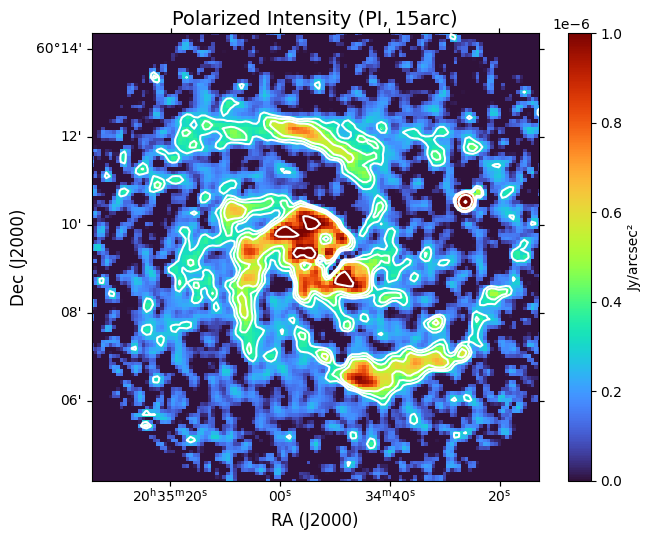

In [14]:
# --- Load PI FITS file ---
PI_file_15arc = '/content/drive/MyDrive/SALSA_NGC6946/ngc6946_pi_hgm.fits'
hdul_15arc = fits.open(PI_file_15arc)
PI_data_15arc = hdul_15arc[0].data
header_15arc = hdul_15arc[0].header
hdul_15arc.close()

# If data is 3D, select the first 2D slice
if PI_data_15arc.ndim > 2:
    PI_data_15arc = PI_data_15arc[0]

# --- Beam and pixel parameters ---
beam_fwhm_arcsec = 15
pixel_size_arcsec = 5
beam_area_15arc = 1.133 * beam_fwhm_arcsec**2
pixel_area_15arc = pixel_size_arcsec**2

# --- Convert Jy/beam → Jy/pixel → Jy/arcsec² ---
conversion_factor_15arc = pixel_area_15arc / beam_area_15arc
PI_data_jy_pixel_15arc = PI_data_15arc * conversion_factor_15arc
PI_data_jy_arcsec2_15arc = PI_data_jy_pixel_15arc / pixel_area_15arc

# --- Define RMS and contour levels ---
PI_rms_beam_15arc = 8.2e-6
PI_rms_pixel_15arc = PI_rms_beam_15arc * conversion_factor_15arc
PI_rms_arcsec2_15arc = PI_rms_pixel_15arc / pixel_area_15arc
levels_arcsec2_15arc = np.array([9, 12, 16, 32, 64, 128, 256]) * PI_rms_arcsec2_15arc

# --- WCS for full image ---
wcs_15arc = WCS(header_15arc, naxis=2)

# --- Ensure data is 2D ---
PI_2D_15arc = np.squeeze(PI_data_jy_arcsec2_15arc)

# --- Plot ---
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs_15arc)

img = ax.imshow(PI_2D_15arc, origin='lower', cmap='turbo', vmin=0, vmax=1e-6)
cbar = plt.colorbar(img, ax=ax)
cbar.set_label('Jy/arcsec²')

ax.contour(PI_2D_15arc, levels=levels_arcsec2_15arc, colors='white')

ax.set_title('Polarized Intensity (PI, 15arc)', fontsize=14)
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.xlim([60, 242 - 60])
plt.ylim([60, 242 - 60])
plt.show()


#Intrinsic Polarization Fraction ($p_0$)

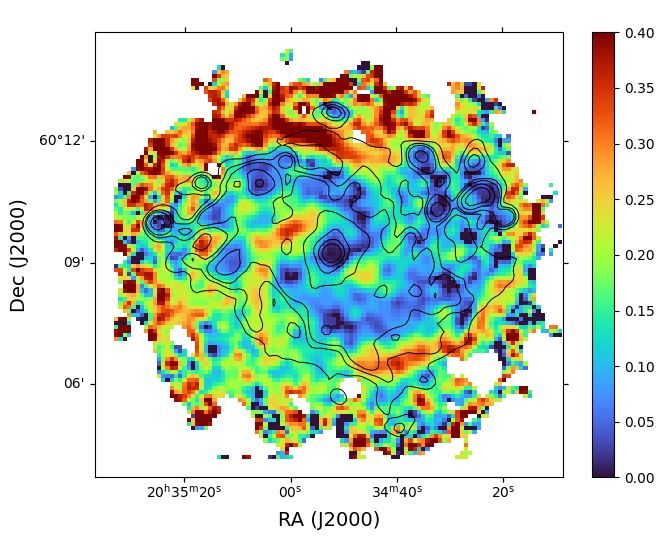

Average intrinsic polarization: 0.1824
PF_intrs map saved as FITS file.


In [15]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# --- Load PF data ---
pi_fits = fits.open('/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits')
i_fits = fits.open('/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits')

PI_map = np.squeeze(pi_fits[0].data)
I_map = np.squeeze(i_fits[0].data)
wcs = WCS(i_fits[0].header, naxis=2)

# --- Compute PF ---
rms_noise = 22e-6
threshold = 3 * rms_noise
valid_mask = I_map > threshold

PF_intrs = np.full_like(I_map, np.nan)
PF_intrs[valid_mask] = PI_map[valid_mask] / I_map[valid_mask]

# --- Load total intensity map for contours ---
I_18arc = fits.open('/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits')
I_data_18arc = I_18arc[0].data
if I_data_18arc.ndim > 2:
    I_data_18arc = I_data_18arc[0]

# Convert from Jy/beam to Jy/arcsec²
beam_fwhm_arcsec = 18
pixel_size_arcsec = 6
beam_area = 1.133 * beam_fwhm_arcsec**2
pixel_area = pixel_size_arcsec**2
conversion_factor_jy_pixel_18arc = pixel_area / beam_area
I_data_jy_pixel_18arc = I_data_18arc * conversion_factor_jy_pixel_18arc
I_data_jy_arcsec2_18arc = I_data_jy_pixel_18arc / pixel_area

# --- Define contour levels ---
rms_jy_beam = 6e-5
rms_jy_pixel_18arc = rms_jy_beam * conversion_factor_jy_pixel_18arc
rms_jy_arcsec2_18arc = rms_jy_pixel_18arc / pixel_area
levels_arcsec2_18arc = np.array([8,12,16,32,64,128,256]) * rms_jy_arcsec2_18arc

# --- Plot PF map with contours from total intensity ---
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs)

# Turn off grid
ax.grid(False)

# Plot PF image
im = ax.imshow(PF_intrs, origin='lower', cmap='turbo', vmin=0, vmax=0.4, aspect='auto')
plt.colorbar(im, ax=ax, label='')

# Add black contours
ax.contour(I_data_jy_arcsec2_18arc.squeeze(), levels=levels_arcsec2_18arc, colors='black', linewidths=0.7)

# Labels and title
ax.set_xlabel('RA (J2000)', fontsize=14)
ax.set_ylabel('Dec (J2000)', fontsize=14)

ax.set_title(' ')

plt.tight_layout()
plt.xlim([15, 167 - 42])
plt.ylim([30, 141 - 1])
plt.show()
# --- Compute average intrinsic polarization ---
average_pf_intrs = np.nanmean(PF_intrs)
print(f"Average intrinsic polarization: {average_pf_intrs:.4f}")

pf_hdu = fits.PrimaryHDU(data=PF_intrs, header=i_fits[0].header)
pf_hdu.writeto('/content/drive/MyDrive/SALSA_NGC6946/PF_intrs.fits', overwrite=True)
print("PF_intrs map saved as FITS file.")


pi_fits.close()
i_fits.close()
I_18arc.close()



#Intrinsic polarization fraction radial profile

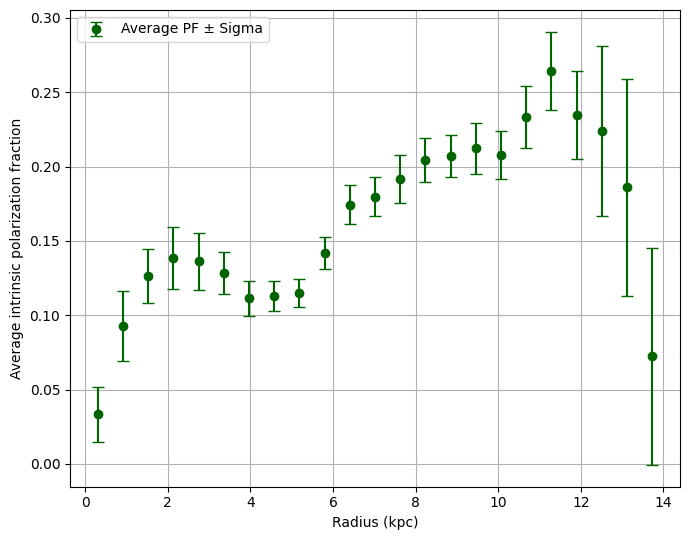

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Data: [Inner arcsec, Outer arcsec, Average Flux (Jy/beam), Sigma]
data = [
    (0.0, 18.0, 0.0333, 1.8282E-02),
    (18.0, 36.0, 0.0931, 2.3553E-02),
    (36.0, 54.0, 0.1266, 1.8136E-02),
    (54.0, 72.0, 0.1384, 2.0883E-02),
    (72.0, 90.0, 0.1363, 1.9183E-02),
    (90.0, 108.0, 0.1285, 1.4199E-02),
    (108.0, 126.0, 0.1114, 1.1939E-02),
    (126.0, 144.0, 0.1127, 1.0146E-02),
    (144.0, 162.0, 0.1151, 9.2862E-03),
    (162.0, 180.0, 0.1420, 1.0882E-02),
    (180.0, 198.0, 0.1744, 1.2874E-02),
    (198.0, 216.0, 0.1798, 1.2877E-02),
    (216.0, 234.0, 0.1916, 1.6247E-02),
    (234.0, 252.0, 0.2045, 1.4806E-02),
    (252.0, 270.0, 0.2068, 1.4127E-02),
    (270.0, 288.0, 0.2122, 1.7259E-02),
    (288.0, 306.0, 0.2075, 1.6095E-02),
    (306.0, 324.0, 0.2334, 2.0710E-02),
    (324.0, 342.0, 0.2644, 2.6312E-02),
    (342.0, 360.0, 0.2344, 2.9601E-02),
    (360.0, 378.0, 0.2238, 5.7045E-02),
    (378.0, 396.0, 0.1860, 7.2876E-02),
    (396.0, 414.0, 0.0724, 7.3128E-02),
]

# Conversion factor from arcsec to kpc at 7.0 Mpc
arcsec_to_kpc = 0.0339

# Calculate midpoints and convert to kpc
radii_arcsec = [(inner + outer) / 2 for inner, outer, _, _ in data]
radii_kpc = [r * arcsec_to_kpc for r in radii_arcsec]
avg_flux = [flux for _, _, flux, _ in data]
sigmas = [sigma for _, _, _, sigma in data]

# Plotting
plt.figure(figsize=(7, 5.5))
plt.errorbar(radii_kpc, avg_flux, yerr=sigmas, fmt='o', capsize=4, color='darkgreen', label='Average PF ± Sigma')
plt.xlabel("Radius (kpc)")
plt.ylabel("Average intrinsic polarization fraction")
plt.title("")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#Observed Polarization fraction at 18''

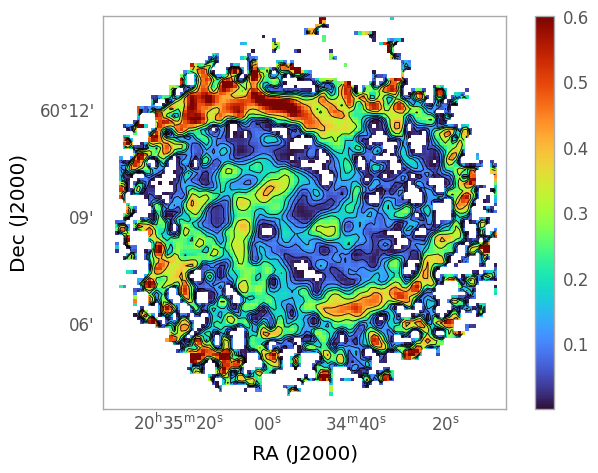

Average observed polarization: 0.2047
PF_obs map saved as FITS file.


In [17]:
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS
from astropy.visualization import astropy_mpl_style
import numpy as np

plt.style.use(astropy_mpl_style)

# Load the fits file
pf_obs_file = '/content/drive/MyDrive/SALSA_NGC6946/pf_obs_18arcsec.fits'
with fits.open(pf_obs_file) as hdul:
    pf_obs_data = hdul[0].data
    header = hdul[0].header

# Remove negative values
pf_obs_data[pf_obs_data < 0] = np.nan

# Set up WCS
wcs = WCS(header)

# Define contour levels for polarization fraction
contour_levels = [0.05, 0.1, 0.15, 0.2, 0.3, 0.4]

# Create the figure and WCS-enabled axes
fig = plt.figure(figsize=(7, 5.5))
ax = plt.subplot(projection=wcs)

# Disable the grid
ax.grid(False)

# Plot the data
im = ax.imshow(pf_obs_data, cmap='turbo', origin='lower', vmax=0.6)
cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.05)
cb.set_label('')

# Add contours
ax.contour(pf_obs_data, levels=contour_levels, colors='black', linewidths=0.6)

# Labels and title
ax.set_title('')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')

# Optional: set plot limits
ax.set_xlim(15, 167 - 39)
ax.set_ylim(30, 141 - 1)

plt.tight_layout()
plt.show()
# Compute average polarization (excluding NaNs)
average_pf_obs = np.nanmean(pf_obs_data)
print(f"Average observed polarization: {average_pf_obs:.4f}")

pf_hdu = fits.PrimaryHDU(data=pf_obs_data, header=i_fits[0].header)
pf_hdu.writeto('/content/drive/MyDrive/SALSA_NGC6946/PF_obs.fits', overwrite=True)
print("PF_obs map saved as FITS file.")


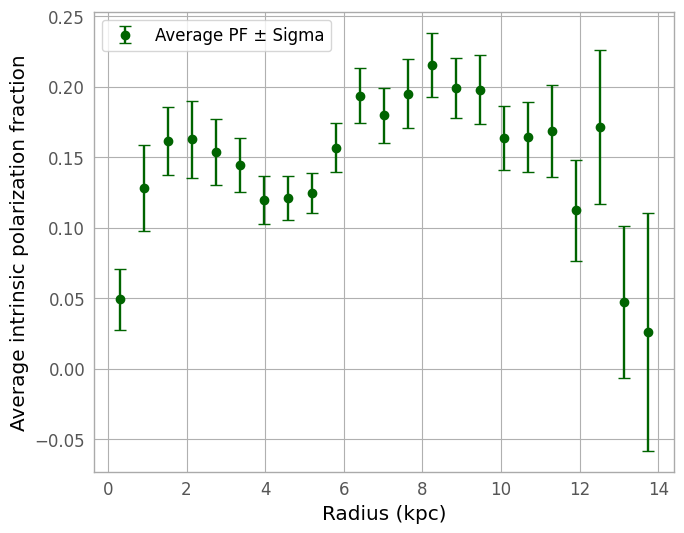

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the provided table (inner arcsec, outer arcsec, average flux, sigma)
data = [
    (0.0, 18.0, 0.0493, 2.1607E-02),
    (18.0, 36.0, 0.1280, 3.0353E-02),
    (36.0, 54.0, 0.1615, 2.4344E-02),
    (54.0, 72.0, 0.1628, 2.7276E-02),
    (72.0, 90.0, 0.1535, 2.3417E-02),
    (90.0, 108.0, 0.1442, 1.9155E-02),
    (108.0, 126.0, 0.1196, 1.7070E-02),
    (126.0, 144.0, 0.1211, 1.5302E-02),
    (144.0, 162.0, 0.1249, 1.4256E-02),
    (162.0, 180.0, 0.1568, 1.7167E-02),
    (180.0, 198.0, 0.1938, 1.9715E-02),
    (198.0, 216.0, 0.1797, 1.9803E-02),
    (216.0, 234.0, 0.1952, 2.4431E-02),
    (234.0, 252.0, 0.2158, 2.2690E-02),
    (252.0, 270.0, 0.1990, 2.1411E-02),
    (270.0, 288.0, 0.1979, 2.4553E-02),
    (288.0, 306.0, 0.1637, 2.2908E-02),
    (306.0, 324.0, 0.1644, 2.4590E-02),
    (324.0, 342.0, 0.1685, 3.2471E-02),
    (342.0, 360.0, 0.1124, 3.5988E-02),
    (360.0, 378.0, 0.1713, 5.4625E-02),
    (378.0, 396.0, 0.0474, 5.3976E-02),
    (396.0, 414.0, 0.0260, 8.4672E-02),
]

# Conversion factor from arcsec to kpc at 7.0 Mpc
arcsec_to_kpc = 0.0339

# Calculate midpoints and convert to kpc
radii_arcsec = [(inner + outer) / 2 for inner, outer, _, _ in data]
radii_kpc = [r * arcsec_to_kpc for r in radii_arcsec]
avg_flux = [flux for _, _, flux, _ in data]
sigmas = [sigma for _, _, _, sigma in data]

# Plotting
plt.figure(figsize=(7, 5.5))
plt.errorbar(radii_kpc, avg_flux, yerr=sigmas, fmt='o', capsize=4, color='darkgreen', label='Average PF ± Sigma')
plt.xlabel("Radius (kpc)")
plt.ylabel("Average intrinsic polarization fraction")
plt.title("")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#Polarization fraction difference $PF_{obs}$ - $PF_{intr}$

Polarization difference map saved to: /content/drive/MyDrive/SALSA_NGC6946/pf_difference_map.fits


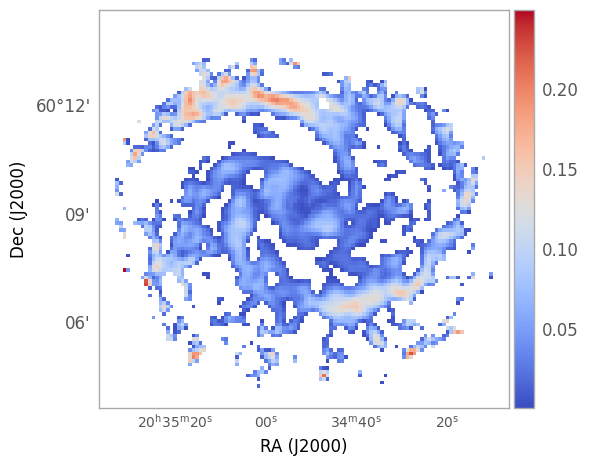

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import ImageNormalize, MinMaxInterval


fits_file_pf_o = "/content/drive/MyDrive/SALSA_NGC6946/PF_obs.fits"
fits_file_pf_i = "/content/drive/MyDrive/SALSA_NGC6946/PF_intrs.fits"


hdul_pf_o = fits.open(fits_file_pf_o)
hdul_pf_i = fits.open(fits_file_pf_i)

pf_o = hdul_pf_o[0].data
pf_i = hdul_pf_i[0].data
header_pf_o = hdul_pf_o[0].header


wcs = WCS(header_pf_o, naxis=2)

wcs_2d = wcs.slice((slice(None), slice(None)))
ax = fig.add_subplot(111, projection=wcs_2d)



hdul_pf_o.close()
hdul_pf_i.close()


pf_diff = pf_o - pf_i
pf_diff[pf_diff < 0] = np.nan


output_fits = "/content/drive/MyDrive/SALSA_NGC6946/pf_difference_map.fits"
fits.writeto(output_fits, pf_diff, header_pf_o, overwrite=True)
print(f"Polarization difference map saved to: {output_fits}")


vmin = np.nanmin(pf_diff)
vmax = np.nanmax(pf_diff)

fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs)


ax.grid(False)


norm = ImageNormalize(pf_diff, interval=MinMaxInterval(), vmin=vmin, vmax=vmax)
im = ax.imshow(pf_diff, origin="lower", cmap="coolwarm", norm=norm)


cbar = fig.colorbar(im, ax=ax, pad=0.01, fraction=0.046, aspect=20)
cbar.set_label('', size=12)


ax.set_title("")
ax.set_xlabel("RA (J2000)", fontsize=12)
ax.set_ylabel("Dec (J2000)", fontsize=12)

# Axis settings
ax.coords[0].set_axislabel("RA (J2000)", fontsize=12)
ax.coords[1].set_axislabel("Dec (J2000)", fontsize=12)
ax.coords[1].set_axislabel_position("l")
ax.coords[1].set_ticklabel_position("l")
ax.coords[0].set_axislabel_position("b")
ax.coords[0].set_ticklabel(size=10)

# Limits
ax.set_xlim(15, 167 - 39)
ax.set_ylim(30, 141 - 1)

plt.tight_layout()
plt.show()


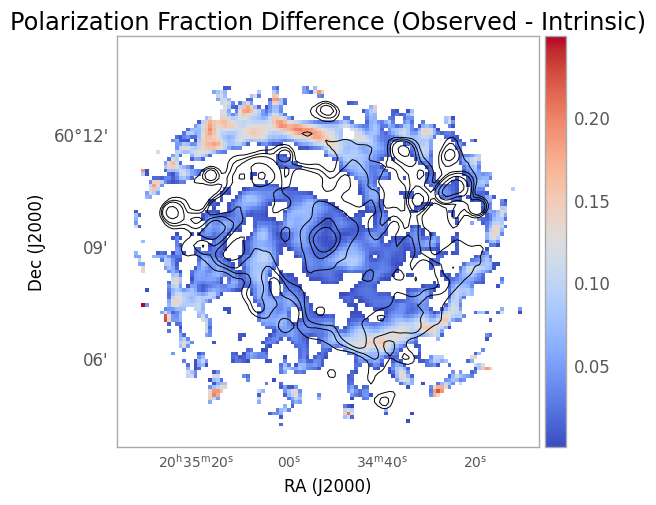

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import ImageNormalize, MinMaxInterval

# Load the polarization fraction maps
fits_file_pf_o = "/content/drive/MyDrive/SALSA_NGC6946/PF_obs.fits"
fits_file_pf_i = "/content/drive/MyDrive/SALSA_NGC6946/PF_intrs.fits"

hdul_pf_o = fits.open(fits_file_pf_o)
hdul_pf_i = fits.open(fits_file_pf_i)

pf_o = hdul_pf_o[0].data
pf_i = hdul_pf_i[0].data
header_pf_o = hdul_pf_o[0].header
wcs = WCS(header_pf_o, naxis=2)


hdul_pf_o.close()
hdul_pf_i.close()

# Calculate difference and mask negatives
pf_diff = pf_o - pf_i
pf_diff[pf_diff < 0] = np.nan

# --- Load total intensity for contours ---
I_fits = fits.open('/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits')
I_data = I_fits[0].data
if I_data.ndim > 2:
    I_data = I_data[0]
I_fits.close()

# Convert to Jy/arcsec²
beam_fwhm_arcsec = 18
pixel_size_arcsec = 6
beam_area = 1.133 * beam_fwhm_arcsec**2
pixel_area = pixel_size_arcsec**2
conversion_factor = pixel_area / beam_area
I_data_jy_pixel = I_data * conversion_factor
I_data_arcsec2 = I_data_jy_pixel / pixel_area

# Define contour levels
rms_jy_beam = 6e-5
rms_jy_pixel = rms_jy_beam * conversion_factor
rms_jy_arcsec2 = rms_jy_pixel / pixel_area
contour_levels = np.array([9, 12, 16, 32, 64, 128]) * rms_jy_arcsec2

# --- Plotting ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection=wcs)
ax.grid(False)

vmin = np.nanmin(pf_diff)
vmax = np.nanmax(pf_diff)
norm = ImageNormalize(pf_diff, interval=MinMaxInterval(), vmin=vmin, vmax=vmax)

im = ax.imshow(pf_diff, origin="lower", cmap="coolwarm", norm=norm)

# Add total intensity contours
ax.contour(np.squeeze(I_data_arcsec2), levels=contour_levels, colors='black', linewidths=0.7)


# Colorbar
cbar = fig.colorbar(im, ax=ax, pad=0.01, fraction=0.046, aspect=20)
cbar.set_label('', size=12)

# Labels and title
ax.set_title("Polarization Fraction Difference (Observed - Intrinsic)")
ax.set_xlabel("RA (J2000)", fontsize=12)
ax.set_ylabel("Dec (J2000)", fontsize=12)
ax.coords[0].set_axislabel("RA (J2000)", fontsize=12)
ax.coords[1].set_axislabel("Dec (J2000)", fontsize=12)
ax.coords[1].set_axislabel_position("l")
ax.coords[1].set_ticklabel_position("l")
ax.coords[0].set_axislabel_position("b")
ax.coords[0].set_ticklabel(size=10)

# Zoom in (if needed)
ax.set_xlim(15, 167 - 39)
ax.set_ylim(30, 141 - 1)

plt.tight_layout()
plt.show()


#SFR MAP

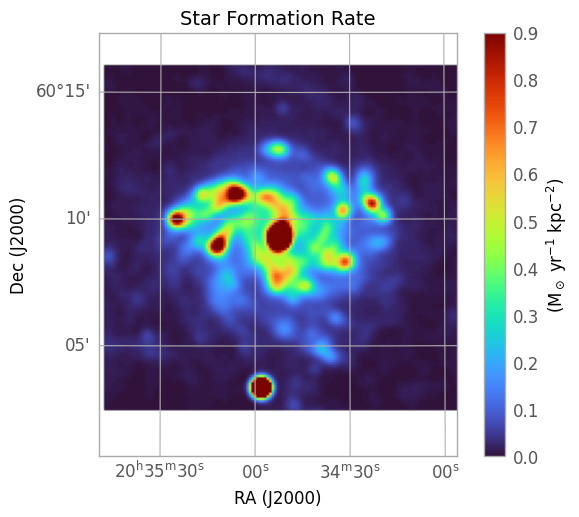

In [21]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize  # Import Normalize

SFR_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_SFR_18arcsec.fits'

with fits.open(SFR_path) as hdu:
    SFR = hdu[0].data
    header = hdu[0].header


vmin = 0
vmax = 0.9

wcs = WCS(header, naxis=2)


plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)
img = ax.imshow(SFR.squeeze(), origin='lower', norm=Normalize(vmin=vmin, vmax=vmax), cmap='turbo')
ax.set_title('Star Formation Rate', fontsize=14)
#plt.xlim([20, 167 - 42])
#plt.ylim([35, 141 - 1])

# Add WCS labels
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)

cbar = plt.colorbar(img, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(r'(M$_\odot$ yr$^{-1}$ kpc$^{-2}$)', fontsize=12)


plt.show()


In [22]:
print("SFR stats:")
print("min:", np.nanmin(SFR))
print("max:", np.nanmax(SFR))
print("log10 min:", np.nanmin(np.log10(SFR[SFR > 0])))
print("log10 max:", np.nanmax(np.log10(SFR[SFR > 0])))


SFR stats:
min: -0.004406472
max: 9.513154
log10 min: -5.9506216
log10 max: 0.97832453


#NHI map

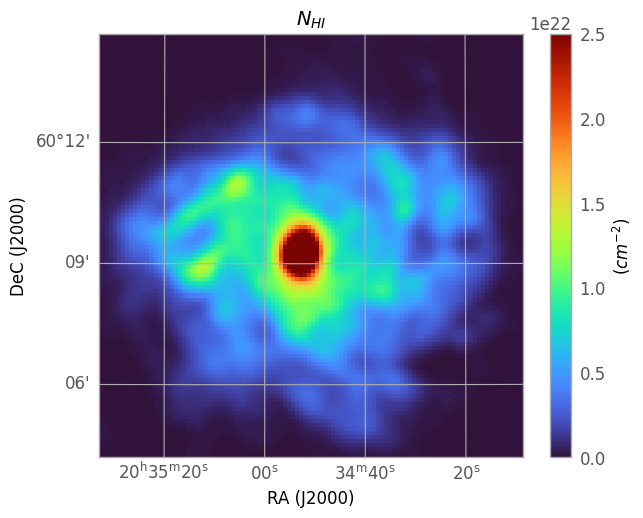

In [23]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize  # Import Normalize

NHI_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_NHI_18arcsec.fits'

with fits.open(NHI_path ) as hdu:
    NHI = hdu[0].data
    header = hdu[0].header


vmin = 0
vmax = 2.5e22

wcs = WCS(header, naxis=2)


plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)
img = ax.imshow(NHI.squeeze(), origin='lower', norm=Normalize(vmin=vmin, vmax=vmax), cmap='turbo')
ax.set_title('$N_{HI}$', fontsize=14)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])

# Add WCS labels
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('DeC (J2000)', fontsize=12)

cbar = plt.colorbar(img, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(r'($cm^{-2}$)', fontsize=12)


plt.show()


#co map

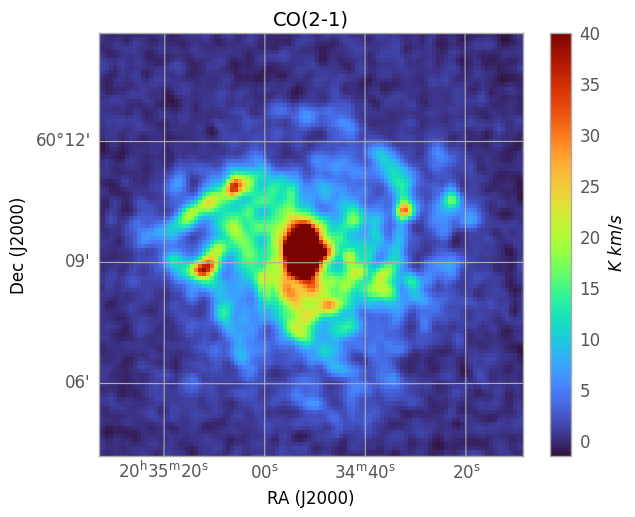

In [24]:
from inspect import CO_GENERATOR

CO_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_CO_18arcsec.fits'

with fits.open(CO_path) as hdu:
    CO = hdu[0].data
    header = hdu[0].header

# Determine the min and max values for normalization
vmin = 0
vmax = 40

# Create a WCS object from the header
wcs = WCS(header, naxis=2)

# Plot the SFR map with WCS
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)
img = ax.imshow(CO.squeeze(), origin='lower',vmax=vmax ,cmap='turbo')
ax.set_title('CO(2-1)', fontsize=14)
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
# Add WCS labels
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)

# Create the color bar and set its label
cbar = plt.colorbar(img, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(' $K~km/s$', fontsize=12)

# Display the plot
plt.show()

#$N_{H_2}$ column density

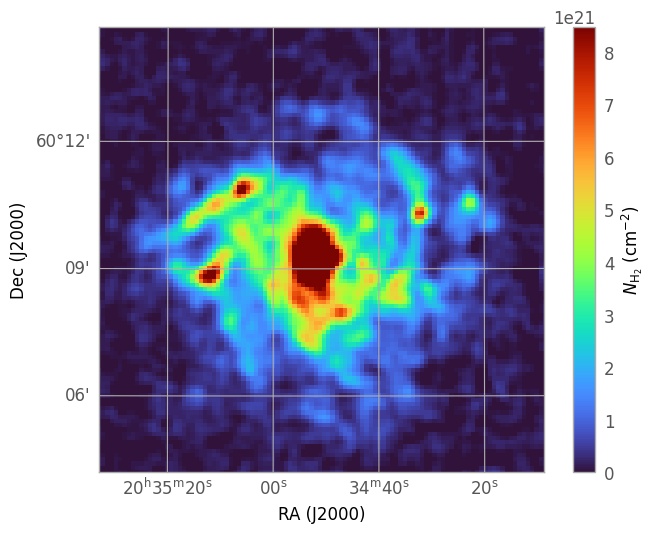

In [25]:



CO_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_CO_18arcsec.fits'

with fits.open(CO_path) as hdu:
    CO_21 = hdu[0].data.squeeze()  # CO(2–1) in K km/s
    header = hdu[0].header


# According to Leroy et al. (2009), the CO(2–1)/CO(1–0) ratio R21 ~ 0.8
R21 = 0.8
CO_10 = CO_21 / R21  # Convert CO(2–1) to CO(1–0)

X_CO = 2e20  # [cm^-2 / (K km/s)]

# Calculate molecular hydrogen column density
N_H2 = X_CO * CO_10  # Units: cm^-2

# --- Plotting the N_H2 map ---
wcs = WCS(header, naxis=2)

plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)

# Clip vmax for better contrast
vmax = np.nanpercentile(N_H2, 99)

img = ax.imshow(N_H2, origin='lower', cmap='turbo', vmin=0, vmax=vmax)
ax.set_title(r'', fontsize=14)
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)

cbar = plt.colorbar(img, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(r'$N_{\mathrm{H}_2}$ (cm$^{-2}$)', fontsize=12)

plt.tight_layout()
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()



#$N_{H_2}$ column density with different method by leory

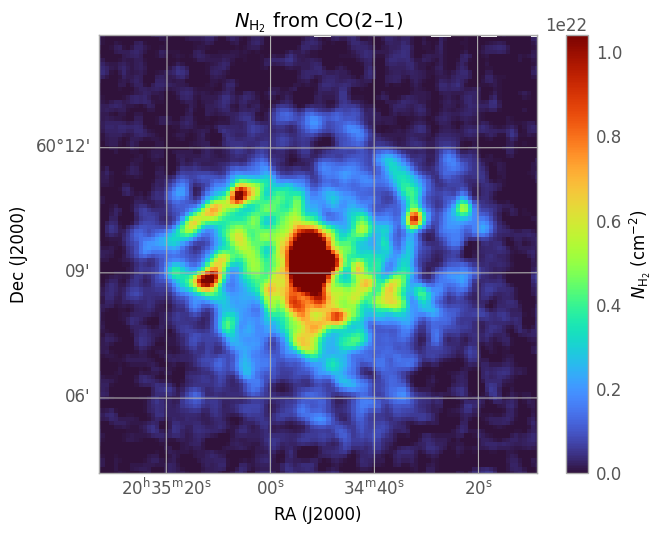

In [26]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy import units as u
import numpy as np
import matplotlib.pyplot as plt

# Load CO(2–1) map
CO_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_CO_18arcsec.fits'
with fits.open(CO_path) as hdu:
    CO_21 = hdu[0].data.squeeze()  # Units: K km/s
    header = hdu[0].header

# Constants
pixel_size_arcsec = 6.0
distance = 7.2e6 * u.pc  # distance to NGC 6946
mu = 2.8                 # mean molecular weight
m_H = 1.67e-24           # gram
Msun_to_g = 1.989e33     # gram

# Compute pixel solid angle in steradians (assuming square pixels)
pixel_scale_rad = (pixel_size_arcsec * u.arcsec).to(u.radian)
pixel_area_sr = pixel_scale_rad.value ** 2

# Compute pixel physical area in pc² and cm²
pix_area_pc2 = (pixel_area_sr * (distance.to(u.pc))**2).value  # in pc²
pix_area_cm2 = (pixel_area_sr * (distance.to(u.cm))**2).value  # in cm²

# HERACLES formula parameters
X2 = 1.0      # X_CO normalized to 2e20 cm^-2 / (K km/s)
R21 = 0.8     # Typical CO(2–1)/CO(1–0) line ratio
conversion_factor = 5.5 * X2 / R21

# Convert CO(2–1) map to luminosity per pixel
L_CO21 = CO_21 * pix_area_pc2  # [K km/s * pc²]

# Molecular hydrogen mass per pixel [M_sun]
M_H2 = conversion_factor * L_CO21

# Convert M_H2 to grams
M_H2_g = M_H2 * Msun_to_g

# Column density N_H2 in cm^-2
N_H2 = M_H2_g / (mu * m_H * pix_area_cm2)

# Plot N_H2 map
wcs = WCS(header, naxis=2)
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)
vmax = np.nanpercentile(N_H2, 99)
img = ax.imshow(N_H2, origin='lower', cmap='turbo', vmin=0, vmax=vmax)
ax.set_title(r'$N_{\mathrm{H}_2}$ from CO(2–1)', fontsize=14)
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'$N_{\mathrm{H}_2}$ (cm$^{-2}$)', fontsize=12)
plt.tight_layout()
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()


#Total column density map with CO ratio

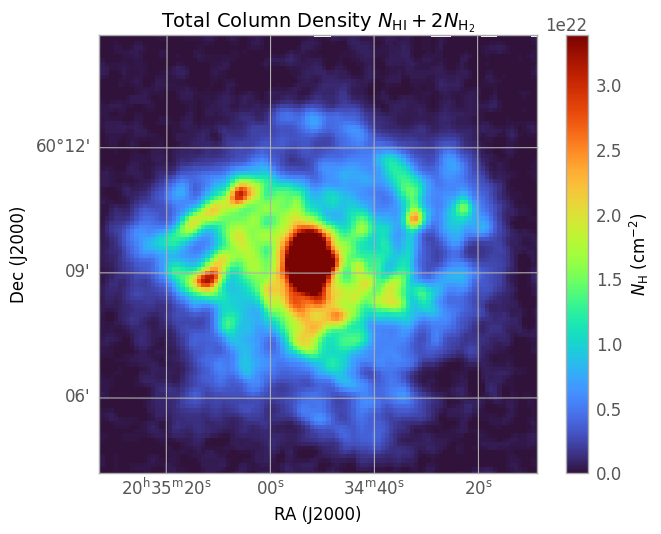

In [27]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# --- Load NHI Map ---
NHI_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_NHI_18arcsec.fits'
with fits.open(NHI_path) as hdu:
    N_HI = hdu[0].data.squeeze()  # [cm^-2]
    header = hdu[0].header

# --- Load CO(2–1) Map and Calculate N_H2 ---
CO_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_CO_18arcsec.fits'
with fits.open(CO_path) as hdu:
    CO_21 = hdu[0].data.squeeze()  # CO(2–1) in K km/s

# Convert CO(2–1) to CO(1–0) using R21 ratio
R21 = 0.8  # Leroy et al. (2009)
CO_10 = CO_21 / R21

# Use X_CO conversion factor (HERACLES standard)
X_CO = 2e20  # [cm^-2 / (K km/s)]
N_H2 = X_CO * CO_10  # [cm^-2]

# --- Calculate Total Column Density ---
N_total = N_HI + 2 * N_H2  # [cm^-2]

# --- Plot the Total Column Density Map ---
wcs = WCS(header, naxis=2)

plt.figure(figsize=(7, 5.5))
ax = plt.subplot(111, projection=wcs)

# Display range
vmin = 0
vmax = np.nanpercentile(N_total, 99)

img = ax.imshow(N_total, origin='lower', cmap='turbo', norm=Normalize(vmin=vmin, vmax=vmax))
ax.set_title(r'Total Column Density $N_{\mathrm{HI}} + 2N_{\mathrm{H}_2}$', fontsize=14)

# WCS axes
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)

# Colorbar
cbar = plt.colorbar(img, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(r'$N_{\mathrm{H}}$ (cm$^{-2}$)', fontsize=12)

# Match field of view to previous maps
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])

plt.tight_layout()
plt.show()

#RMS noise mask in 18''

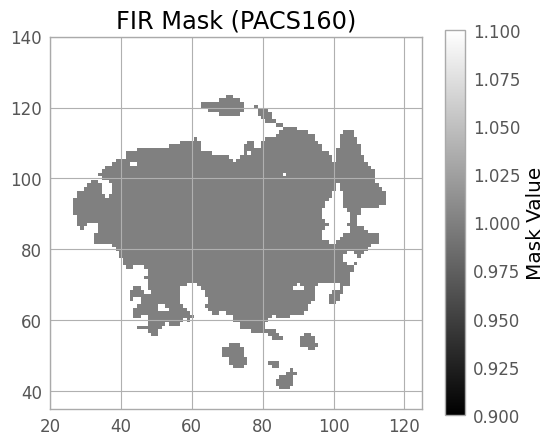

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# --- Load the mask from FITS ---
mask_path = '/content/drive/MyDrive/SALSA_NGC6946/FIRmask-PACS160.fits'
with fits.open(mask_path) as hdul:
    masktot = np.squeeze(hdul[0].data)

# --- Display the mask ---
plt.figure(figsize=(6, 5))
plt.imshow(masktot, cmap='gray', origin='lower')
plt.title('FIR Mask (PACS160)')
plt.colorbar(label='Mask Value')
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()



#Regional Mask in 18''

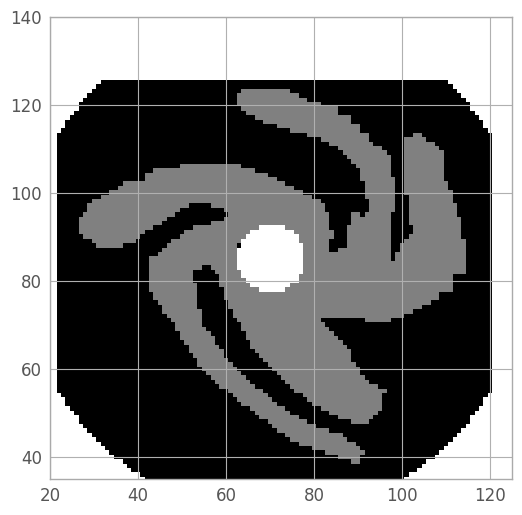

In [29]:
mask_path = '/content/drive/MyDrive/SALSA_NGC6946/regional_mask.fits'

with fits.open(mask_path) as hdu:
    regional_mask = hdu[0].data  # Assuming the data is in the primary HDU

arm = np.ones(np.shape(regional_mask))
interarm=np.ones(np.shape(regional_mask))
center=np.ones(np.shape(regional_mask))

arm[~(regional_mask==2)]='NaN'
interarm[~(regional_mask==1)]='NaN'
center[~(regional_mask==3)]='NaN'

plt.imshow(regional_mask, cmap='gray', origin='lower')
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()


#I,PI,PF vs SFR

In [30]:
masktot = masktot.astype(float)

In [31]:
masktot

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [32]:
def fun1(X, Y, mask):
    xx1 = np.ravel(X*mask)
    yy1 = np.ravel(Y*mask)
    finitemask = np.isfinite(xx1) & np.isfinite(yy1)
    xx1 = xx1[finitemask]
    yy1 = yy1[finitemask]
    return xx1, yy1

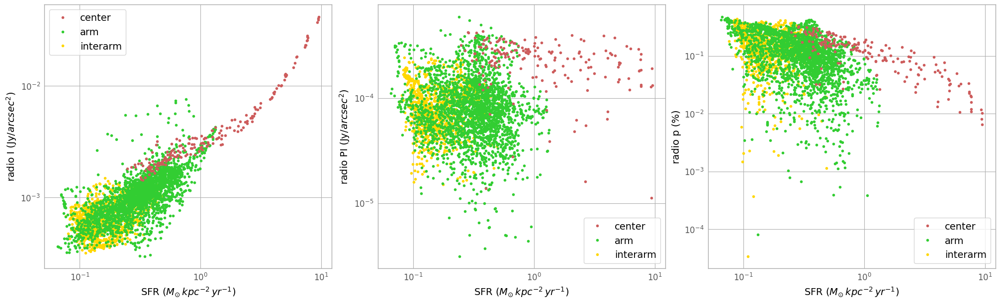

In [33]:

datasets = [
    (SFR, I_data_18arc, 'SFR ($M_{\odot}\,kpc^{-2}\,yr^{-1}$)', "radio I (Jy/$arcsec^2$)"),
    (SFR, PI_data_18arc, 'SFR ($M_{\odot}\,kpc^{-2}\,yr^{-1}$)', "radio PI (Jy/$arcsec^2$)"),
    (SFR, pf_obs_data, 'SFR ($M_{\odot}\,kpc^{-2}\,yr^{-1}$)', "radio p (%)"),
]
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, axes = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)

for ax, (x_data, y_data, xlabel, ylabel) in zip(axes, datasets):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid("major")
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

    for region, color in regions:
        x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))
        ax.plot(x, y, ".", color=color, zorder=3 if region == "center" else 2 if region == "arm" else 1, label=region)

    ax.legend(fontsize=14)

plt.show()

#I,PI,PF vs NHI

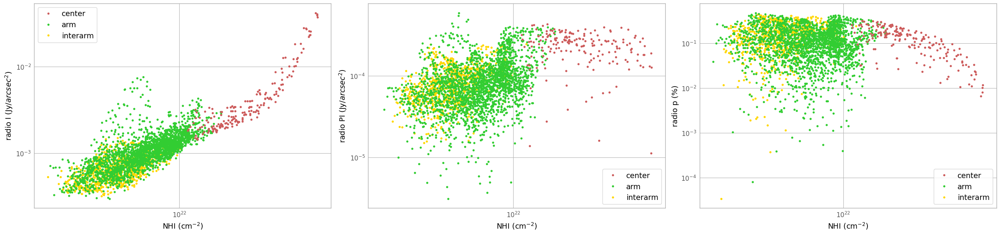

In [34]:


datasets = [
    (NHI, I_data_18arc, 'NHI (cm$^{-2}$)', "radio I (Jy/$arcsec^2$)"),
    (NHI, PI_data_18arc, 'NHI (cm$^{-2}$)', "radio PI (Jy/$arcsec^2$)"),
    (NHI, pf_obs_data, 'NHI (cm$^{-2}$)', "radio p (%)"),

]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create subplots for all datasets
fig, axes = plt.subplots(1, 3, figsize=(26, 6), constrained_layout=True)  # Updated to accommodate 4 datasets

# Loop through datasets and plot
for ax, (x_data, y_data, xlabel, ylabel) in zip(axes, datasets):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid("major")
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

    for region, color in regions:
        # Apply fun1 function to extract relevant x and y data for the region (using the masktot mask)
        x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))
        ax.plot(x, y, ".", color=color, zorder=3 if region == "center" else 2 if region == "arm" else 1, label=region)

    ax.legend(fontsize=14)

# Show the plot
plt.show()


#I,PI,PF vs CO

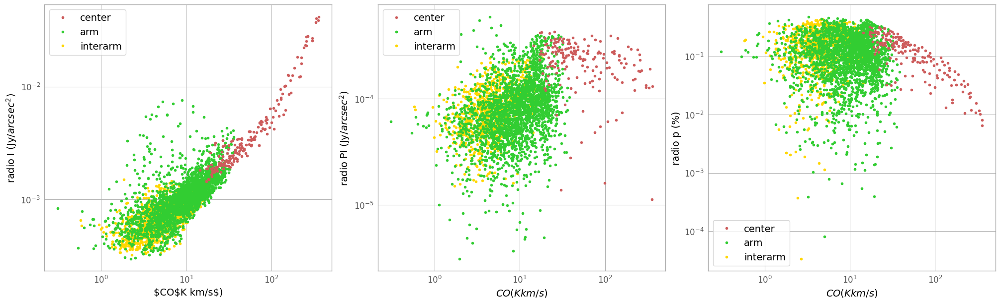

In [35]:

datasets = [
    (CO, I_data_18arc, '$CO$K km/s$)', "radio I (Jy/$arcsec^2$)"),
    (CO, PI_data_18arc, '$CO$($K km/s$)', "radio PI (Jy/$arcsec^2$)"),
    (CO, pf_obs_data, '$CO$($K km/s$)', "radio p (%)"),
]
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, axes = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)

for ax, (x_data, y_data, xlabel, ylabel) in zip(axes, datasets):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid("major")
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

    for region, color in regions:
        x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))
        ax.plot(x, y, ".", color=color, zorder=3 if region == "center" else 2 if region == "arm" else 1, label=region)

    ax.legend(fontsize=14)

plt.show()

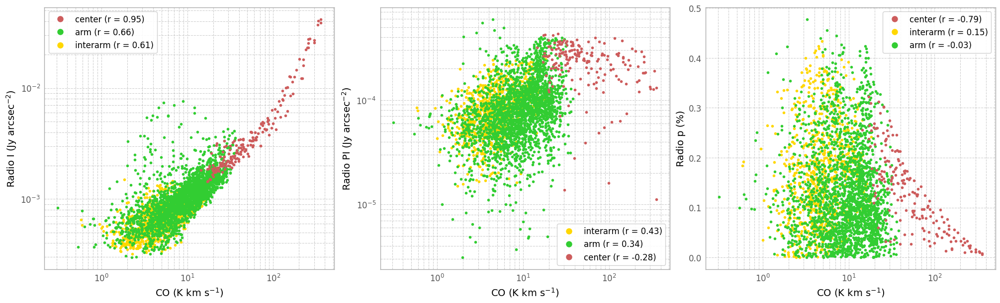

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

datasets = [
    (CO, I_data_18arc, 'CO (K km s$^{-1}$)', "Radio I (Jy arcsec$^{-2}$)"),
    (CO, PI_data_18arc, 'CO (K km s$^{-1}$)', "Radio PI (Jy arcsec$^{-2}$)"),
    (CO, pf_obs_data, 'CO (K km s$^{-1}$)', "Radio p (%)"),
]
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, axes = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)

for ax, (x_data, y_data, xlabel, ylabel) in zip(axes, datasets):
    ax.set_xscale("log")
    if ylabel != "Radio p (%)":  # Don't log-scale for percentage values
        ax.set_yscale("log")
    ax.grid(True, which="both", linestyle='--', alpha=0.6)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

    # Store correlation coefficients for sorting
    corr_data = []

    for region, color in regions:
        x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

        # Filter valid data points
        mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
        x = x[mask]
        y = y[mask]

        # Calculate Pearson correlation on log-transformed data (except for p%)
        if ylabel != "Radio p (%)":
            r, _ = pearsonr(np.log10(x), np.log10(y))
        else:
            r, _ = pearsonr(np.log10(x), y)

        # Plot points
        ax.plot(x, y, ".", color=color,
                zorder=3 if region == "center" else 2 if region == "arm" else 1,
                label=f"{region} (r = {r:.2f})")

        corr_data.append((r, region, color))

    # Sort legend by correlation strength (descending)
    corr_data.sort(reverse=True, key=lambda x: abs(x[0]))

    # Create custom legend entries
    legend_handles = []
    for r, region, color in corr_data:
        legend_handles.append(plt.Line2D([0], [0], marker='o', color='w',
                                      markerfacecolor=color, markersize=10,
                                      label=f"{region} (r = {r:.2f})"))

    ax.legend(handles=legend_handles, fontsize=12, framealpha=0.9)

plt.show()

#Intrinsic fraction vs SFR,CO,NHI

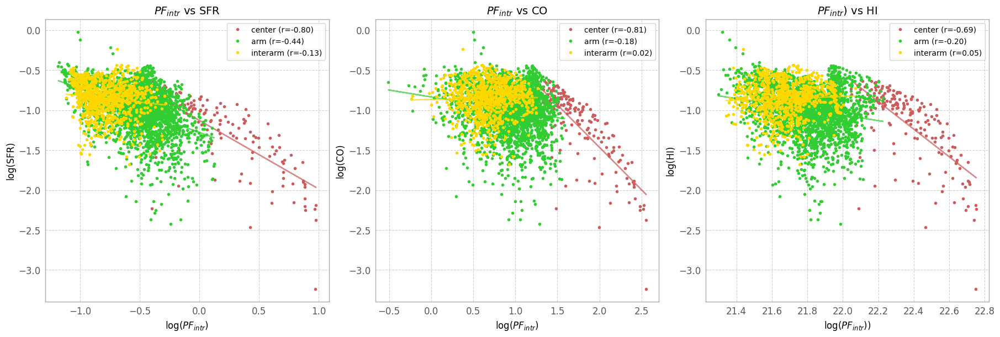

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from astropy.io import fits

# Load the PF data
pf_intr = fits.open('/content/drive/MyDrive/SALSA_NGC6946/PF_intrs.fits')
pf = pf_intr[0].data  # Assuming this is the data you want to use

# Assuming SFR, CO, and NHI are already loaded in your environment
# SFR = ... [your SFR data]
# CO = ... [your CO data]
# NHI = ... [your NHI data]

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Define datasets to plot
datasets = [
    (SFR, pf, '$PF_{intr}$', 'SFR'),
    (CO, pf, '$PF_{intr}$', 'CO'),
    (NHI, pf, '$PF_{intr}$)', 'HI')
]

# Loop over datasets and create individual plots
for i, (x_data, y_data, xlabel, ylabel) in enumerate(datasets):
    ax = axes[i]

    # Loop over regions and apply corresponding masks
    for region, color in regions:
        # Apply region-specific mask
        x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))  # Using masktot

        # Mask invalid or non-positive values
        mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
        x = x[mask]
        y = y[mask]

        # Apply log transformation (optional)
        x_log = np.log10(x)
        y_log = np.log10(y)

        # Perform linear regression
        slope, intercept, r_value, _, _ = linregress(x_log, y_log)
        fit_y_log = slope * x_log + intercept  # Fit line in log-log space

        # Plot data points for each region
        ax.plot(x_log, y_log, '.', color=color, label=f"{region} (r={r_value:.2f})")

        # Plot the fit line for each region
        ax.plot(x_log, fit_y_log, '-', color=color, alpha=0.7)

    # Set labels and grid
    ax.set_xlabel(f'log({xlabel})', fontsize=12)
    ax.set_ylabel(f'log({ylabel})', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(fontsize=10)
    ax.set_title(f'{xlabel} vs {ylabel}', fontsize=14)

# Show the plot
plt.show()


# SFR vs CO

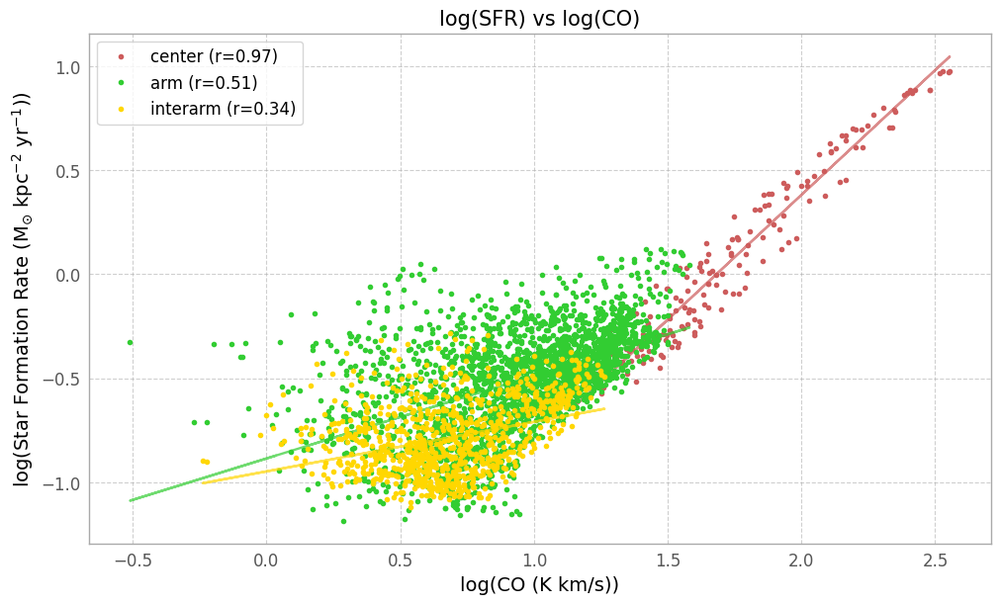

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Assume CO and SFR data are already loaded (e.g., CO, SFR)
# Example datasets
datasets = [
    (CO, SFR, 'CO (K km/s)', 'Star Formation Rate (M$_{\odot}$ kpc$^{-2}$ yr$^{-1}$)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

x_data, y_data, xlabel, ylabel = datasets[0]

# Update axis labels to reflect the log scale
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

# Loop through each region and plot the data
for region, color in regions:
    # Extract data for the current region
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask invalid or non-positive values (log requires > 0)
    mask = (x > 0) & (y > 0)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Perform linear regression in log space
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y_log = slope * x_log + intercept  # Linear fit in log space

    # Plot the data points
    ax.plot(x_log, y_log, '.', color=color, label=f"{region} (r={r_value:.2f})")

    # Plot the linear fit line
    ax.plot(x_log, fit_y_log, '-', color=color, alpha=0.7)

# Add legend
ax.legend(fontsize=12)
plt.title('log(SFR) vs log(CO)', fontsize=15)

# Show plot
plt.show()


#SFR vs HI

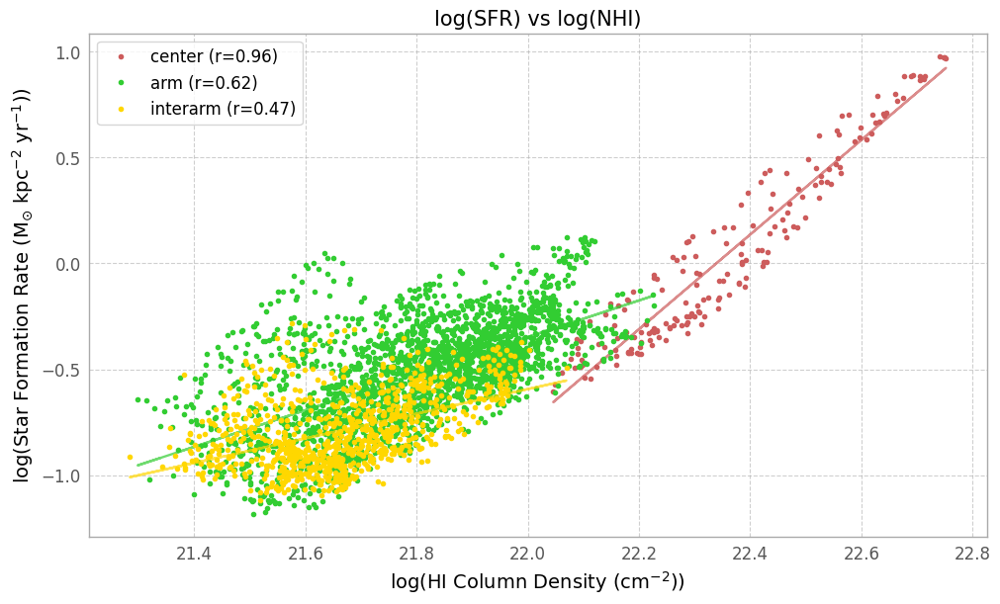

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Assume NHI and SFR data are already loaded (e.g., NHI, SFR)
# Example datasets
datasets = [
    (NHI, SFR, 'HI Column Density (cm$^{-2}$)', 'Star Formation Rate (M$_{\odot}$ kpc$^{-2}$ yr$^{-1}$)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

x_data, y_data, xlabel, ylabel = datasets[0]

# Update axis labels to reflect the log scale
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

# Loop through each region and plot the data
for region, color in regions:
    # Extract data for the current region
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask invalid or non-positive values (log requires > 0)
    mask = (x > 0) & (y > 0)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Perform linear regression in log space
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y_log = slope * x_log + intercept  # Linear fit in log space

    # Plot the data points
    ax.plot(x_log, y_log, '.', color=color, label=f"{region} (r={r_value:.2f})")

    # Plot the linear fit line
    ax.plot(x_log, fit_y_log, '-', color=color, alpha=0.7)

# Add legend
ax.legend(fontsize=12)
plt.title('log(SFR) vs log(NHI)', fontsize=15)

# Show plot
plt.show()


#PA_FIR vs PA_radio

#Magnetic field

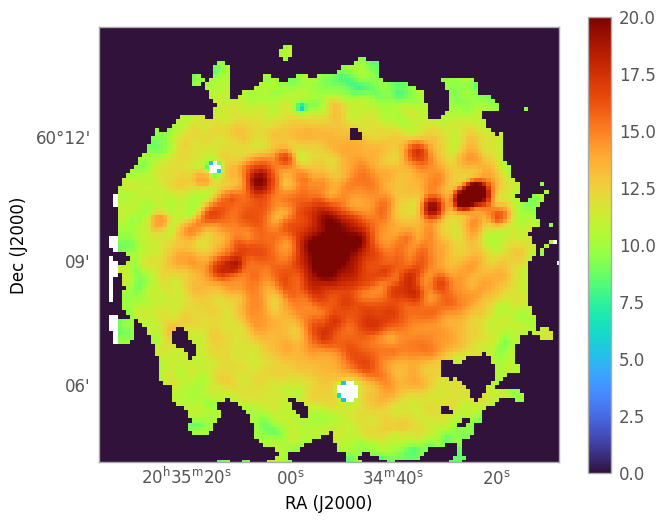

Magnetic field strength map saved as /content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits


In [40]:
import numpy as np
from scipy.special import gamma
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS

# Constants
E_p = 1.5033e-3  # Proton rest energy in erg
c1 = 6.26428e18  # erg^-2 s^-1 G^-1
c3 = 1.86558e-23  # erg G^-1 sterad^-1

# Function to calculate c2(alpha)
def calculate_c2(alpha):
    term1 = (alpha + 5/3) / (alpha + 1)
    term2 = gamma((3 * alpha + 1) / 6)
    term3 = gamma((3 * alpha + 5) /6)
    c2 = 0.25 * c3 * term1 * term2 * term3
    return c2

# Function to calculate c4(i) for isotropic turbulent field
def calculate_c4(alpha):
    return (np.cos(38*np.pi/180))**(alpha+1)

# Function to compute the equipartition magnetic field strength
def compute_B_eq(alpha, K0, I_nu, nu, l):
    # Calculate c2(alpha)
    c2 = calculate_c2(alpha)

    # Calculate c4(i) for isotropic turbulent field
    c4 = calculate_c4(alpha)

    # Calculate the term (nu / (2 * c1))^alpha
    nu_term = (nu / (2 * c1)) ** alpha

    # Calculate the numerator
    numerator = 4 * np.pi * (2 * alpha + 1) * (K0 + 1) * I_nu * (E_p ** (1 - 2 * alpha)) * nu_term

    # Calculate the denominator
    denominator = (2 * alpha - 1) * c2 * l * c4

    # Calculate B_eq
    B_eq = (numerator / denominator) ** (1 / (alpha + 3))*1e6

    return B_eq


nonthermal_file = '/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits'  # Renamed for clarity
nonthermal_hdu = fits.open(nonthermal_file)  # Open the FITS file
nonthermal_data = nonthermal_hdu[0].data  # Extract the data from the HDUList

theta_min = 18
theta_maj = 18
beam = 1.13 * (theta_maj * theta_min) * (1 / 206265) ** 2
I_nu = nonthermal_data *10**(-23) / beam  #The unit of non-thermal map is microJy/beam
alpha = 1  # Spectral index
K0 = 100  # Proton-to-electron number density ratio
nu = 5e9  # Frequency in Hz
l = 1/np.cos(38*np.pi/180)  # Pathlength in kpc (convert to cm)
l_cm = l * 3.086e21  # Convert kpc to cm

B_eq = compute_B_eq(alpha, K0, I_nu, nu, l_cm)


wcs = WCS(nonthermal_hdu[0].header, naxis=2)  # Explicitly specify naxis for 2D WCS
# Check if there's a celestial WCS
if wcs.has_celestial:
    wcs = wcs.celestial
else:
    print("No celestial WCS found in the header.")


# Plot the magnetic field strength map
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(projection=wcs)  # Use the WCS for the plot
img = ax.imshow(B_eq.squeeze(), origin='lower', vmax=20, cmap='turbo')  # Display B_eq
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'', fontsize=12)
ax.set_title('', fontsize=14)
ax.set_xlabel('RA (J2000)', fontsize=12)
ax.set_ylabel('Dec (J2000)', fontsize=12)
ax.grid(False)  # Disable grid
plt.tight_layout()
plt.xlim([15, 167 - 41])
plt.ylim([35, 141 - 1])
plt.show()
new_header = nonthermal_hdu[0].header.copy()


output_fits_file = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"

# Create a new PrimaryHDU with B_eq and the header
hdu = PrimaryHDU(data=B_eq.squeeze(), header=new_header)
hdu.writeto(output_fits_file, overwrite=True)

print(f"Magnetic field strength map saved as {output_fits_file}")

In [41]:
b_field_hdu = fits.open('/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits')
B_field = b_field_hdu[0].data
header = b_field_hdu[0].header

#Magnetic energy density

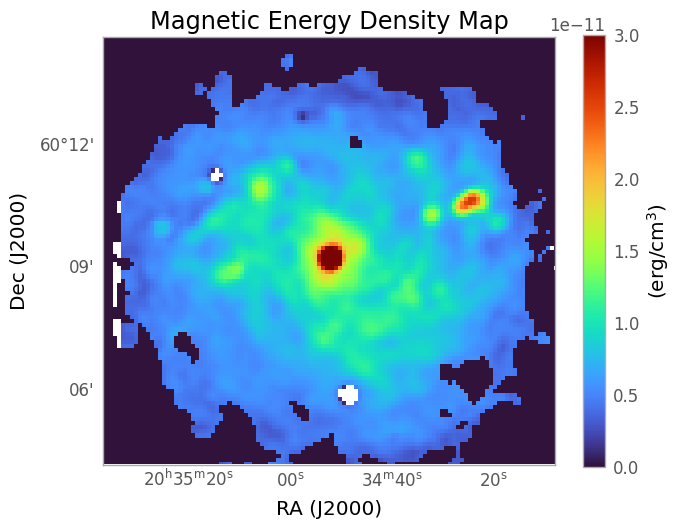

Magnetic energy density map saved as: /content/drive/MyDrive/SALSA_NGC6946/magnetic_energy_density


In [42]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# Constants
muG_to_G = 1e-6  # Convert microGauss to Gauss
U_B_factor = 8 * np.pi

# Load B_eq and header
B_eq_fits = '/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits'
with fits.open(B_eq_fits) as hdu:
    B_eq = hdu[0].data
    header = hdu[0].header

# Compute energy density
B_G = B_eq * muG_to_G
U_B = B_G**2 / U_B_factor  # erg/cm^3

# WCS setup
wcs = WCS(header, naxis=2) if "CTYPE1" in header else None

# Plot
plt.figure(figsize=(7, 5.5))
if wcs:
    ax = plt.subplot(projection=wcs)
else:
    ax = plt.subplot()

img = ax.imshow(U_B.squeeze(), origin='lower', vmax=3e-11, cmap='turbo')
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'$(\mathrm{erg}/\mathrm{cm}^3)$')
ax.set_title('Magnetic Energy Density Map')
ax.set_xlabel('RA (J2000)')
ax.set_ylabel('Dec (J2000)')
ax.grid(False)  # Disable grid
plt.tight_layout()
plt.xlim([15, 167 - 41])
plt.ylim([35, 141 - 1])
plt.show()

# Save as FITS
output_file = "/content/drive/MyDrive/SALSA_NGC6946/magnetic_energy_density"
hdu = fits.PrimaryHDU(U_B.astype(np.float32), header=header)
hdu.writeto(output_file, overwrite=True)

print(f"Magnetic energy density map saved as: {output_file}")


In [43]:
U_B_tot_hdu = fits.open('/content/drive/MyDrive/SALSA_NGC6946/magnetic_energy_density')
U_B_tot = U_B_tot_hdu[0].data
header = U_B_tot_hdu[0].header

#Thermal energy density

In [44]:
from astropy.io import fits
import numpy as np

# Load the FITS files
total_fits = fits.open("/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits")
nonthermal_fits = fits.open("/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits")

# Extract the data arrays
total_data = total_fits[0].data
nonthermal_data = nonthermal_fits[0].data

# Ensure the dimensions match
if total_data.shape != nonthermal_data.shape:
    raise ValueError("Total and Nonthermal maps must have the same dimensions!")

# Compute the thermal intensity map
thermal_data = total_data - nonthermal_data

# Save the thermal map as a new FITS file
hdu = fits.PrimaryHDU(thermal_data, header=total_fits[0].header)
hdu.writeto("/content/drive/MyDrive/SALSA_NGC6946/thermal_intensity_6cm_18arcsec.fits", overwrite=True)

# Close the FITS files
total_fits.close()
nonthermal_fits.close()

print("Thermal intensity map saved as 'thermal_intensity.fits'.")


Thermal intensity map saved as 'thermal_intensity.fits'.


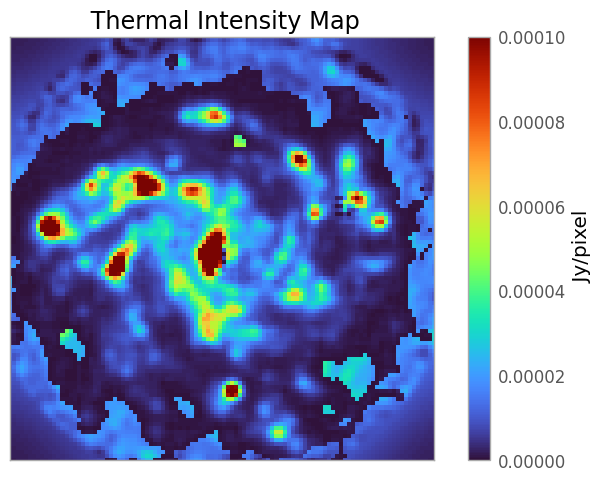

In [45]:
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import simple_norm

# Load the thermal FITS file
thermal_fits = fits.open("/content/drive/MyDrive/SALSA_NGC6946/thermal_intensity_6cm_18arcsec.fits")
thermal_data = thermal_fits[0].data
thermal_fits.close()

beam_area = 1.133 * 18 * 18  # Beam area in arcsec^2
pixel_area = 6 * 6  # Pixel area in arcsec^2
conversion_factor = pixel_area / beam_area

thermal_data = thermal_data*conversion_factor
# Set normalization with vmin and vmax inside simple_norm
norm = simple_norm(thermal_data, 'linear', min_cut=0, max_cut=0.0001)

# Plot the thermal intensity map
plt.figure(figsize=(9, 5.5))
plt.imshow(thermal_data.squeeze(), origin='lower', cmap='turbo', norm=norm)
cbar = plt.colorbar()
cbar.set_label(' Jy/pixel')
#plt.contour(I_data_jy_pixel.squeeze(),levels=levels,colors='k')
plt.title(" Thermal Intensity Map")
plt.xticks([])
plt.yticks([])
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()


In [46]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

# Load thermal and total intensity maps
thermal_path = '/content/drive/MyDrive/SALSA_NGC6946/thermal_intensity_6cm_18arcsec.fits'
total_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits'

thermal_data = fits.getdata(thermal_path).squeeze()
total_data = fits.getdata(total_path).squeeze()

# Load FIR mask
masktot = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/FIRmask-PACS160.fits').squeeze()

# Load regional mask
regional_mask = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/regional_mask.fits')

# Build logical masks for each region
regions = {
    "Arm": regional_mask == 2,
    "Interarm": regional_mask == 1,
    "Center": regional_mask == 3
}

# Apply FIR mask (assuming 1 is valid and 0 is invalid)
valid_fir = masktot > 0

# Compute thermal fraction for each region
results = {}
for name, region_mask in regions.items():
    combined_mask = region_mask & valid_fir & np.isfinite(thermal_data) & np.isfinite(total_data)

    thermal_sum = np.nansum(thermal_data[combined_mask])
    total_sum = np.nansum(total_data[combined_mask])

    thermal_fraction = thermal_sum / total_sum if total_sum > 0 else np.nan
    results[name] = {
        'Thermal Flux': thermal_sum,
        'Total Flux': total_sum,
        'Thermal Fraction': thermal_fraction
    }

# Print results
for region, data in results.items():
    print(f"\nRegion: {region}")
    print(f"  Thermal Flux: {data['Thermal Flux']:.3e}")
    print(f"  Total Flux:   {data['Total Flux']:.3e}")
    print(f"  Thermal Fraction: {data['Thermal Fraction']:.3%}")



Region: Arm
  Thermal Flux: 6.576e-01
  Total Flux:   2.709e+00
  Thermal Fraction: 24.272%

Region: Interarm
  Thermal Flux: 9.607e-02
  Total Flux:   6.120e-01
  Thermal Fraction: 15.699%

Region: Center
  Thermal Flux: 2.136e-01
  Total Flux:   1.043e+00
  Thermal Fraction: 20.472%


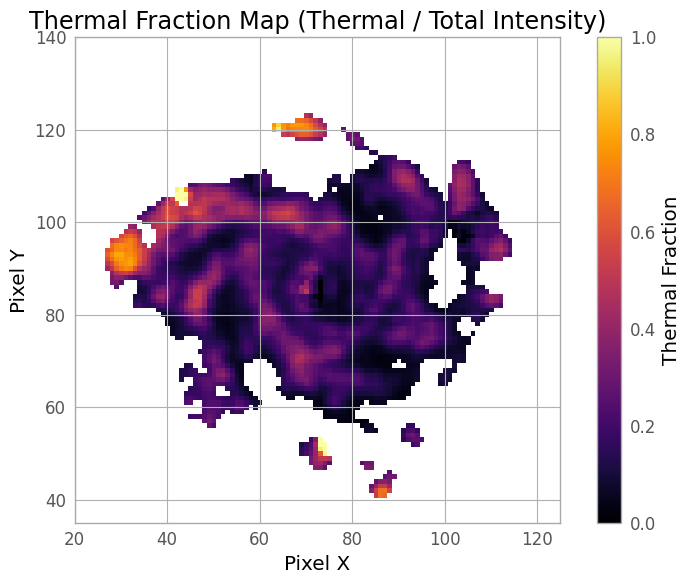

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# Load the maps again
thermal_data = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/thermal_intensity_6cm_18arcsec.fits').squeeze()
total_data = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_I.fits').squeeze()
masktot = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/FIRmask-PACS160.fits').squeeze()

# Avoid division by zero or bad values
valid_mask = (total_data > 0) & (masktot > 0) & np.isfinite(thermal_data) & np.isfinite(total_data)

# Initialize map with NaNs
thermal_fraction_map = np.full_like(thermal_data, np.nan, dtype=np.float64)

# Compute pixel-wise thermal fraction
thermal_fraction_map[valid_mask] = thermal_data[valid_mask] / total_data[valid_mask]

# Plot the thermal fraction map
plt.figure(figsize=(8, 6))
im = plt.imshow(thermal_fraction_map, origin='lower', cmap='inferno', vmin=0, vmax=1)
plt.colorbar(im, label='Thermal Fraction')
plt.title('Thermal Fraction Map (Thermal / Total Intensity)')
plt.xlabel('Pixel X')
plt.ylabel('Pixel Y')
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.tight_layout()
plt.show()


#Synchrotron emission for turbulent

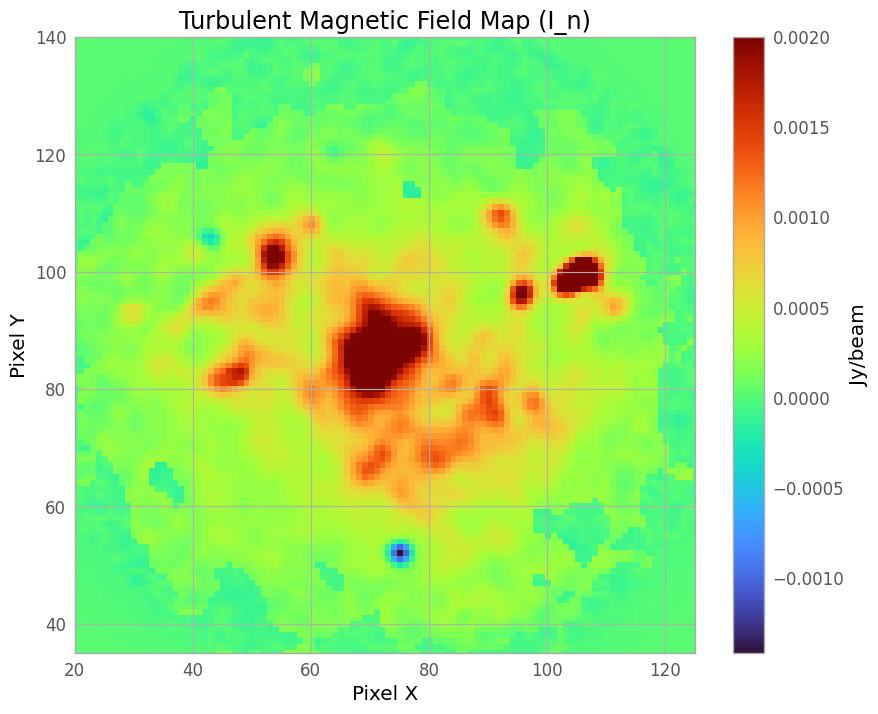

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits


I_synch_file = "/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits"
PI_file = "/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits"


with fits.open(I_synch_file) as hdu_synch, fits.open(PI_file) as hdu_pi:
    I_synch = hdu_synch[0].data
    PI = hdu_pi[0].data


I_n = I_synch - (PI / 0.75)

plt.figure(figsize=(10, 8))
plt.imshow(I_n.squeeze(), origin='lower',vmax=0.0020 ,cmap='turbo', aspect='auto')
plt.colorbar(label="Jy/beam")
plt.title("Turbulent Magnetic Field Map (I_n)")
plt.xlabel("Pixel X")
plt.ylabel("Pixel Y")
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()


Saved Jy/arcsec² FITS to: /content/drive/MyDrive/SALSA_NGC6946/I_n_18arcsec_arcsec2.fits


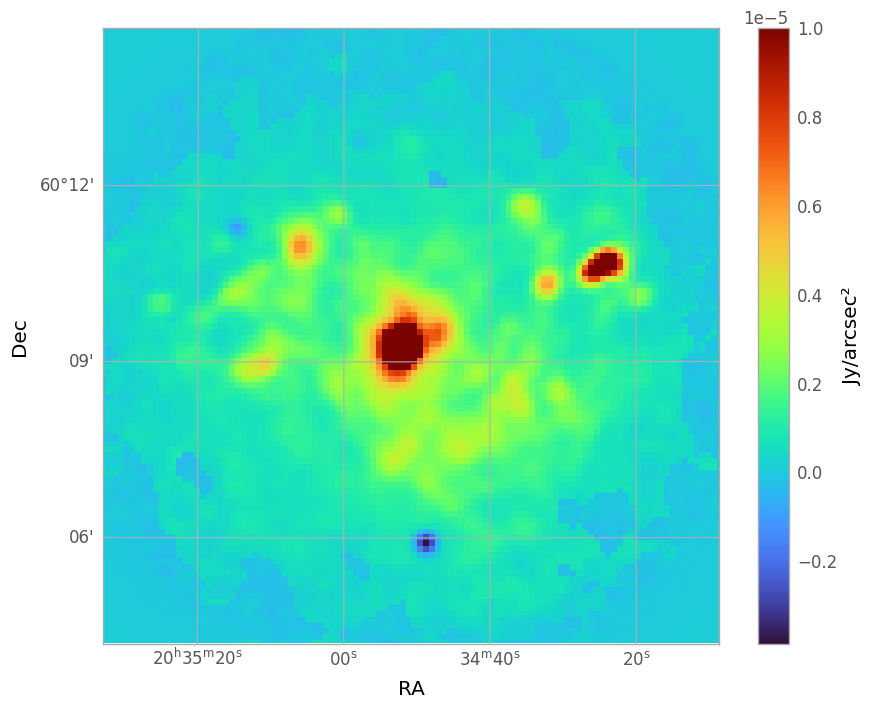

In [49]:


# File paths
I_synch_file = "/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits"
PI_file = "/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits"
output_fits = "/content/drive/MyDrive/SALSA_NGC6946/I_n_18arcsec_arcsec2.fits"

# Load FITS data
with fits.open(I_synch_file) as hdu_synch, fits.open(PI_file) as hdu_pi:
    I_synch_data = hdu_synch[0].data
    PI_data = hdu_pi[0].data
    header = hdu_synch[0].header.copy()

# Compute I_n (non-thermal)
I_n_beam = I_synch_data - (PI_data / 0.75)

# Beam size (18 arcsec FWHM circular)
beam_arcsec = 18  # arcsec
bmaj_arcsec = bmin_arcsec = beam_arcsec
bmaj_deg = bmaj_arcsec / 3600
bmin_deg = bmin_arcsec / 3600

# Optional: update header if missing
header['BMAJ'] = bmaj_deg
header['BMIN'] = bmin_deg

# Compute beam area in arcsec²
beam_area_arcsec2 = (np.pi * bmaj_arcsec * bmin_arcsec) / (4 * np.log(2))

# Convert from Jy/beam to Jy/arcsec²
I_n_arcsec2 = I_n_beam / beam_area_arcsec2

# Save to new FITS
hdu_out = fits.PrimaryHDU(I_n_arcsec2, header=header)
hdu_out.writeto(output_fits, overwrite=True)
print(f"Saved Jy/arcsec² FITS to: {output_fits}")

# Plot with WCS
wcs = WCS(header,naxis=2)
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs)
im = ax.imshow(I_n_arcsec2.squeeze(), origin='lower', cmap='turbo', vmax=1e-5)
plt.colorbar(im, ax=ax, label='Jy/arcsec²')
ax.set_title("")
ax.set_xlabel("RA")
ax.set_ylabel("Dec")
plt.xlim([20, 167 - 42])
plt.ylim([35, 141 - 1])
plt.show()


#Turbulent magnetic field

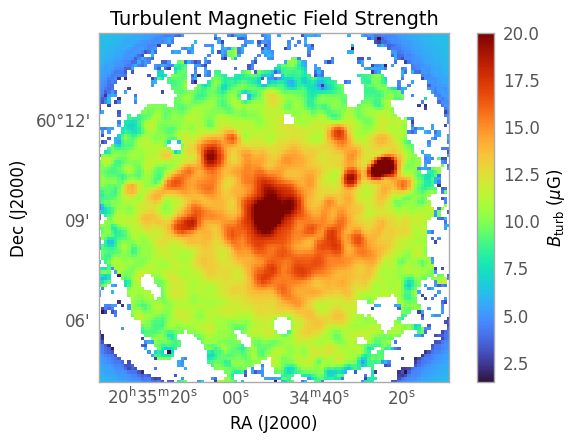

Magnetic field strength map saved as /content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits


In [50]:
import numpy as np
from scipy.special import gamma
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS

# Constants
E_p = 1.5033e-3  # Proton rest energy in erg
c1 = 6.26428e18  # erg^-2 s^-1 G^-1
c3 = 1.86558e-23  # erg G^-1 sterad^-1

# Function to calculate c2(alpha)
def calculate_c2(alpha):
    term1 = (alpha + 5/3) / (alpha + 1)
    term2 = gamma((3 * alpha + 1) / 6)
    term3 = gamma((3 * alpha + 5) / 6)
    c2 = 0.25 * c3 * term1 * term2 * term3
    return c2

# Function to calculate c4(i) for isotropic turbulent field
def calculate_c4(alpha):
    return (np.cos(38 * np.pi / 180)) ** (alpha + 1)

# Function to compute the equipartition magnetic field strength
def compute_B_eq(alpha, K0, I_nu, nu, l):
    c2 = calculate_c2(alpha)
    c4 = calculate_c4(alpha)
    nu_term = (nu / (2 * c1)) ** alpha
    numerator = 4 * np.pi * (2 * alpha + 1) * (K0 + 1) * I_nu * (E_p ** (1 - 2 * alpha)) * nu_term
    denominator = (2 * alpha - 1) * c2 * l * c4
    B_eq = (numerator / denominator) ** (1 / (alpha + 3)) * 1e6  # microGauss
    return B_eq

# Load FITS files
I_synch_file = "/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits"
PI_file = "/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits"

with fits.open(I_synch_file) as hdu_synch, fits.open(PI_file) as hdu_pi:
    I_synch = hdu_synch[0].data
    PI = hdu_pi[0].data
    header = hdu_synch[0].header

# Compute non-polarized synchrotron intensity
I_n = I_synch - (PI / 0.75)

# Beam parameters and unit conversion
theta_min = 18  # arcsec
theta_maj = 18  # arcsec
beam = 1.13 * (theta_maj * theta_min) * (1 / 206265) ** 2  # sr
I_nu = I_n * 1e-23 / beam  # microJy/beam to erg/cm^2/s/Hz/sr

# Parameters
alpha = 1
K0 = 100
nu = 5e9  # Hz
l_kpc = 1 / np.cos(38 * np.pi / 180)
l_cm = l_kpc * 3.086e21

# Compute magnetic field
B_eq = compute_B_eq(alpha, K0, I_nu, nu, l_cm)

# WCS setup
wcs = WCS(header, naxis=2)
if wcs.has_celestial:
    wcs = wcs.celestial
else:
    print("No celestial WCS found.")

# Plot
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(projection=wcs)
img = ax.imshow(B_eq.squeeze(), origin='lower', vmax=20, cmap='turbo')
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'$B_{\mathrm{turb}}$ ($\mu$G)', fontsize=12)
ax.set_title("Turbulent Magnetic Field Strength", fontsize=14)
ax.set_xlabel("RA (J2000)", fontsize=12)
ax.set_ylabel("Dec (J2000)", fontsize=12)
ax.set_xlim([20, 167 - 42])
ax.set_ylim([35, 141 - 1])
ax.grid(False)
plt.tight_layout()
plt.show()

# Save the computed turbulent field as FITS
output_fits_file = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"
hdu = fits.PrimaryHDU(B_eq.squeeze(), header=header)
hdu.writeto(output_fits_file, overwrite=True)

print(f"Magnetic field strength map saved as {output_fits_file}")



In [51]:
b_turb_hdu = fits.open('/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits')
B_turb = b_turb_hdu[0].data
header = b_turb_hdu[0].header

#Histogram of $B_{turb}$ without mask_tot

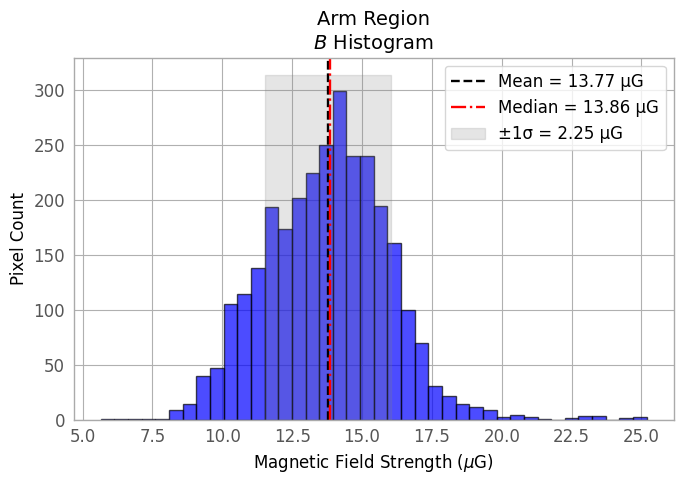

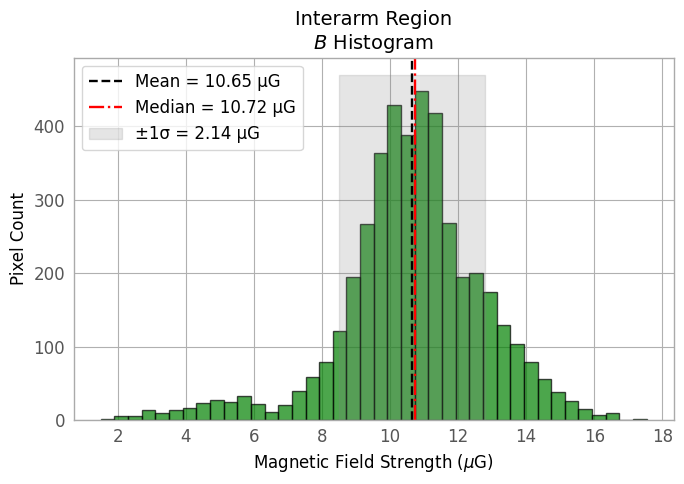

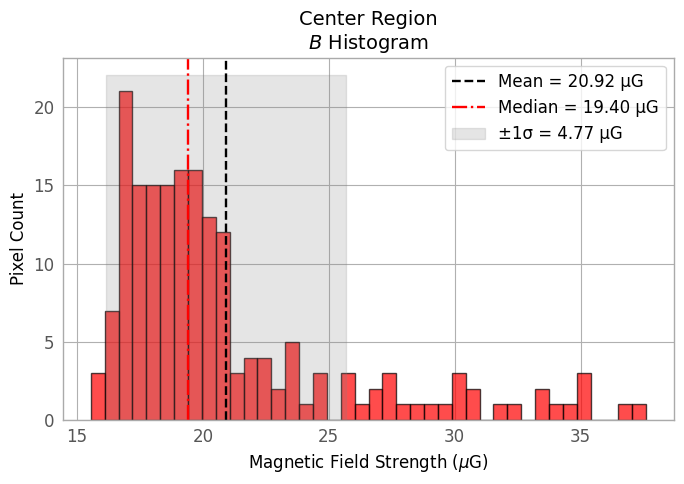


📍 Arm Region Stats:
Mean: 13.775 μG
Median: 13.860 μG
Std Dev: 2.251 μG
Std Error: 0.042 μG

📍 Interarm Region Stats:
Mean: 10.649 μG
Median: 10.724 μG
Std Dev: 2.139 μG
Std Error: 0.033 μG

📍 Center Region Stats:
Mean: 20.925 μG
Median: 19.403 μG
Std Dev: 4.767 μG
Std Error: 0.351 μG


In [52]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# --- Load your actual magnetic field data ---
# Change this path depending on which field you're working with (e.g. B_eq, B_turb, B_ord)
field_fits_path = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"
with fits.open(field_fits_path) as hdul:
    field_data = np.squeeze(hdul[0].data)

# --- Load regional mask ---
mask_path = "/content/drive/MyDrive/SALSA_NGC6946/regional_mask.fits"
with fits.open(mask_path) as hdul:
    regional_mask = hdul[0].data

# --- Define region-specific masks ---
arm_mask = np.ones_like(regional_mask)
interarm_mask = np.ones_like(regional_mask)
center_mask = np.ones_like(regional_mask)

arm_mask[regional_mask != 2] = np.nan
interarm_mask[regional_mask != 1] = np.nan
center_mask[regional_mask != 3] = np.nan

# --- Helper to extract finite values in masked region ---
def fun1(X, Y, mask):
    xx1 = np.ravel(X * mask)
    yy1 = np.ravel(Y * mask)
    finitemask = np.isfinite(xx1) & np.isfinite(yy1)
    xx1 = xx1[finitemask]
    yy1 = yy1[finitemask]
    return xx1, yy1

# --- Histogram + stats ---
def plot_histogram(data, region_name, color):
    mean_val = np.mean(data)
    median_val = np.median(data)
    std_val = np.std(data)
    stderr = std_val / np.sqrt(len(data))

    plt.figure(figsize=(7, 5))
    plt.hist(data, bins=40, color=color, alpha=0.7, edgecolor='black')
    plt.axvline(mean_val, color='k', linestyle='--', label=f'Mean = {mean_val:.2f} μG')
    plt.axvline(median_val, color='r', linestyle='-.', label=f'Median = {median_val:.2f} μG')
    plt.fill_betweenx([0, plt.ylim()[1]], mean_val - std_val, mean_val + std_val,
                      color='gray', alpha=0.2, label=f'±1σ = {std_val:.2f} μG')
    plt.title(f'{region_name} Region\n$B$ Histogram', fontsize=14)
    plt.xlabel('Magnetic Field Strength ($\mu$G)', fontsize=12)
    plt.ylabel('Pixel Count', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return {
        "Region": region_name,
        "Mean": mean_val,
        "Median": median_val,
        "Std Dev": std_val,
        "Std Error": stderr
    }

# --- Extract masked data ---
B_arm, _ = fun1(field_data, field_data, arm_mask)
B_interarm, _ = fun1(field_data, field_data, interarm_mask)
B_center, _ = fun1(field_data, field_data, center_mask)

# --- Plot histograms ---
arm_stats = plot_histogram(B_arm, "Arm", "blue")
interarm_stats = plot_histogram(B_interarm, "Interarm", "green")
center_stats = plot_histogram(B_center, "Center", "red")

# --- Print numeric stats ---
for stats in [arm_stats, interarm_stats, center_stats]:
    print(f"\n📍 {stats['Region']} Region Stats:")
    for key, value in stats.items():
        if key != "Region":
            print(f"{key}: {value:.3f} μG")



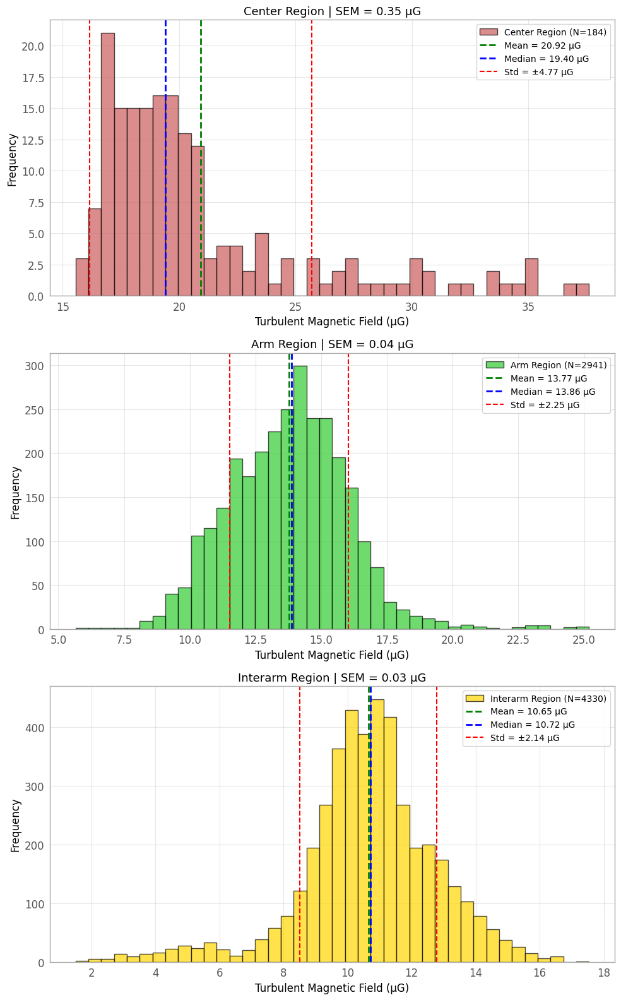


📊 Turbulent Magnetic Field Statistics by Region
--------------------------------------------------

📍 Center Region:
Mean: 20.92 ± 0.35 μG
Median: 19.40 μG
Std Dev: 4.77 μG
N pixels: 184

📍 Arm Region:
Mean: 13.77 ± 0.04 μG
Median: 13.86 μG
Std Dev: 2.25 μG
N pixels: 2941

📍 Interarm Region:
Mean: 10.65 ± 0.03 μG
Median: 10.72 μG
Std Dev: 2.14 μG
N pixels: 4330


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# --- Load turbulent magnetic field data ---
field_fits_path = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"
with fits.open(field_fits_path) as hdul:
    B_turb = np.squeeze(hdul[0].data)  # Renamed to B_turb for clarity

# --- Load and prepare regional masks ---
mask_path = "/content/drive/MyDrive/SALSA_NGC6946/regional_mask.fits"
with fits.open(mask_path) as hdul:
    regional_mask = hdul[0].data

# Create region dictionaries (matches your subplot code style)
regions = {
    "Center": np.where(regional_mask == 3, 1, np.nan),
    "Arm": np.where(regional_mask == 2, 1, np.nan),
    "Interarm": np.where(regional_mask == 1, 1, np.nan)
}

colors = {
    "Center": "indianred",
    "Arm": "limegreen",
    "Interarm": "gold"
}

# --- Helper function (unchanged) ---
def fun1(X, Y, mask):
    xx1 = np.ravel(X * mask)
    yy1 = np.ravel(Y * mask)
    finitemask = np.isfinite(xx1) & np.isfinite(yy1)
    xx1 = xx1[finitemask]
    yy1 = yy1[finitemask]
    return xx1, yy1

# --- Create combined plot ---
plt.figure(figsize=(10, 16))  # Vertical layout

for idx, (region_name, region_mask) in enumerate(regions.items(), start=1):
    # Extract turbulent field for this region
    _, y_raw = fun1(B_turb, B_turb, region_mask)

    # Filter valid data (positive and finite)
    y = y_raw[(y_raw > 0) & np.isfinite(y_raw)]

    # Compute statistics
    mean_val = np.mean(y)
    median_val = np.median(y)
    std_val = np.std(y)
    N = len(y)
    sem_val = std_val / np.sqrt(N)

    # Plot histogram
    plt.subplot(3, 1, idx)
    plt.hist(y, bins=40, color=colors[region_name],
             edgecolor='black', alpha=0.7,
             label=f"{region_name} Region (N={N})")

    # Add statistical lines
    plt.axvline(mean_val, color='green', linestyle='--',
                linewidth=2, label=f'Mean = {mean_val:.2f} μG')
    plt.axvline(median_val, color='blue', linestyle='--',
                linewidth=2, label=f'Median = {median_val:.2f} μG')
    plt.axvline(mean_val + std_val, color='red',
                linestyle='--', linewidth=1.5,
                label=f'Std = ±{std_val:.2f} μG')
    plt.axvline(mean_val - std_val, color='red',
                linestyle='--', linewidth=1.5)

    # Formatting
    plt.xlabel('Turbulent Magnetic Field (μG)', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.title(f"{region_name} Region | SEM = {sem_val:.2f} μG", fontsize=13)
    plt.legend(fontsize=10, loc='upper right')
    plt.grid(True, alpha=0.3)

# Final layout adjustments
plt.tight_layout()
plt.suptitle('',
             fontsize=16, y=1.03)
plt.show()

# --- Print statistics table ---
print("\n📊 Turbulent Magnetic Field Statistics by Region")
print("-" * 50)
for region_name in regions:
    _, y_raw = fun1(B_turb, B_turb, regions[region_name])
    y = y_raw[(y_raw > 0) & np.isfinite(y_raw)]

    print(f"\n📍 {region_name} Region:")
    print(f"Mean: {np.mean(y):.2f} ± {np.std(y)/np.sqrt(len(y)):.2f} μG")
    print(f"Median: {np.median(y):.2f} μG")
    print(f"Std Dev: {np.std(y):.2f} μG")
    print(f"N pixels: {len(y)}")

#Ordered magnetic field

NaN in total B: 96
NaN in turbulent B: 14524


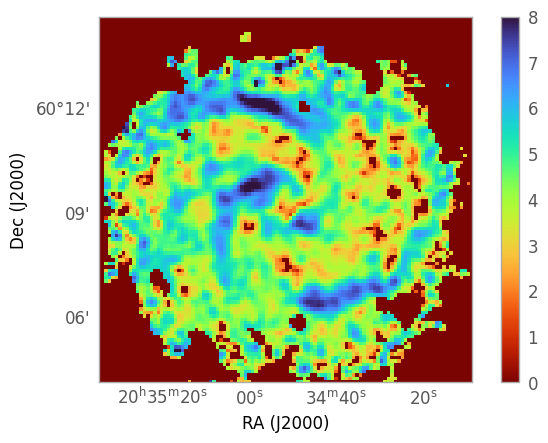

Successfully saved ordered magnetic field map to /content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits


In [54]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# Load the magnetic field maps
B_eq_fits = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"
B_turb_fits = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"

# Load data and handle potential extra dimensions
B_eq_data = fits.getdata(B_eq_fits).squeeze()  # Remove length-1 dimensions
B_turb_data = fits.getdata(B_turb_fits).squeeze()

# Check for NaN values before calculation
print(f"NaN in total B: {np.isnan(B_eq_data).sum()}")
print(f"NaN in turbulent B: {np.isnan(B_turb_data).sum()}")

# Replace NaN values with 0 (or you could use np.nan_to_num)
B_eq_data = np.where(np.isnan(B_eq_data), 0, B_eq_data)
B_turb_data = np.where(np.isnan(B_turb_data), 0, B_turb_data)

# Compute ordered field with safety checks
with np.errstate(invalid='ignore'):  # Temporarily ignore invalid operation warnings
    B_ord_squared = (B_eq_data**2 - B_turb_data**2)

# Ensure we don't take sqrt of negative values
B_ord_squared[B_ord_squared < 0] = 0
B_ord = np.sqrt(B_ord_squared)

# Get header for WCS
with fits.open(B_eq_fits) as hdu:
    header = hdu[0].header

# Set up WCS if available
try:
    wcs = WCS(header).celestial if WCS(header).has_celestial else None
except:
    wcs = None
    print("Warning: Could not create proper WCS from header")

# Plotting
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(projection=wcs) if wcs else plt.subplot()

img = ax.imshow(B_ord, origin='lower', cmap='turbo_r', vmin=0, vmax=8)
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'', fontsize=12)
ax.set_title("", fontsize=14)

if wcs:
    ax.set_xlabel("RA (J2000)", fontsize=12)
    ax.set_ylabel("Dec (J2000)", fontsize=12)
else:
    ax.set_xlabel("Pixel coordinates", fontsize=12)
    ax.set_ylabel("Pixel coordinates", fontsize=12)

# Only set limits if they make sense for your data
ax.set_xlim([18, 167 - 42])
ax.set_ylim([35, 141 - 1])

ax.grid(False)
plt.tight_layout()
plt.show()

# Save the result
output_fits_file = "/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits"
fits.writeto(output_fits_file, B_ord, header=header, overwrite=True)
print(f"Successfully saved ordered magnetic field map to {output_fits_file}")

#Histogram of $B_{ord}$

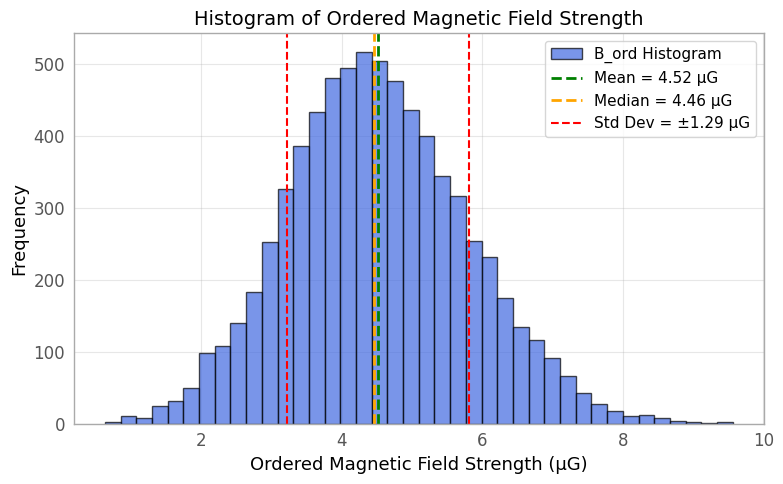

In [55]:
# Flatten the array and filter out zero or non-finite values
B_ord_flat = B_ord.flatten()
B_ord_valid = B_ord_flat[(B_ord_flat > 0) & np.isfinite(B_ord_flat)]

# Compute statistics
mean_val = np.mean(B_ord_valid)
median_val = np.median(B_ord_valid)
std_val = np.std(B_ord_valid)

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(B_ord_valid, bins=40, color='royalblue', edgecolor='black', alpha=0.7, label='B_ord Histogram')

# Plot vertical lines for mean, median, and std deviation
plt.axvline(mean_val, color='green', linestyle='--', linewidth=2, label=f'Mean = {mean_val:.2f} μG')
plt.axvline(median_val, color='orange', linestyle='--', linewidth=2, label=f'Median = {median_val:.2f} μG')
plt.axvline(mean_val + std_val, color='red', linestyle='--', linewidth=1.5, label=f'Std Dev = ±{std_val:.2f} μG')
plt.axvline(mean_val - std_val, color='red', linestyle='--', linewidth=1.5)

# Labels and formatting
plt.xlabel('Ordered Magnetic Field Strength (μG)', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title('Histogram of Ordered Magnetic Field Strength', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()



#Histogram of $B_{ord}$ without mask_tot

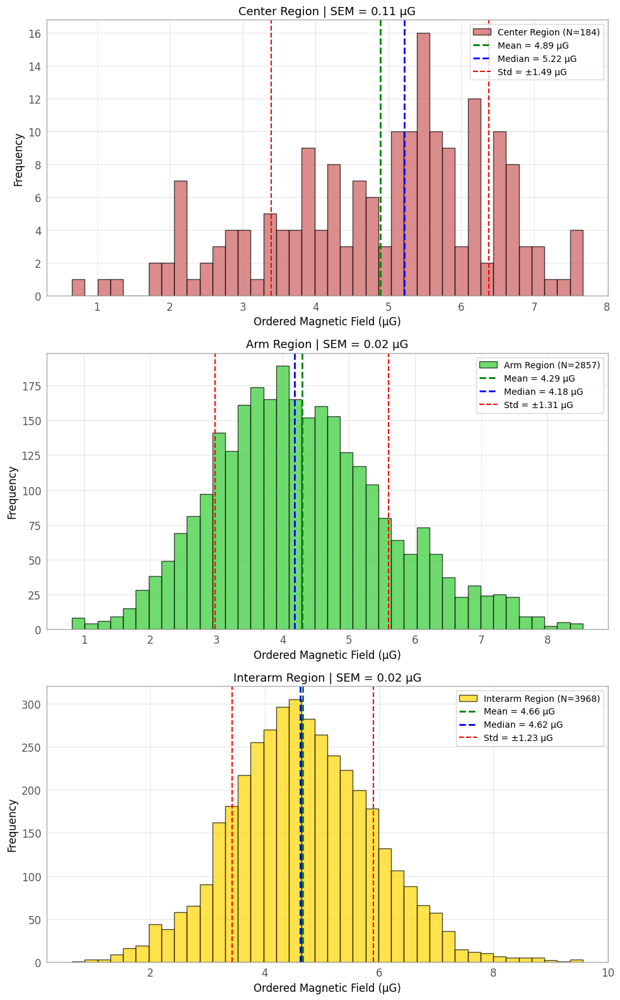


📊 Ordered Magnetic Field Statistics by Region
--------------------------------------------------

📍 Center Region:
Mean: 4.89 ± 0.11 μG
Median: 5.22 μG
Std Dev: 1.49 μG
N pixels: 184

📍 Arm Region:
Mean: 4.29 ± 0.02 μG
Median: 4.18 μG
Std Dev: 1.31 μG
N pixels: 2857

📍 Interarm Region:
Mean: 4.66 ± 0.02 μG
Median: 4.62 μG
Std Dev: 1.23 μG
N pixels: 3968


In [56]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt

# --- Load ordered magnetic field data ---
field_fits_path = "/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits"
with fits.open(field_fits_path) as hdul:
    B_ord = np.squeeze(hdul[0].data)

# --- Load and prepare regional masks ---
mask_path = "/content/drive/MyDrive/SALSA_NGC6946/regional_mask.fits"
with fits.open(mask_path) as hdul:
    regional_mask = hdul[0].data

# Define region masks
regions = {
    "Center": np.where(regional_mask == 3, 1, np.nan),
    "Arm": np.where(regional_mask == 2, 1, np.nan),
    "Interarm": np.where(regional_mask == 1, 1, np.nan)
}

colors = {
    "Center": "indianred",
    "Arm": "limegreen",
    "Interarm": "gold"
}

# --- Helper function ---
def fun1(X, Y, mask):
    xx1 = np.ravel(X * mask)
    yy1 = np.ravel(Y * mask)
    finitemask = np.isfinite(xx1) & np.isfinite(yy1)
    xx1 = xx1[finitemask]
    yy1 = yy1[finitemask]
    return xx1, yy1

# --- Plot histograms ---
plt.figure(figsize=(10, 16))

for idx, (region_name, region_mask) in enumerate(regions.items(), start=1):
    # Extract ordered field data for this region
    _, y_raw = fun1(B_ord, B_ord, region_mask)
    y = y_raw[(y_raw > 0) & np.isfinite(y_raw)]

    # Calculate statistics
    mean_val = np.mean(y)
    median_val = np.median(y)
    std_val = np.std(y)
    N = len(y)
    sem_val = std_val / np.sqrt(N)

    # Plot
    plt.subplot(3, 1, idx)
    plt.hist(y, bins=40, color=colors[region_name],
             edgecolor='black', alpha=0.7,
             label=f"{region_name} Region (N={N})")

    # Annotate mean, median, std
    plt.axvline(mean_val, color='green', linestyle='--',
                linewidth=2, label=f'Mean = {mean_val:.2f} μG')
    plt.axvline(median_val, color='blue', linestyle='--',
                linewidth=2, label=f'Median = {median_val:.2f} μG')
    plt.axvline(mean_val + std_val, color='red', linestyle='--',
                linewidth=1.5, label=f'Std = ±{std_val:.2f} μG')
    plt.axvline(mean_val - std_val, color='red', linestyle='--',
                linewidth=1.5)

    # Labels
    plt.xlabel('Ordered Magnetic Field (μG)', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.title(f"{region_name} Region | SEM = {sem_val:.2f} μG", fontsize=13)
    plt.legend(fontsize=10, loc='upper right')
    plt.grid(True, alpha=0.3)

# Final formatting
plt.tight_layout()
plt.suptitle('', fontsize=16, y=1.03)
plt.show()

# --- Print statistics table ---
print("\n📊 Ordered Magnetic Field Statistics by Region")
print("-" * 50)
for region_name in regions:
    _, y_raw = fun1(B_ord, B_ord, regions[region_name])
    y = y_raw[(y_raw > 0) & np.isfinite(y_raw)]

    print(f"\n📍 {region_name} Region:")
    print(f"Mean: {np.mean(y):.2f} ± {np.std(y)/np.sqrt(len(y)):.2f} μG")
    print(f"Median: {np.median(y):.2f} μG")
    print(f"Std Dev: {np.std(y):.2f} μG")
    print(f"N pixels: {len(y)}")


#Ordered field driven by PI directly

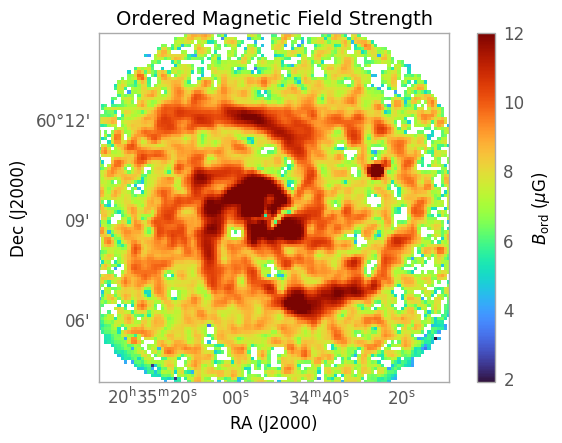

Ordered magnetic field strength map saved as /content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_PI_field.fits


In [57]:
import numpy as np
from scipy.special import gamma
from astropy.io import fits
import matplotlib.pyplot as plt
from astropy.wcs import WCS

# Constants
E_p = 1.5033e-3  # Proton rest energy in erg
c1 = 6.26428e18  # erg^-2 s^-1 G^-1
c3 = 1.86558e-23  # erg G^-1 sterad^-1

# Function to calculate c2(alpha)
def calculate_c2(alpha):
    term1 = (alpha + 5/3) / (alpha + 1)
    term2 = gamma((3 * alpha + 1) / 6)
    term3 = gamma((3 * alpha + 5) / 6)
    c2 = 0.25 * c3 * term1 * term2 * term3
    return c2

# Function to calculate c4(i) for isotropic turbulent field
def calculate_c4(alpha):
    return (np.cos(38 * np.pi / 180)) ** (alpha + 1)

# Function to compute the equipartition magnetic field strength (ordered field)
def compute_B_ord(alpha, K0, I_nu, nu, l):
    c2 = calculate_c2(alpha)
    c4 = calculate_c4(alpha)
    nu_term = (nu / (2 * c1)) ** alpha
    numerator = 4 * np.pi * (2 * alpha + 1) * (K0 + 1) * I_nu * (E_p ** (1 - 2 * alpha)) * nu_term
    denominator = (2 * alpha - 1) * c2 * l * c4
    B_ord = (numerator / denominator) ** (1 / (alpha + 3)) * 1e6  # microGauss
    return B_ord

# Load FITS files
I_synch_file = "/content/drive/MyDrive/SALSA_NGC6946/6cm-syn.fits"
PI_file = "/content/drive/MyDrive/SALSA_NGC6946/NGC6946_6cm_POLC.fits"

with fits.open(I_synch_file) as hdu_synch, fits.open(PI_file) as hdu_pi:
    I_synch = hdu_synch[0].data
    PI = hdu_pi[0].data
    header = hdu_synch[0].header

# Compute ordered synchrotron intensity directly from PI
I_n = PI / 0.75

# Beam parameters and unit conversion
theta_min = 18  # arcsec
theta_maj = 18  # arcsec
beam = 1.13 * (theta_maj * theta_min) * (1 / 206265) ** 2  # sr
I_nu = I_n * 1e-23 / beam  # microJy/beam to erg/cm^2/s/Hz/sr

# Parameters
alpha = 1
K0 = 100
nu = 5e9  # Hz
l_kpc = 1 / np.cos(38 * np.pi / 180)
l_cm = l_kpc * 3.086e21

# Compute magnetic field (ordered)
B_ord = compute_B_ord(alpha, K0, I_nu, nu, l_cm)

# WCS setup
wcs = WCS(header, naxis=2)
if wcs.has_celestial:
    wcs = wcs.celestial
else:
    print("No celestial WCS found.")

# Plot
plt.figure(figsize=(7, 5.5))
ax = plt.subplot(projection=wcs)
img = ax.imshow(B_ord.squeeze(), origin='lower', vmax=12, cmap='turbo')
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'$B_{\mathrm{ord}}$ ($\mu$G)', fontsize=12)
ax.set_title("Ordered Magnetic Field Strength", fontsize=14)
ax.set_xlabel("RA (J2000)", fontsize=12)
ax.set_ylabel("Dec (J2000)", fontsize=12)
ax.set_xlim([20, 167 - 42])
ax.set_ylim([35, 141 - 1])
ax.grid(False)
plt.tight_layout()
plt.show()

# Save the computed ordered magnetic field as FITS
output_fits_file = "/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_PI_field.fits"
hdu = fits.PrimaryHDU(B_ord.squeeze(), header=header)
hdu.writeto(output_fits_file, overwrite=True)

print(f"Ordered magnetic field strength map saved as {output_fits_file}")


NaN in total B: 96
NaN in turbulent B: 14524


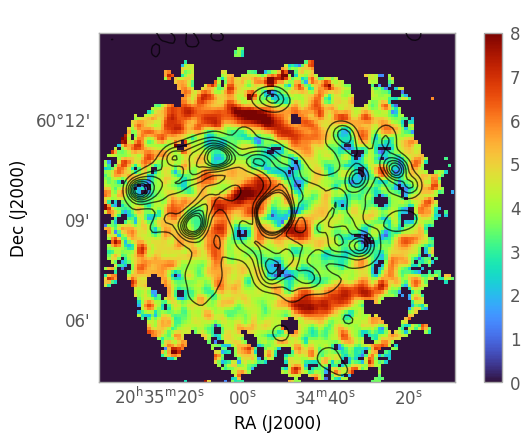

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.colors import Normalize  # Import Normalize

# Load the magnetic field maps
B_eq_fits = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"
B_turb_fits = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"

# Load data and handle potential extra dimensions
B_eq_data = fits.getdata(B_eq_fits).squeeze()  # Remove length-1 dimensions
B_turb_data = fits.getdata(B_turb_fits).squeeze()

# Check for NaN values before calculation
print(f"NaN in total B: {np.isnan(B_eq_data).sum()}")
print(f"NaN in turbulent B: {np.isnan(B_turb_data).sum()}")

# Replace NaN values with 0 (or you could use np.nan_to_num)
B_eq_data = np.where(np.isnan(B_eq_data), 0, B_eq_data)
B_turb_data = np.where(np.isnan(B_turb_data), 0, B_turb_data)

# Compute ordered field with safety checks
with np.errstate(invalid='ignore'):  # Temporarily ignore invalid operation warnings
    B_ord_squared = (B_eq_data**2 - B_turb_data**2)

# Ensure we don't take sqrt of negative values
B_ord_squared[B_ord_squared < 0] = 0
B_ord = np.sqrt(B_ord_squared)

# Get header for WCS
with fits.open(B_eq_fits) as hdu:
    header = hdu[0].header

# Set up WCS if available
try:
    wcs = WCS(header).celestial if WCS(header).has_celestial else None
except:
    wcs = None
    print("Warning: Could not create proper WCS from header")

# Load the SFR map (NGC6946_SFR_18arcsec.fits)
SFR_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_SFR_18arcsec.fits'
with fits.open(SFR_path) as hdu:
    SFR = hdu[0].data
    header_sfr = hdu[0].header

# Set up WCS for SFR
wcs_sfr = WCS(header_sfr, naxis=2)

# Parameters for intensity conversion (using the same as in previous code)
vmin = 0
vmax = 0.9

# Plotting ordered magnetic field with SFR contours
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs) if wcs else fig.add_subplot(111)

# Show ordered magnetic field map
img = ax.imshow(B_ord, origin='lower', cmap='turbo', vmin=0, vmax=8)
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label(r'', fontsize=12)
ax.set_title(" ", fontsize=14)

# Labels based on WCS
if wcs:
    ax.set_xlabel("RA (J2000)", fontsize=12)
    ax.set_ylabel("Dec (J2000)", fontsize=12)
else:
    ax.set_xlabel("Pixel coordinates", fontsize=12)
    ax.set_ylabel("Pixel coordinates", fontsize=12)

# Overlay SFR contours on top of the magnetic field
levels_sfr = np.linspace(vmin, vmax, 8)  # 10 contour levels from vmin to vmax
ax.contour(SFR.squeeze(), levels=levels_sfr, colors='k', linewidths=1.0, alpha=0.7)

# Set plot limits (adjust these based on your data)
ax.set_xlim([18, 167 - 42])
ax.set_ylim([35, 141 - 1])
ax.grid(False)

# Final adjustments
plt.tight_layout()
plt.show()


In [59]:
np.linspace(0, 0.9, 10)


array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [60]:
b_ord_hdu = fits.open('/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits')
B_ord = b_ord_hdu[0].data
header = b_ord_hdu[0].header

In [61]:
!pip install reproject

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.4/205.4 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 34.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.7/53.7 kB 3.9 MB/s eta 0:00:00


NaN in total B: 96
NaN in turbulent B: 14524


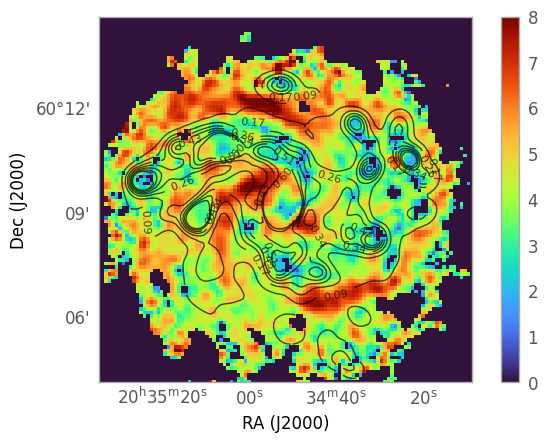

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.colors import Normalize
from astropy.nddata import Cutout2D
from astropy import units as u
from reproject import reproject_interp  # Add explicit import


B_eq_fits = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"
B_turb_fits = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"


B_eq_data = fits.getdata(B_eq_fits).squeeze()  # Remove length-1 dimensions
B_turb_data = fits.getdata(B_turb_fits).squeeze()


with fits.open(B_eq_fits) as hdu:
    header_B = hdu[0].header


print(f"NaN in total B: {np.isnan(B_eq_data).sum()}")
print(f"NaN in turbulent B: {np.isnan(B_turb_data).sum()}")


B_eq_data = np.where(np.isnan(B_eq_data), 0, B_eq_data)
B_turb_data = np.where(np.isnan(B_turb_data), 0, B_turb_data)


with np.errstate(invalid='ignore'):  # Temporarily ignore invalid operation warnings
    B_ord_squared = (B_eq_data**2 - B_turb_data**2)


B_ord_squared[B_ord_squared < 0] = 0
B_ord = np.sqrt(B_ord_squared)


significant_data = B_ord > 0.1  # Adjust threshold as needed

# Load the SFR map
SFR_path = '/content/drive/MyDrive/SALSA_NGC6946/NGC6946_SFR_18arcsec.fits'
with fits.open(SFR_path) as hdu:
    SFR_data = hdu[0].data.squeeze()
    header_sfr = hdu[0].header

# Create WCS objects
wcs_B = WCS(header_B).celestial if WCS(header_B).has_celestial else None
wcs_sfr = WCS(header_sfr).celestial if WCS(header_sfr).has_celestial else None

# If WCS is available, we need to align the images
if wcs_B and wcs_sfr:
    # Reproject SFR data to match B field map
    SFR_aligned, footprint = reproject_interp((SFR_data, wcs_sfr), wcs_B, shape_out=B_ord.shape)
else:
    # If no WCS, just use the data as-is (but contours may not align properly)
    SFR_aligned = SFR_data
    print("Warning: No WCS information - contour alignment may be incorrect")

# Mask the SFR data outside the significant data region
# This is the key fix to prevent contours outside the valid region
SFR_masked = np.copy(SFR_aligned)
SFR_masked[~significant_data] = np.nan  # Set to NaN outside significant region

# Plotting
fig = plt.figure(figsize=(7, 5.5))
ax = fig.add_subplot(111, projection=wcs_B) if wcs_B else fig.add_subplot(111)

# Show ordered magnetic field map
img = ax.imshow(B_ord, origin='lower', cmap='turbo', vmin=0, vmax=8)
cbar = plt.colorbar(img, ax=ax, pad=0.05)
cbar.set_label('', fontsize=12)

# Overlay SFR contours ONLY in the significant data region
levels_sfr = np.linspace(0, 0.6, 8)  # 8 contour levels from 0 to 0.6
contours = ax.contour(SFR_masked, levels=levels_sfr, colors='k', linewidths=1.0, alpha=0.7)

# Add contour labels if desired
ax.clabel(contours, inline=True, fontsize=8, fmt='%.2f')


if wcs_B:
    ax.set_xlabel("RA (J2000)", fontsize=12)
    ax.set_ylabel("Dec (J2000)", fontsize=12)
    ax.coords.grid(color='white', linestyle='solid', alpha=0.5)
else:
    ax.set_xlabel("Pixel coordinates", fontsize=12)
    ax.set_ylabel("Pixel coordinates", fontsize=12)


ax.set_xlim(18, 167 - 42)
ax.set_ylim(35, 141 - 1)
ax.grid(False)


plt.tight_layout()
plt.show()


#Ordered magnetic field radial profile

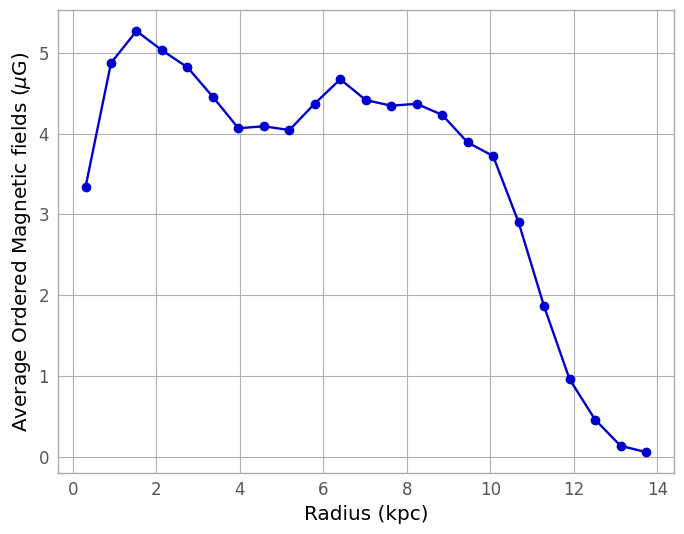

In [63]:
import matplotlib.pyplot as plt
import numpy as np

# Ring data: [Inner arcsec, Outer arcsec, Average Flux (Jy/beam)]
data = [
    (0.0, 18.0, 3.3382),
    (18.0, 36.0, 4.8738),
    (36.0, 54.0, 5.2679),
    (54.0, 72.0, 5.0299),
    (72.0, 90.0, 4.8195),
    (90.0, 108.0, 4.4529),
    (108.0, 126.0, 4.0653),
    (126.0, 144.0, 4.0899),
    (144.0, 162.0, 4.0429),
    (162.0, 180.0, 4.3712),
    (180.0, 198.0, 4.6717),
    (198.0, 216.0, 4.4143),
    (216.0, 234.0, 4.3449),
    (234.0, 252.0, 4.3675),
    (252.0, 270.0, 4.2311),
    (270.0, 288.0, 3.8898),
    (288.0, 306.0, 3.7218),
    (306.0, 324.0, 2.9003),
    (324.0, 342.0, 1.8627),
    (342.0, 360.0, 0.9609),
    (360.0, 378.0, 0.4620),
    (378.0, 396.0, 0.1368),
    (396.0, 414.0, 0.0596),
]

# Conversion factor from arcsec to kpc at 7.0 Mpc
arcsec_to_kpc = 0.0339

# Calculate mid-points and convert to kpc
radii_arcsec = [(inner + outer) / 2 for inner, outer, _ in data]
radii_kpc = [r * arcsec_to_kpc for r in radii_arcsec]
avg_flux = [flux for _, _, flux in data]

# Plotting
plt.figure(figsize=(7, 5.5))
plt.plot(radii_kpc, avg_flux, marker='o', linestyle='-', color='mediumblue')
plt.xlabel("Radius (kpc)")
plt.ylabel("Average Ordered Magnetic fields ($\mu$G)")
plt.title("")
plt.grid(True)
plt.tight_layout()
plt.show()


#Ordered to Turbulent magnetic field ($q=\frac{B_{ord}}{B_{turb}}$)

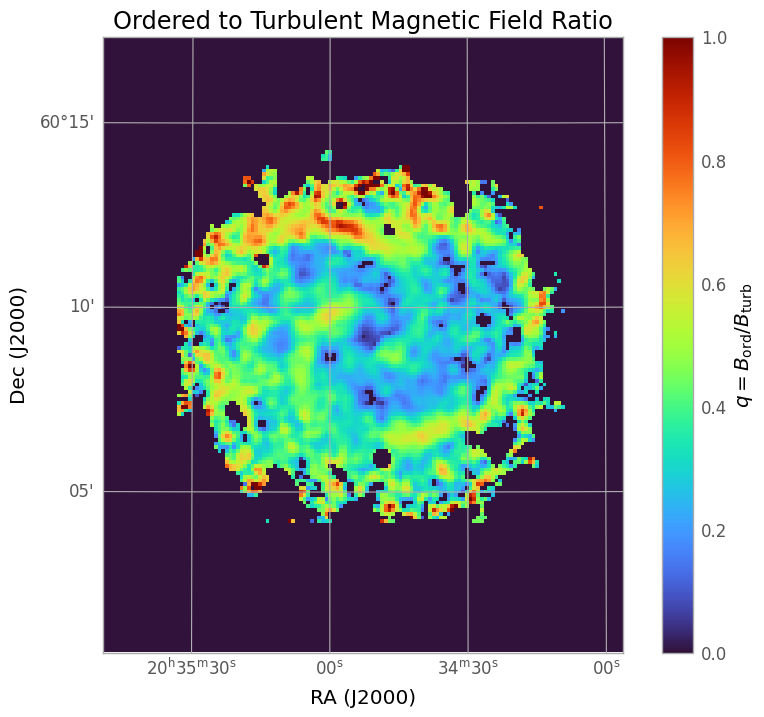

Field regularity map saved as /content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits


In [64]:

B_ord_fits = "/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits"
B_ord_data = fits.getdata(B_ord_fits)


B_turb_fits = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"
B_turb_data = fits.getdata(B_turb_fits)

B_ratio = np.divide(B_ord_data, B_turb_data, out=np.zeros_like(B_ord_data), where=B_turb_data != 0)


B_ratio[np.isnan(B_ratio)] = 0


with fits.open(B_turb_fits) as hdu:
    header = hdu[0].header


wcs = WCS(header, naxis=2) if "CTYPE1" in header and "CTYPE2" in header else None


plt.figure(figsize=(10, 8))
if wcs:
    plt.subplot(projection=wcs)

plt.imshow(B_ratio, origin='lower', cmap='turbo', vmax=1)
plt.colorbar(label=r'$q = B_{\mathrm{ord}} / B_{\mathrm{turb}}$')
plt.title("Ordered to Turbulent Magnetic Field Ratio")
plt.xlabel("RA (J2000)")
plt.ylabel("Dec (J2000)")
plt.show()


output_q_fits = "/content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits"
hdu_q = fits.PrimaryHDU(B_ratio, header=header)
hdu_q.writeto(output_q_fits, overwrite=True)

print(f"Field regularity map saved as {output_q_fits}")



#Turbulent to total magnetic field $(\frac{B_{turb}}{B_{tot}})$

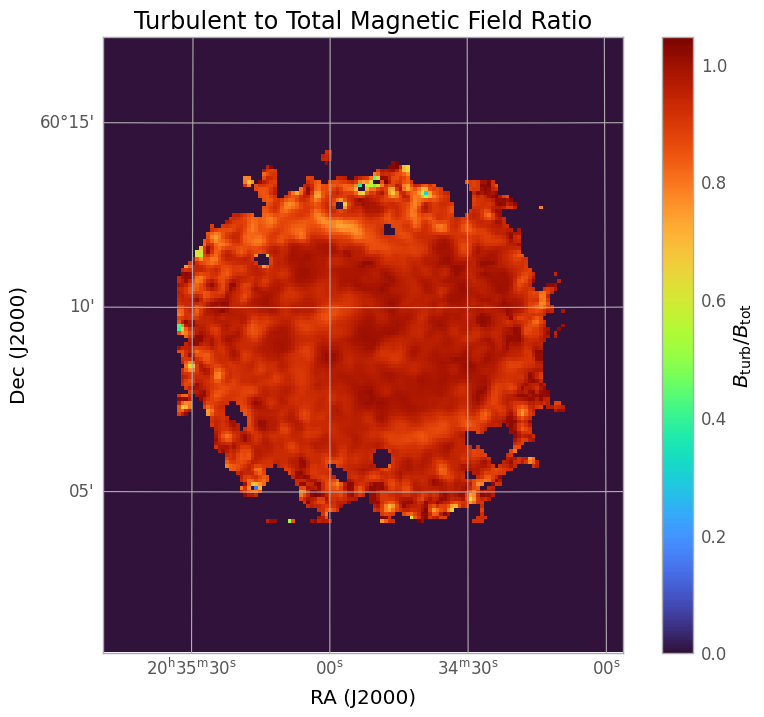

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS


B_turb_fits = "/content/drive/MyDrive/SALSA_NGC6946/turbulent_magnetic_field.fits"
B_turb_data = fits.getdata(B_turb_fits)

B_tot_fits = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"
B_tot_data = fits.getdata(B_tot_fits)


B_ratio = np.divide(B_turb_data, B_tot_data, out=np.zeros_like(B_turb_data), where=B_tot_data != 0)


B_ratio[np.isnan(B_ratio)] = 0

with fits.open(B_tot_fits) as hdu:
    header = hdu[0].header

wcs = WCS(header, naxis=2) if "CTYPE1" in header else None


plt.figure(figsize=(10, 8))
if wcs:
    plt.subplot(projection=wcs)

plt.imshow(B_ratio, origin='lower', cmap='turbo', vmin=0)
plt.colorbar(label=r'$B_{\mathrm{turb}} / B_{\mathrm{tot}}$')
plt.title("Turbulent to Total Magnetic Field Ratio")
plt.xlabel("RA (J2000)")
plt.ylabel("Dec (J2000)")
plt.show()


#Ordered to total magnetic field $(\frac{B_{ord}}{B_{tot}})$

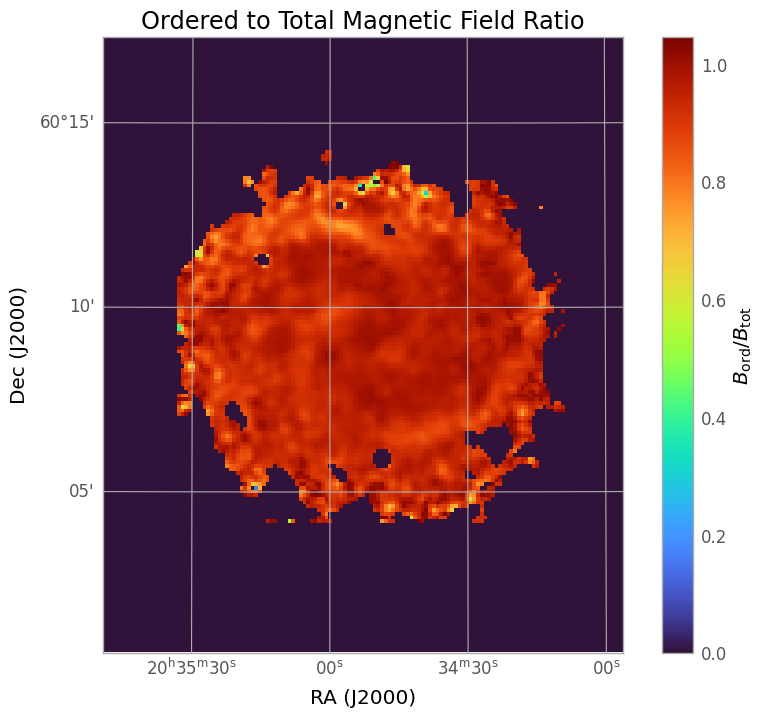

In [66]:

B_ord_fits = "/content/drive/MyDrive/SALSA_NGC6946/ordered_magnetic_field.fits"
B_ord_data = fits.getdata(B_turb_fits)

B_tot_fits = "/content/drive/MyDrive/SALSA_NGC6946/total_magnetic_field.fits"
B_tot_data = fits.getdata(B_tot_fits)


B_ratio = np.divide(B_ord_data, B_tot_data, out=np.zeros_like(B_ord_data), where=B_tot_data != 0)


B_ratio[np.isnan(B_ratio)] = 0

with fits.open(B_tot_fits) as hdu:
    header = hdu[0].header

wcs = WCS(header, naxis=2) if "CTYPE1" in header else None


plt.figure(figsize=(10, 8))
if wcs:
    plt.subplot(projection=wcs)

plt.imshow(B_ratio, origin='lower', cmap='turbo', vmin=0)
plt.colorbar(label=r'$B_{\mathrm{ord}} / B_{\mathrm{tot}}$')
plt.title("Ordered to Total Magnetic Field Ratio")
plt.xlabel("RA (J2000)")
plt.ylabel("Dec (J2000)")
plt.show()


#Correlation of B vs SFR

center | SFR min: 0.24782933294773102, max: 9.513154029846191 | B min: 16.875608522970015, max: 37.6620649379598
arm | SFR min: 0.06551705300807953, max: 1.3288921117782593 | B min: 4.9358666228750705, max: 25.40154015052113
interarm | SFR min: 0.07645493745803833, max: 0.5198036432266235 | B min: 5.35626534936471, max: 17.44672395506623


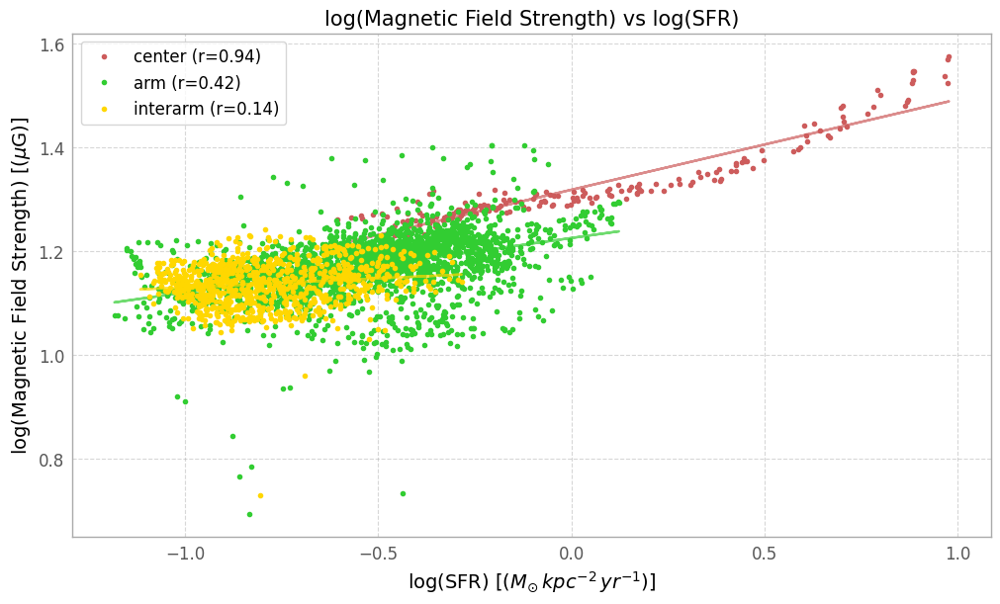

In [67]:


fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Change to linear axes since we're plotting log values directly
ax.set_xlabel('log(SFR) [($M_{\odot}\,kpc^{-2}\,yr^{-1}$)]', fontsize=14)
ax.set_ylabel('log(Magnetic Field Strength) [($\mu$G)]', fontsize=14)
ax.grid(True, which="both", linestyle="--", alpha=0.5)

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

for region, color in regions:
    x_raw, y_raw = fun1(SFR, B_field, eval(f"{region} * masktot"))

    # Mask out invalid values for log plotting
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    print(f"{region} | SFR min: {x.min()}, max: {x.max()} | B min: {y.min()}, max: {y.max()}")

    log_x = np.log10(x)
    log_y = np.log10(y)

    slope, intercept, r, _, _ = linregress(log_x, log_y)
    fit_log_y = slope * log_x + intercept  # Linear fit in log space

    ax.plot(log_x, log_y, ".", color=color, label=f"{region} (r={r:.2f})")
    ax.plot(log_x, fit_log_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12)
plt.title("log(Magnetic Field Strength) vs log(SFR)", fontsize=15)
plt.show()

#B vs CO

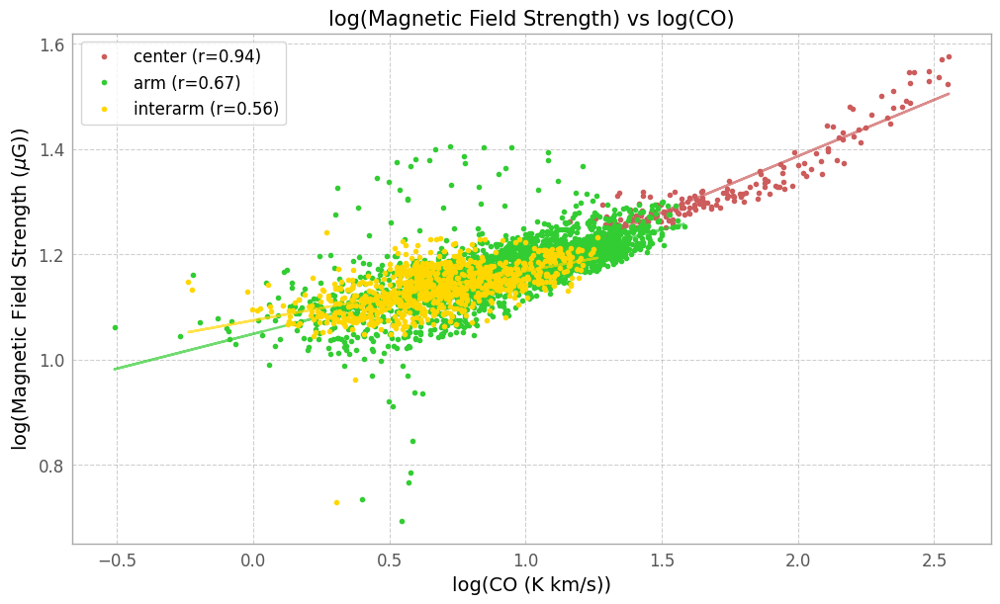

In [68]:


datasets = [
    (CO, B_field, 'CO (K km/s)', 'Magnetic Field Strength ($\mu$G)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

x_data, y_data, xlabel, ylabel = datasets[0]

# Update axis labels to reflect log scale
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask invalid or non-positive values (log requires > 0)
    mask = (x > 0) & (y > 0)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression in log space
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y_log = slope * x_log + intercept  # Fit in log space

    # Plot log(B) vs log(CO) as points
    ax.plot(x_log, y_log, '.', color=color, label=f"{region} (r={r_value:.2f})")

    # Plot the linear fit (already in log space)
    ax.plot(x_log, fit_y_log, '-', color=color, alpha=0.7)

ax.legend(fontsize=12)
plt.title('log(Magnetic Field Strength) vs log(CO)', fontsize=15)
plt.show()

#B vs HI

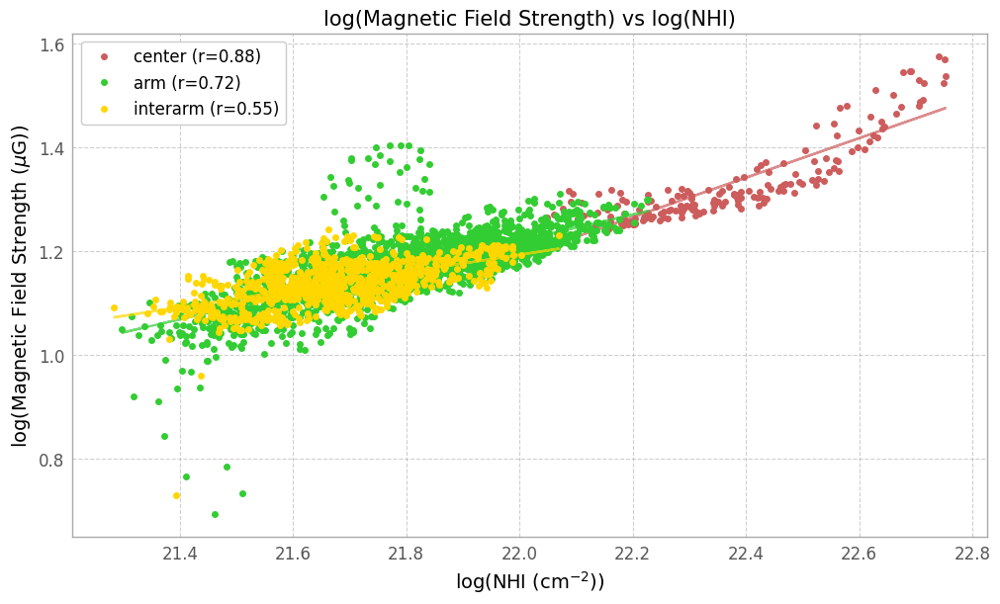

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Data setup
datasets = [
    (NHI, B_field, 'NHI (cm$^{-2}$)', 'Magnetic Field Strength ($\mu$G)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
x_data, y_data, xlabel, ylabel = datasets[0]

# Axis labels for log-log plot
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    # Get raw data
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Apply masks for positive finite values
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y = slope * x_log + intercept

    # Plot data points
    ax.plot(x_log, y_log, ".", color=color, markersize=8, label=f"{region} (r={r_value:.2f})")

    # Plot fit line
    ax.plot(x_log, fit_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12, framealpha=1)
plt.title('log(Magnetic Field Strength) vs log(NHI)', fontsize=15)
plt.show()


#$B_{turb}$ vs SFR

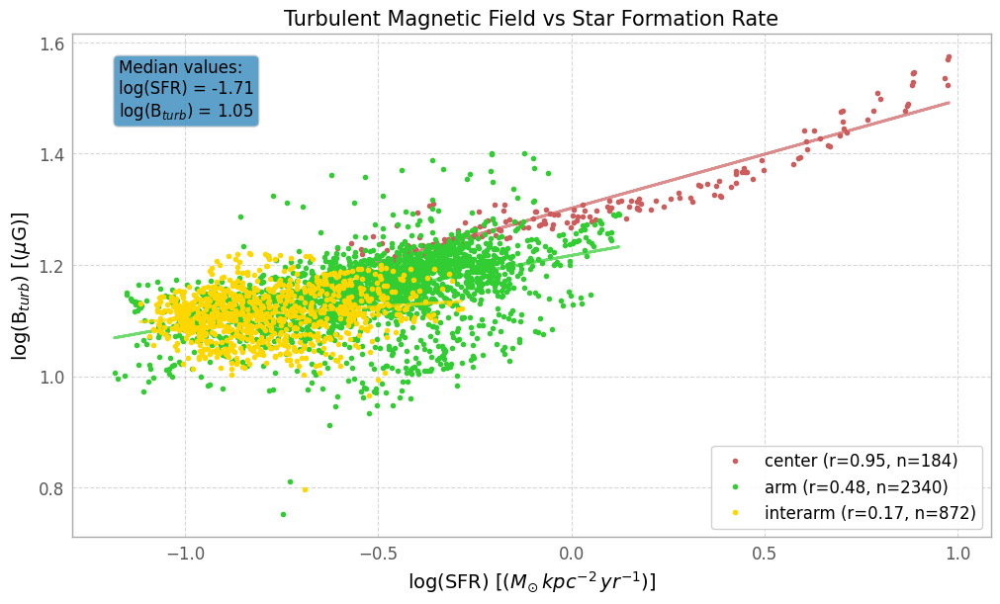


Regression Results:
Region     N     Slope    Intercept  r-value  p-value   
------------------------------------------------------------
center     184   0.194 1.302 0.947 8.254e-92
arm        2340  0.125 1.217 0.478 1.061e-133
interarm   872   0.044 1.147 0.168 6.266e-07


In [70]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Load your turbulent magnetic field data (assuming B_turb is already loaded)
# B_turb = ... [your loading code here]

fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('log(SFR) [($M_{\odot}\,kpc^{-2}\,yr^{-1}$)]', fontsize=14)
ax.set_ylabel('log(B$_{turb}$) [($\mu$G)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Store results for summary table
results = []

for region, color in regions:
    # Extract SFR and B_turb for this region
    x_raw, y_raw = fun1(SFR, B_turb, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    # Log-transform
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(log_x, log_y)
    fit_log_y = slope * log_x + intercept

    # Plot data and fit
    ax.plot(log_x, log_y, ".", color=color,
            label=f"{region} (r={r_value:.2f}, n={len(x)})")
    ax.plot(log_x, fit_log_y, "-", color=color, alpha=0.7, linewidth=2)

    # Store results
    results.append({
        'region': region,
        'n_points': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value
    })

ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Turbulent Magnetic Field vs Star Formation Rate", fontsize=15)

# Add annotation with median values
med_sfr = np.median(np.log10(SFR[SFR > 0]))
med_bturb = np.median(np.log10(B_turb[B_turb > 0]))
ax.annotate(f'Median values:\nlog(SFR) = {med_sfr:.2f}\nlog(B$_{{turb}}$) = {med_bturb:.2f}',
            xy=(0.05, 0.95), xycoords='axes fraction',
            ha='left', va='top', bbox=dict(boxstyle='round', alpha=0.8))

plt.show()

# Print summary table
print("\nRegression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope':<8} {'Intercept':<10} {'r-value':<8} {'p-value':<10}")
print("-"*60)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope']:.3f} {res['intercept']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")

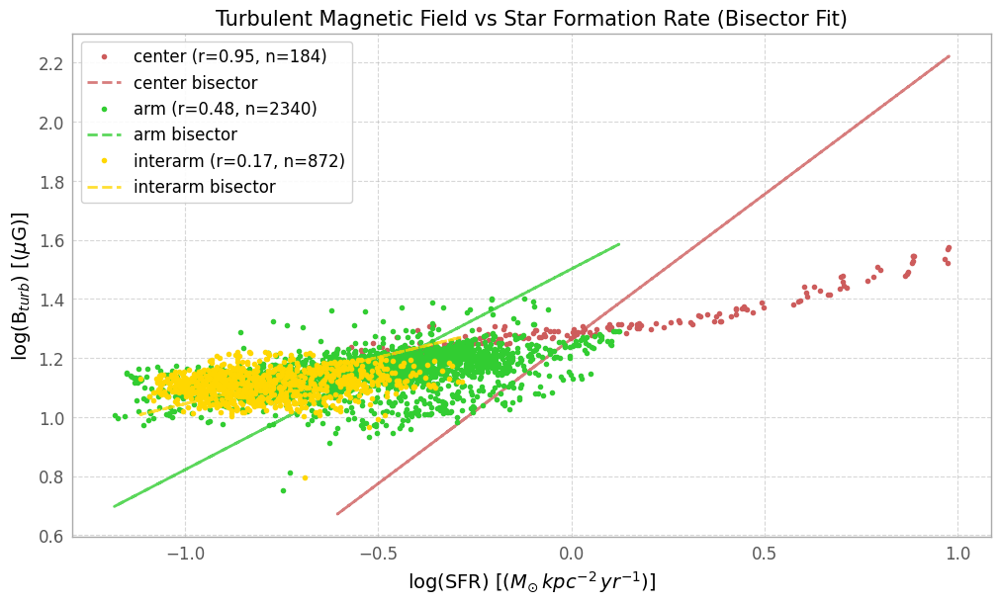


Bisector Regression Results:
Region     N     Slope_bis  Intercept_bis   r-value  p-value   
-----------------------------------------------------------------
center     184   0.979 1.265 0.947 8.254e-92
arm        2340  0.679 1.502 0.478 1.061e-133
interarm   872   0.315 1.360 0.168 6.266e-07


In [71]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('log(SFR) [($M_{\odot}\,kpc^{-2}\,yr^{-1}$)]', fontsize=14)
ax.set_ylabel('log(B$_{turb}$) [($\mu$G)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

results = []

for region, color in regions:
    x_raw, y_raw = fun1(SFR, B_turb, eval(f"{region} * masktot"))

    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    log_x = np.log10(x)
    log_y = np.log10(y)

    # Ordinary least squares: y on x
    slope_yx, intercept_yx, r_yx, p_yx, _ = linregress(log_x, log_y)

    # Ordinary least squares: x on y
    slope_xy, intercept_xy, r_xy, p_xy, _ = linregress(log_y, log_x)

    # Compute bisector slope and intercept
    slope_bis = (slope_yx * slope_xy - 1 + np.sqrt((1 + slope_yx**2) * (1 + slope_xy**2))) / (slope_yx + slope_xy)
    intercept_bis = np.mean(log_y) - slope_bis * np.mean(log_x)

    fit_log_y = slope_bis * log_x + intercept_bis

    # Plot
    ax.plot(log_x, log_y, ".", color=color, label=f"{region} (r={r_yx:.2f}, n={len(x)})")
    ax.plot(log_x, fit_log_y, "--", color=color, alpha=0.8, linewidth=2, label=f"{region} bisector")

    results.append({
        'region': region,
        'n_points': len(x),
        'slope_yx': slope_yx,
        'slope_xy': slope_xy,
        'slope_bis': slope_bis,
        'intercept_bis': intercept_bis,
        'r_value': r_yx,
        'p_value': p_yx
    })

ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Turbulent Magnetic Field vs Star Formation Rate (Bisector Fit)", fontsize=15)
plt.show()

# Summary table
print("\nBisector Regression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope_bis':<10} {'Intercept_bis':<15} {'r-value':<8} {'p-value':<10}")
print("-"*65)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope_bis']:.3f} {res['intercept_bis']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")


#$B_{turb}$ vs CO

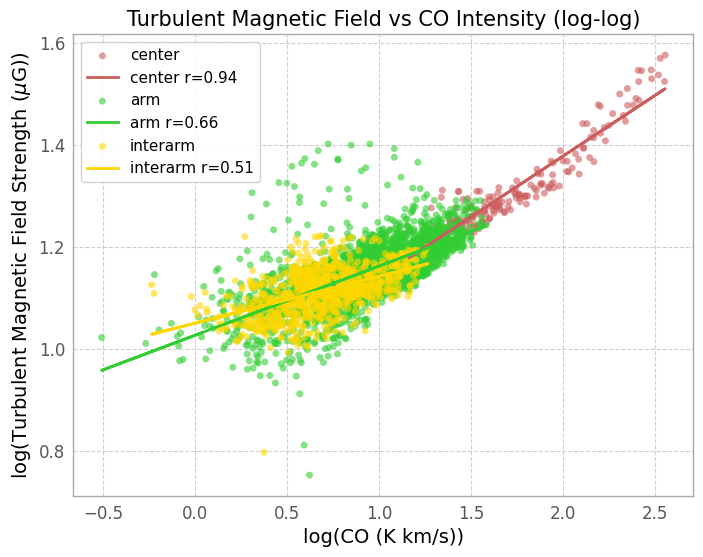


Pearson Correlation Coefficients:
Region     r     
--------------------
center     0.944
arm        0.662
interarm   0.507


In [72]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Data setup - now using B_turb instead of B_field
datasets = [
    (CO, B_turb, 'CO (K km/s)', 'Turbulent Magnetic Field Strength ($\mu$G)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure
fig, ax = plt.subplots(figsize=(8, 6))
x_data, y_data, xlabel, ylabel = datasets[0]

# Main plot settings
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

# Store results
results = []

for region, color in regions:
    # Extract data for region
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Valid data mask
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x_log, y_log)
    fit_y_log = slope * x_log + intercept

    # Plot scatter and regression line
    ax.scatter(x_log, y_log, s=25, color=color, alpha=0.6, edgecolors='none', label=f'{region}')
    ax.plot(x_log, fit_y_log, '-', color=color, lw=2,
            label=f'{region} r={r_value:.2f}')

    # Store results
    results.append({
        'region': region,
        'r_value': r_value,
    })

# Add legend and title
ax.legend(fontsize=11, framealpha=0.9)
plt.title('Turbulent Magnetic Field vs CO Intensity (log-log)', fontsize=15)

plt.show()

# Print only Pearson correlation summary
print("\nPearson Correlation Coefficients:")
print(f"{'Region':<10} {'r':<6}")
print("-" * 20)
for res in results:
    print(f"{res['region']:<10} {res['r_value']:.3f}")


#$B_{turb}$ vs NHI

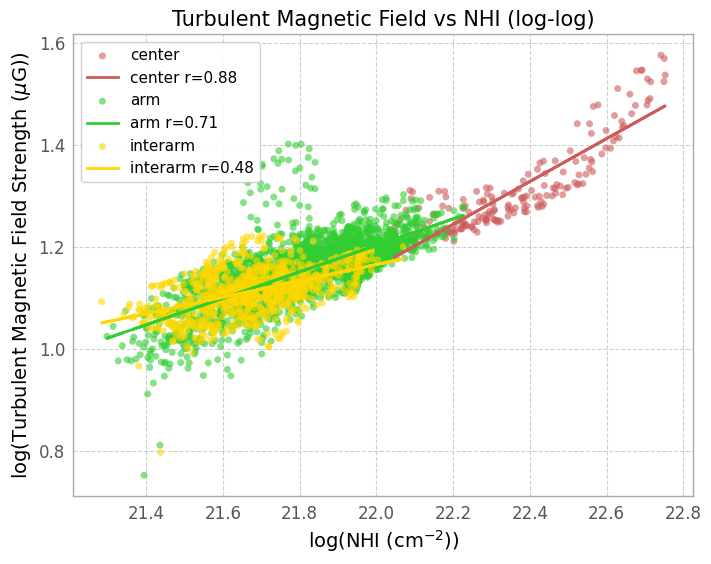


Pearson Correlation Coefficients:
Region     r     
--------------------
center     0.880
arm        0.709
interarm   0.482


In [73]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Data setup - now using B_turb vs NHI
datasets = [
    (NHI, B_turb, 'NHI (cm$^{-2}$)', 'Turbulent Magnetic Field Strength ($\mu$G)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure
fig, ax = plt.subplots(figsize=(8, 6))
x_data, y_data, xlabel, ylabel = datasets[0]

# Main plot settings
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

# Store results
results = []

for region, color in regions:
    # Extract data for region
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Valid data mask
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x_log, y_log)
    fit_y_log = slope * x_log + intercept

    # Plot scatter and regression line
    ax.scatter(x_log, y_log, s=25, color=color, alpha=0.6, edgecolors='none', label=f'{region}')
    ax.plot(x_log, fit_y_log, '-', color=color, lw=2,
            label=f'{region} r={r_value:.2f}')

    # Store results
    results.append({
        'region': region,
        'r_value': r_value,
    })

# Add legend and title
ax.legend(fontsize=11, framealpha=0.9)
plt.title('Turbulent Magnetic Field vs NHI (log-log)', fontsize=15)

plt.show()

# Print only Pearson correlation summary
print("\nPearson Correlation Coefficients:")
print(f"{'Region':<10} {'r':<6}")
print("-" * 20)
for res in results:
    print(f"{res['region']:<10} {res['r_value']:.3f}")



#$B_{ord}$ vs SFR

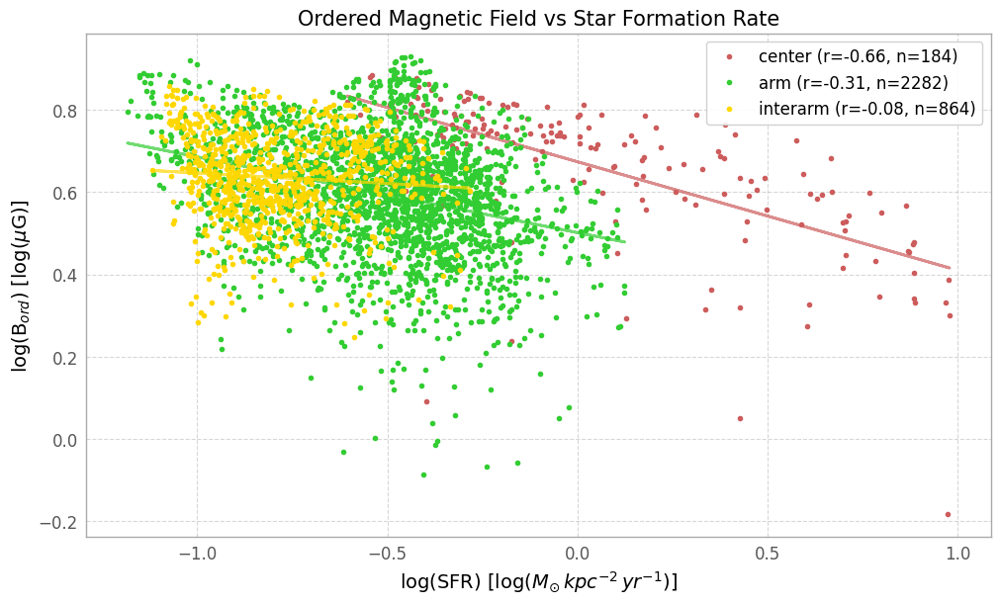


Regression Results:
Region     N     Slope    Intercept  r-value  p-value   
------------------------------------------------------------
center     184   -0.264 0.674 -0.661 1.686e-24
arm        2282  -0.184 0.502 -0.306 1.640e-50
interarm   864   -0.051 0.596 -0.082 1.564e-02


In [74]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Plot: B_ord vs SFR (log-log)
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('log(SFR) [log($M_{\odot}\,kpc^{-2}\,yr^{-1}$)]', fontsize=14)
ax.set_ylabel('log(B$_{ord}$) [log($\mu$G)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Store results
results = []

for region, color in regions:
    # Extract SFR and B_ord for this region
    x_raw, y_raw = fun1(SFR, B_ord, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    # Log-transform
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(log_x, log_y)
    fit_log_y = slope * log_x + intercept

    # Plot data and fit
    ax.plot(log_x, log_y, ".", color=color,
            label=f"{region} (r={r_value:.2f}, n={len(x)})")
    ax.plot(log_x, fit_log_y, "-", color=color, alpha=0.7, linewidth=2)

    # Store results
    results.append({
        'region': region,
        'n_points': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value
    })

# Legend and title
ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Ordered Magnetic Field vs Star Formation Rate", fontsize=15)

plt.show()

# Print regression summary
print("\nRegression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope':<8} {'Intercept':<10} {'r-value':<8} {'p-value':<10}")
print("-" * 60)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope']:.3f} {res['intercept']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")



#$B_{ord}$ vs CO

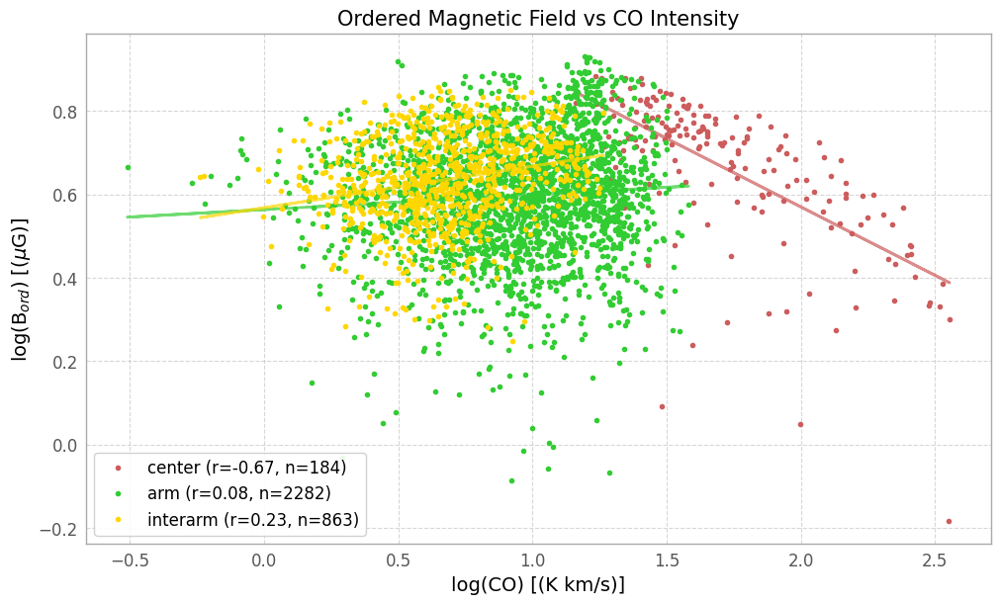


Regression Results:
Region     N     Slope    Intercept  r-value  p-value   
------------------------------------------------------------
center     184   -0.328 1.227 -0.668 4.171e-25
arm        2282  0.036 0.564 0.075 3.326e-04
interarm   863   0.100 0.568 0.233 3.896e-12


In [75]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Plot: B_ord vs CO (log-log)
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('log(CO) [(K km/s)]', fontsize=14)
ax.set_ylabel('log(B$_{ord}$) [($\mu$G)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Store results
results = []

for region, color in regions:
    # Extract CO and B_ord for this region
    x_raw, y_raw = fun1(CO, B_ord, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    # Log-transform
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(log_x, log_y)
    fit_log_y = slope * log_x + intercept

    # Plot data and fit
    ax.plot(log_x, log_y, ".", color=color,
            label=f"{region} (r={r_value:.2f}, n={len(x)})")
    ax.plot(log_x, fit_log_y, "-", color=color, alpha=0.7, linewidth=2)

    # Store results
    results.append({
        'region': region,
        'n_points': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value
    })

# Legend and title
ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Ordered Magnetic Field vs CO Intensity", fontsize=15)

plt.show()

# Print regression summary
print("\nRegression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope':<8} {'Intercept':<10} {'r-value':<8} {'p-value':<10}")
print("-" * 60)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope']:.3f} {res['intercept']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")


#$B_{ord}$ vs NHI

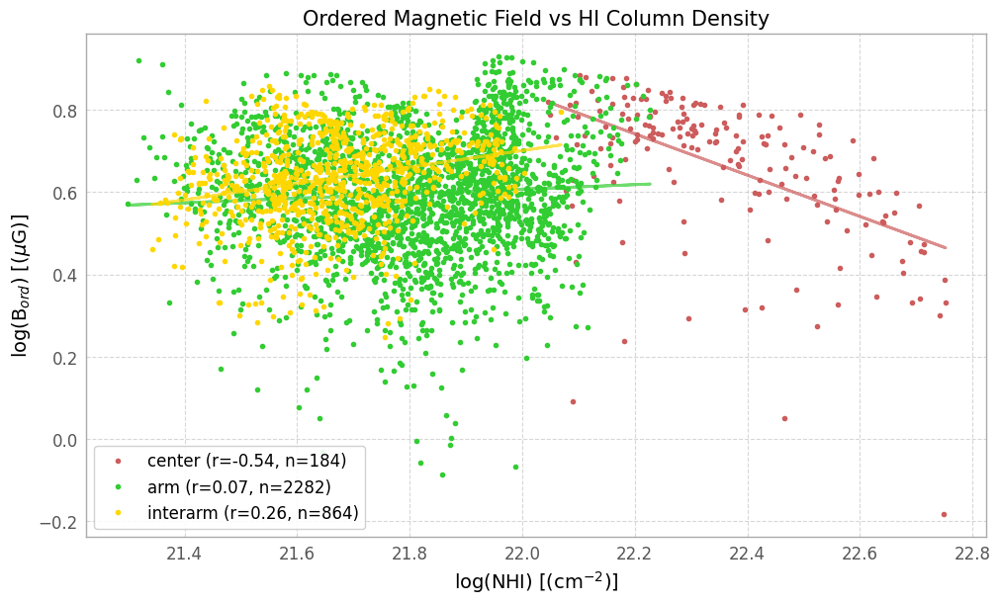


Regression Results:
Region     N     Slope    Intercept  r-value  p-value   
------------------------------------------------------------
center     184   -0.502 11.892 -0.539 3.030e-15
arm        2282  0.055 -0.608 0.066 1.707e-03
interarm   864   0.200 -3.690 0.255 2.584e-14


In [76]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt

# Plot: B_ord vs NHI (log-log)
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('log(NHI) [(cm$^{-2}$)]', fontsize=14)
ax.set_ylabel('log(B$_{ord}$) [($\mu$G)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Store results
results = []

for region, color in regions:
    # Extract NHI and B_ord for this region
    x_raw, y_raw = fun1(NHI, B_ord, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    # Log-transform
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(log_x, log_y)
    fit_log_y = slope * log_x + intercept

    # Plot data and fit
    ax.plot(log_x, log_y, ".", color=color,
            label=f"{region} (r={r_value:.2f}, n={len(x)})")
    ax.plot(log_x, fit_log_y, "-", color=color, alpha=0.7, linewidth=2)

    # Store results
    results.append({
        'region': region,
        'n_points': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value
    })

# Legend and title
ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Ordered Magnetic Field vs HI Column Density", fontsize=15)

plt.show()

# Print regression summary
print("\nRegression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope':<8} {'Intercept':<10} {'r-value':<8} {'p-value':<10}")
print("-" * 60)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope']:.3f} {res['intercept']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")


#q vs SFR

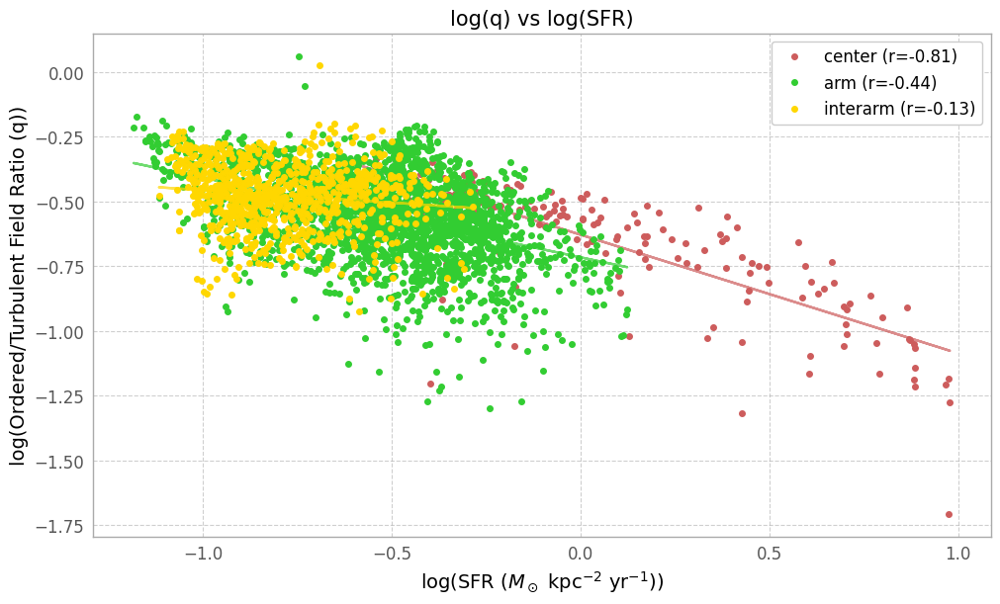

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from astropy.io import fits

# Load q (ordered/turbulent) data
q = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits')

# Define dataset
datasets = [
    (SFR, q, 'SFR ($M_\\odot$ kpc$^{-2}$ yr$^{-1}$)', 'Ordered/Turbulent Field Ratio (q)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
x_data, y_data, xlabel, ylabel = datasets[0]

# Axis labels for log-log plot
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y = slope * x_log + intercept

    # Plot data points
    ax.plot(x_log, y_log, ".", color=color, markersize=8, label=f"{region} (r={r_value:.2f})")

    # Plot fit line
    ax.plot(x_log, fit_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12, framealpha=1)
plt.title('log(q) vs log(SFR)', fontsize=15)
plt.show()


# q vs CO

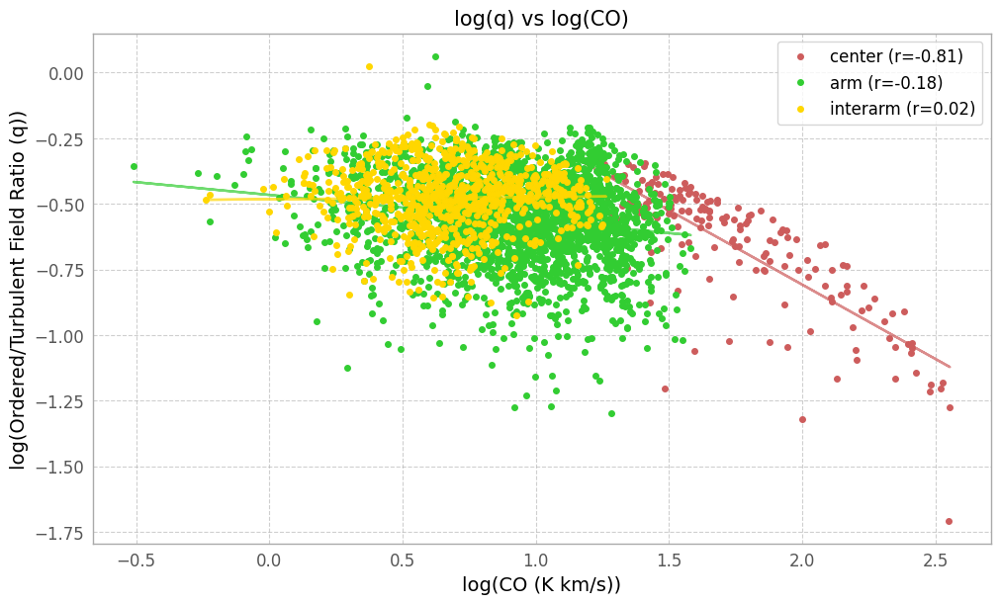

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from astropy.io import fits

# Load q (ordered/turbulent) data
q = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits')

# Define dataset
datasets = [
    (CO, q, 'CO (K km/s)', 'Ordered/Turbulent Field Ratio (q)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Create figure
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
x_data, y_data, xlabel, ylabel = datasets[0]

# Axis labels for log-log plot
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y = slope * x_log + intercept

    # Plot points
    ax.plot(x_log, y_log, ".", color=color, markersize=8, label=f"{region} (r={r_value:.2f})")
    ax.plot(x_log, fit_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12)
plt.title("log(q) vs log(CO)", fontsize=15)
plt.show()


#q vs NHI

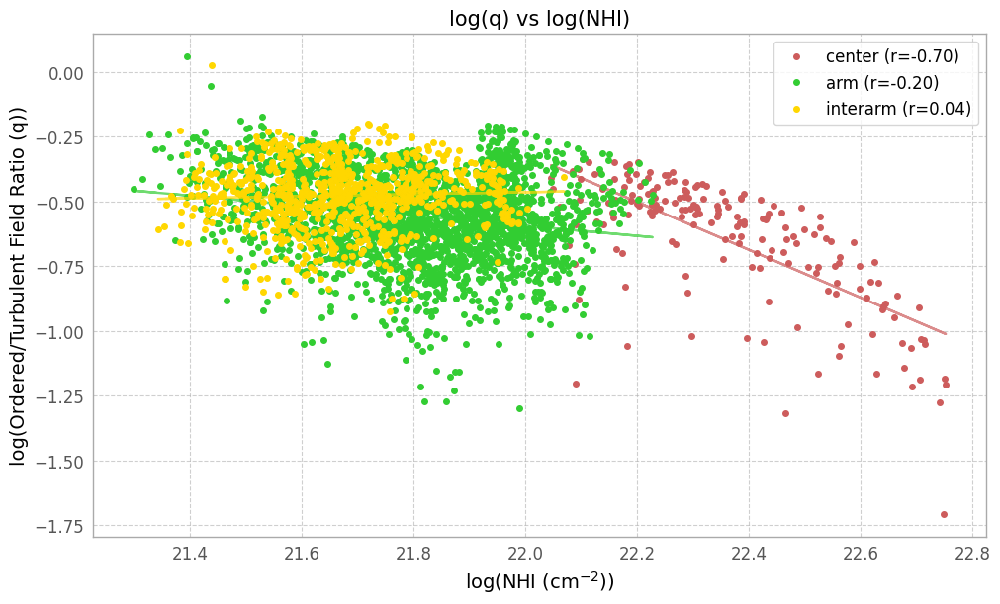

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from astropy.io import fits

# Load q (ordered/turbulent field ratio)
q = fits.getdata('/content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits')

# Dataset: NHI vs q
datasets = [
    (NHI, q, 'NHI (cm$^{-2}$)', 'Ordered/Turbulent Field Ratio (q)'),
]

regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
x_data, y_data, xlabel, ylabel = datasets[0]

# Axis labels
ax.set_xlabel(f'log({xlabel})', fontsize=14)
ax.set_ylabel(f'log({ylabel})', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    x, y = fun1(x_data, y_data, eval(f"{region} * masktot"))

    # Mask valid data
    mask = (x > 0) & (y > 0) & np.isfinite(x) & np.isfinite(y)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Linear regression
    slope, intercept, r_value, _, _ = linregress(x_log, y_log)
    fit_y = slope * x_log + intercept

    # Plot
    ax.plot(x_log, y_log, ".", color=color, markersize=8, label=f"{region} (r={r_value:.2f})")
    ax.plot(x_log, fit_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12)
plt.title("log(q) vs log(NHI)", fontsize=15)
plt.show()


#$U_{B}$ vs SFR

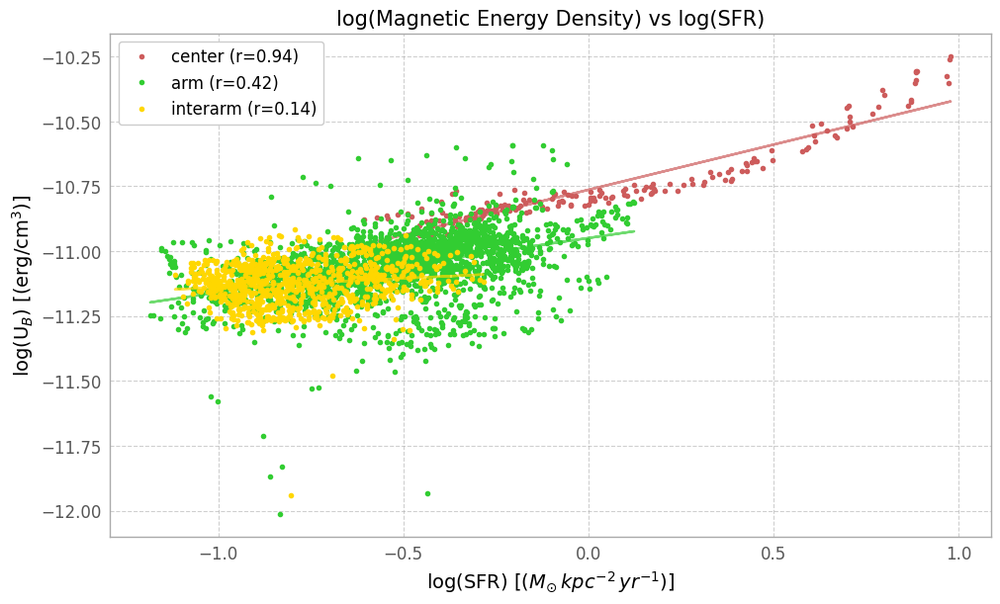

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from astropy.io import fits

# Load U_B
U_B_tot_hdu = fits.open('/content/drive/MyDrive/SALSA_NGC6946/magnetic_energy_density')
U_B_tot = U_B_tot_hdu[0].data
header = U_B_tot_hdu[0].header

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

ax.set_xlabel('log(SFR) [($M_{\odot}\,kpc^{-2}\,yr^{-1}$)]', fontsize=14)
ax.set_ylabel('log(U$_B$) [(erg/cm$^3$)]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.6)

for region, color in regions:
    # Extract SFR and U_B for region
    x_raw, y_raw = fun1(SFR, U_B_tot, eval(f"{region} * masktot"))

    # Mask positive finite values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = np.log10(x_raw[mask])
    y = np.log10(y_raw[mask])

    # Linear regression
    slope, intercept, r_value, _, _ = linregress(x, y)
    fit_y = slope * x + intercept

    ax.plot(x, y, ".", color=color, label=f"{region} (r={r_value:.2f})")
    ax.plot(x, fit_y, "-", color=color, alpha=0.7)

ax.legend(fontsize=12, framealpha=1)
plt.title("log(Magnetic Energy Density) vs log(SFR)", fontsize=15)
plt.show()


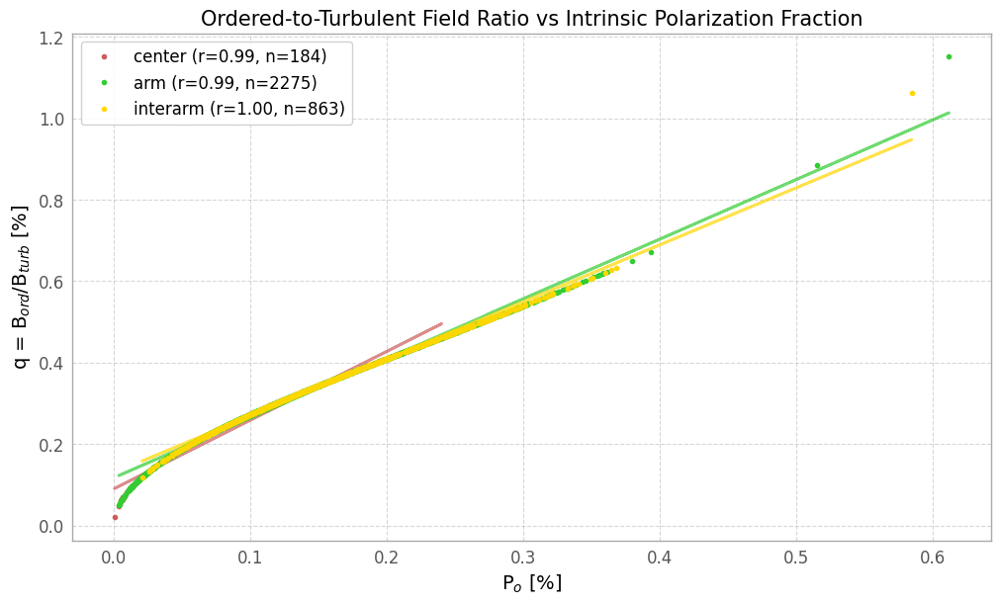


Regression Results:
Region     N     Slope    Intercept  r-value  p-value   
------------------------------------------------------------
center     184   1.690 0.090 0.988 1.661e-149
arm        2275  1.466 0.117 0.995 0.000e+00
interarm   863   1.402 0.129 0.997 0.000e+00


In [81]:
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt
from astropy.io import fits

# Load data
q = fits.open('/content/drive/MyDrive/SALSA_NGC6946/ordered_to_turbulent_field_ratio.fits')[0].data
pf = fits.open('/content/drive/MyDrive/SALSA_NGC6946/PF_intrs.fits')[0].data  # Intrinsic polarization fraction (p_o)

# Plot: q vs p_o (pf) - linear scale
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# Axis labels
ax.set_xlabel('P$_{o}$ [%]', fontsize=14)
ax.set_ylabel('q = B$_{ord}$/B$_{turb}$ [%]', fontsize=14)
ax.grid(True, linestyle='--', alpha=0.5)

# Define regions
regions = [("center", "indianred"), ("arm", "limegreen"), ("interarm", "gold")]

# Store results
results = []

for region, color in regions:
    # Extract pf and q for this region
    x_raw, y_raw = fun1(pf, q, eval(f"{region} * masktot"))

    # Mask invalid values
    mask = (x_raw > 0) & (y_raw > 0) & np.isfinite(x_raw) & np.isfinite(y_raw)
    x = x_raw[mask]
    y = y_raw[mask]

    # Linear regression (no log)
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    fit_y = slope * x + intercept

    # Plot data and regression line
    ax.plot(x, y, ".", color=color,
            label=f"{region} (r={r_value:.2f}, n={len(x)})")
    ax.plot(x, fit_y, "-", color=color, alpha=0.7, linewidth=2)

    # Store results
    results.append({
        'region': region,
        'n_points': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value
    })

# Legend and title
ax.legend(fontsize=12, frameon=True, framealpha=0.9)
plt.title("Ordered-to-Turbulent Field Ratio vs Intrinsic Polarization Fraction", fontsize=15)

plt.show()

# Print regression summary
print("\nRegression Results:")
print(f"{'Region':<10} {'N':<5} {'Slope':<8} {'Intercept':<10} {'r-value':<8} {'p-value':<10}")
print("-" * 60)
for res in results:
    print(f"{res['region']:<10} {res['n_points']:<5} {res['slope']:.3f} {res['intercept']:.3f} {res['r_value']:.3f} {res['p_value']:.3e}")

In [82]:
!pip install aplpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 378.9/378.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 534.8/534.8 kB 29.2 MB/s eta 0:00:00


#FIR Data Section

#FIR-I-18''

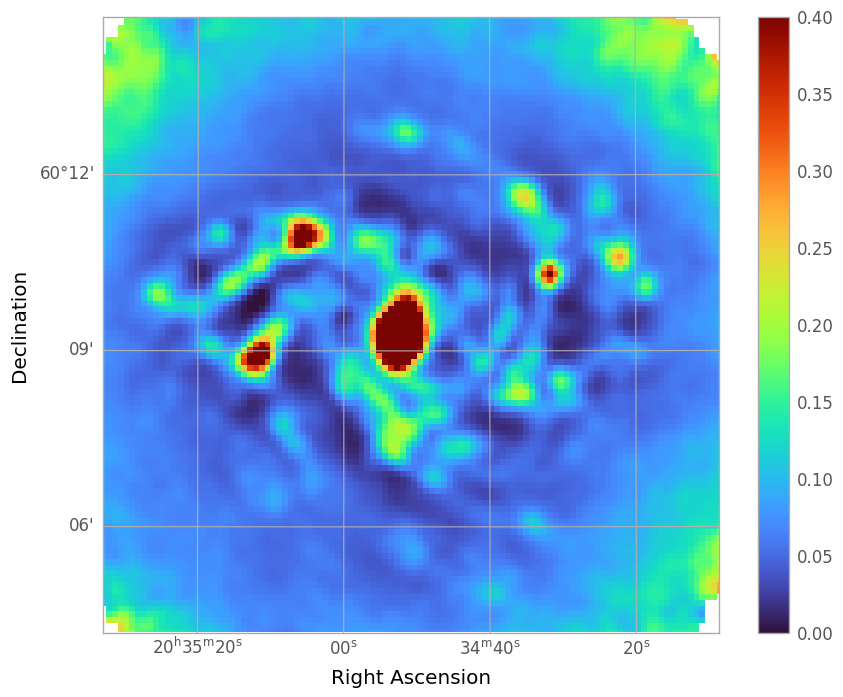

In [83]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

# Path to your FITS file
file_path = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-18.fits'

# Open the FITS file
hdul = fits.open(file_path)

# Extract data and header
data = hdul[0].data
header = hdul[0].header

# Initialize WCS from header
wcs = WCS(header)

# Scale the intensity by (6/6.9)^2
factor = 0.85
scaled_data = data * factor

# Plot with WCS projection
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs)
im = ax.imshow(scaled_data, origin='lower', cmap='turbo',vmin=0,vmax=0.4)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
plt.colorbar(im, ax=ax, label='')
plt.xlim([20, 125])
plt.ylim([35, 140])

plt.title('')
plt.show()

# Close the FITS file
hdul.close()


In [84]:
import numpy as np
from astropy.io import fits

# Load FITS file
file_path = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-18.fits'
hdul = fits.open(file_path)
data = hdul[0].data
hdul.close()

# Scale intensity
factor = 0.86
scaled_data = data * factor

# Given parameters
pixel_scale_arcsec = 6.0  # arcsec per pixel
beam_fwhm_arcsec = 18.0   # beam FWHM in arcsec

# Calculate beam area in pixels
beam_area_pixels = (np.pi / (4 * np.log(2))) * (beam_fwhm_arcsec / pixel_scale_arcsec)**2

# Sum of all pixel values
total_intensity = np.nansum(scaled_data)

# Convert total intensity from Jy/beam to Jy
total_flux_density = total_intensity

print(f"Beam area in pixels: {beam_area_pixels:.2f}")
print(f"Total flux density: {total_flux_density:.4f} Jy")


Beam area in pixels: 10.20
Total flux density: 1563.9991 Jy


#FIR STOKES Q 18''

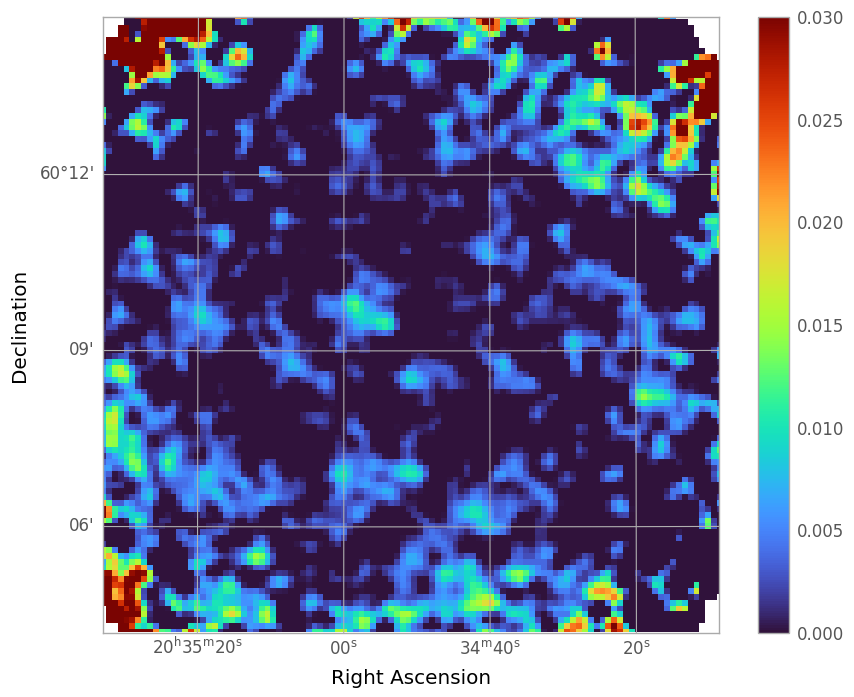

In [85]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

# Path to the FITS file
file_path = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q.fits'

# Open the FITS file and extract data and header
with fits.open(file_path) as hdul:
    data_q = hdul[0].data
    header = hdul[0].header
factor = (6.9/6)**2

data_q = data_q*factor

# Create WCS object from header
wcs = WCS(header)

# Plot the image with WCS projection
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs)
im = ax.imshow(data_q, origin='lower', cmap='turbo',vmin=0,vmax=0.03)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
plt.colorbar(im, ax=ax, label='')
plt.xlim([20, 125])
plt.ylim([35, 140])
plt.title('')
plt.show()


#FIR-StokeQ-Error

#STOKE U at 18''

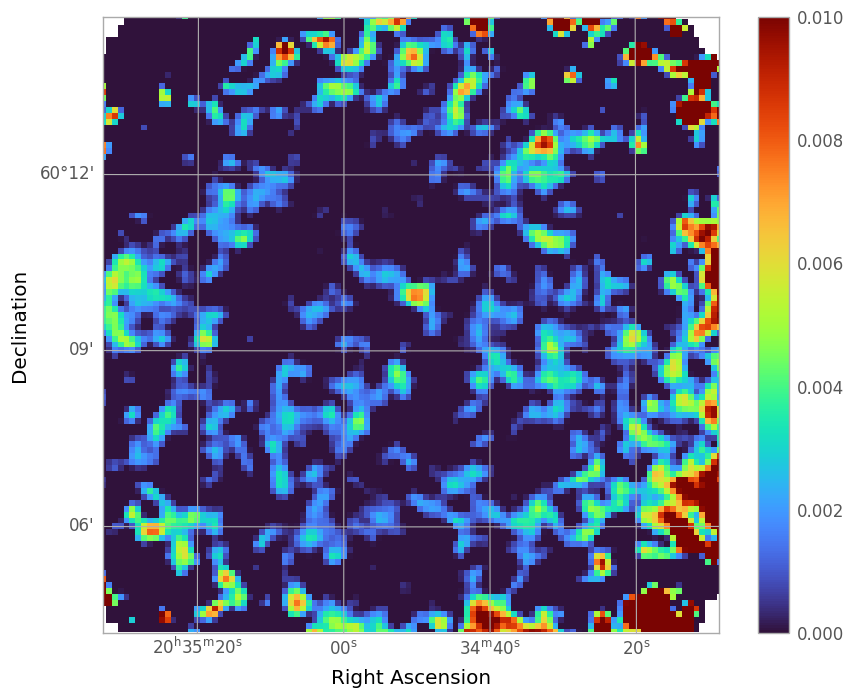

In [86]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import numpy as np

# Path to your FITS file
fits_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits'

# Correction factor C you computed (example from your fluxes)
C = -6.4842 / 8.7932  # ≈ -0.7379

# Load FITS data and header
with fits.open(fits_file) as hdul:
    u_data = hdul[0].data
    header = hdul[0].header

# Apply correction factor C to conserve flux
scaled_u_data = u_data * C

# Create WCS object for coordinate-aware plotting
wcs = WCS(header)

# Plot the scaled Stokes U map
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs)
im = ax.imshow(scaled_u_data, origin='lower', cmap='turbo',vmin=0 ,vmax=0.01)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
plt.colorbar(im, ax=ax, label='')
plt.title('')
plt.xlim([20, 125])
plt.ylim([35, 140])
plt.show()


#STOKE U Error Map at 18''

#Polarization Angle map at FIR

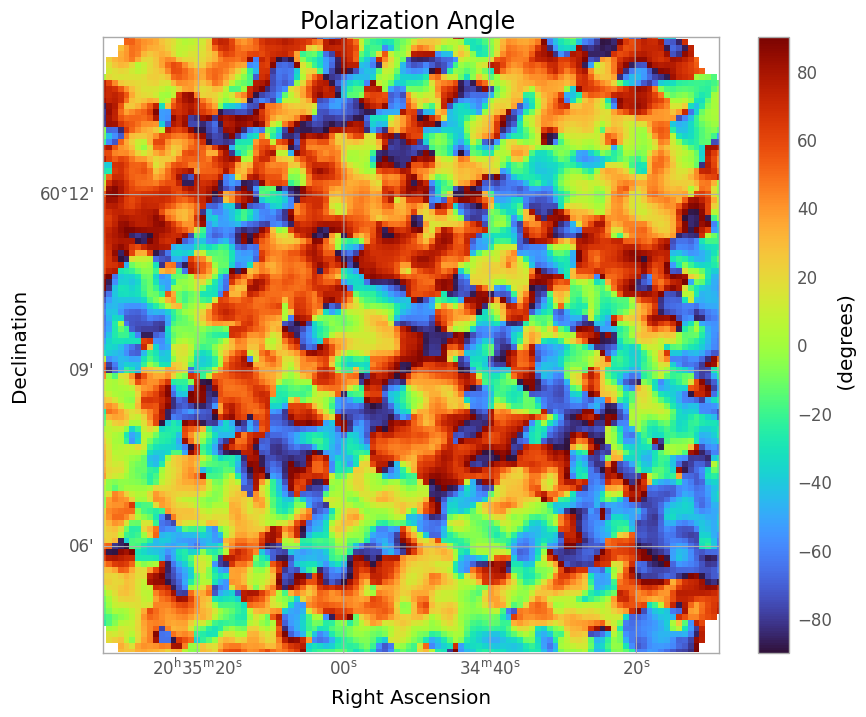

In [88]:
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

# Paths to your Stokes Q and U FITS files
fits_q = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q.fits'
fits_u = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits'

# Load Q and U data
with fits.open(fits_q) as hdul_q:
    q_data = hdul_q[0].data
    header = hdul_q[0].header

with fits.open(fits_u) as hdul_u:
    u_data = hdul_u[0].data

# Compute polarization angle in radians
pol_angle_rad = 0.5 * np.arctan2(u_data, q_data)

# Convert to degrees
pol_angle_deg = np.degrees(pol_angle_rad)

# Shift angles to range [-90, +90]
pol_angle_deg = ((pol_angle_deg + 90) % 180) - 90

# Create WCS object for plotting
wcs = WCS(header)

# Plot polarization angle map
plt.figure(figsize=(10, 8))
ax = plt.subplot(projection=wcs)
im = ax.imshow(pol_angle_deg, origin='lower', cmap='turbo', vmin=-90, vmax=90)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
plt.colorbar(im, ax=ax, label=' (degrees)')
plt.title('Polarization Angle ')
plt.xlim([20, 125])
plt.ylim([35, 140])
plt.show()



#Polarization Intensity

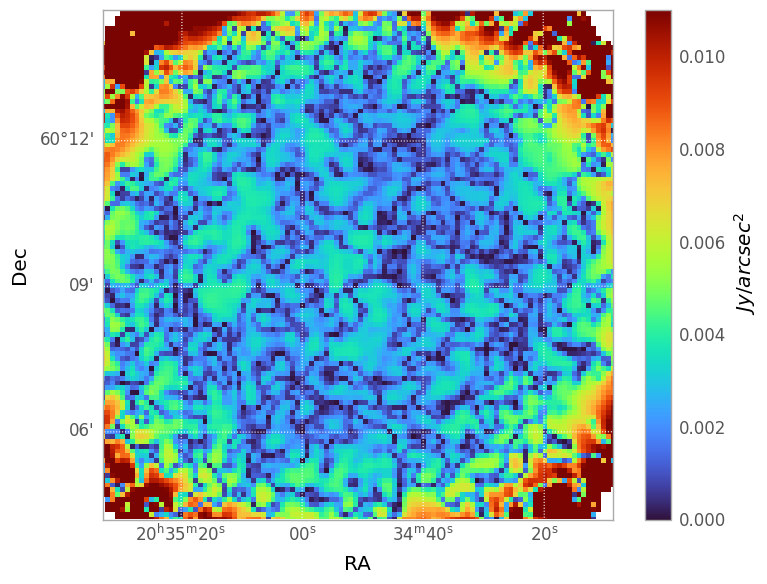

Saved debiased polarized intensity to /content/drive/MyDrive/SALSA_NGC6946/debiased_polarized_intensity.fits


In [89]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# Paths to Q, U and their error maps
q_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q-Err-18.fits'
u_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits'
q_err_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q-Err-18.fits'
u_err_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-Err-18.fits'

# Load data
with fits.open(q_file) as hdul:
    Q = hdul[0].data
    header = hdul[0].header
    wcs = WCS(header)

with fits.open(u_file) as hdul: U = hdul[0].data
with fits.open(q_err_file) as hdul: sig_Q = hdul[0].data
with fits.open(u_err_file) as hdul: sig_U = hdul[0].data


#sig_U = 0.001
#sig_Q = 0.001


# Compute Polarized Intensity (PI)
PI = np.sqrt(Q**2 + U**2)

# Compute uncertainty σ_PI
sigma_PI = np.sqrt((Q**2 * sig_Q**2 + U**2 * sig_U**2) / (Q**2 + U**2 ))

# Compute debiased polarized intensity PI'
PI_debiased = np.sqrt((PI**2 - sigma_PI**2))

# Plot
fig = plt.figure(figsize=(8, 6))
ax = plt.subplot(projection=wcs)
im = ax.imshow(PI_debiased, origin='lower', cmap='turbo', vmin=0,vmax=0.011)

plt.xlim([20, 125])
plt.ylim([35, 140])
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
ax.grid(color='white', ls='dotted')

cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label(' $Jy/arcsec^2$')

plt.title('')
plt.tight_layout()
plt.show()

output_path = '/content/drive/MyDrive/SALSA_NGC6946/debiased_polarized_intensity.fits'

# Create Primary HDU with WCS header
hdu = fits.PrimaryHDU(data=PI_debiased, header=header)

# Write the FITS file
hdu.writeto(output_path, overwrite=True)

print(f"Saved debiased polarized intensity to {output_path}")


#FIR Polarization fraction

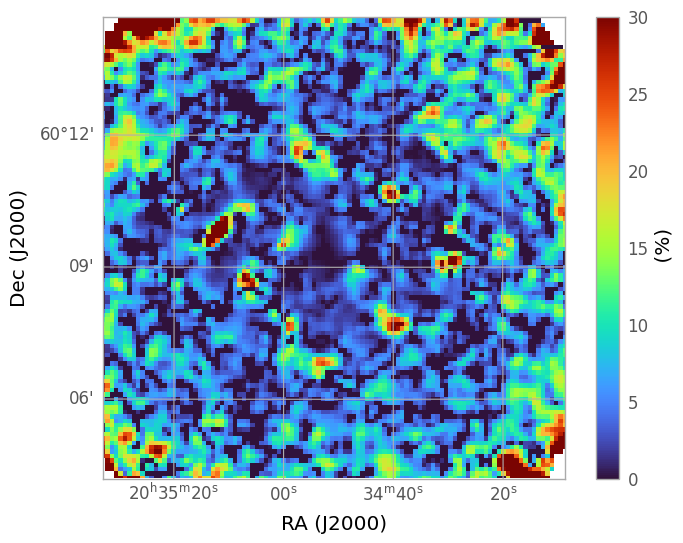

In [90]:
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

def calculate_polarization_maps(I, Q, U, sigma_I, sigma_Q, sigma_U, sigma_QU=0, sigma_QI=0, sigma_UI=0):
    """
    Calculate polarization percentage, its error, and debiased polarization percentage for maps.

    Parameters:
    I: Stokes I (total intensity) 2D array
    Q: Stokes Q 2D array
    U: Stokes U 2D array
    sigma_I: Error in Stokes I 2D array
    sigma_Q: Error in Stokes Q 2D array
    sigma_U: Error in Stokes U 2D array
    sigma_QU: Covariance between Q and U (scalar or array, default=0)
    sigma_QI: Covariance between Q and I (scalar or array, default=0)
    sigma_UI: Covariance between U and I (scalar or array, default=0)

    Returns:
    p: Percent polarization map
    sigma_p: Error in percent polarization map
    p_prime: Debiased percent polarization map
    """
    # Initialize output arrays
    p = np.zeros_like(I, dtype=float)
    sigma_p = np.zeros_like(I, dtype=float)
    p_prime = np.zeros_like(I, dtype=float)

    # Avoid division by zero and invalid values
    valid = (I != 0) & np.isfinite(I) & np.isfinite(Q) & np.isfinite(U) & \
            np.isfinite(sigma_I) & np.isfinite(sigma_Q) & np.isfinite(sigma_U)

    # Calculate percent polarization (p)
    p[valid] = 100 * np.sqrt((Q[valid]/I[valid])**2 + (U[valid]/I[valid])**2)

    # Calculate error in percent polarization (sigma_p)
    term1 = (Q[valid]/I[valid])**2 + (U[valid]/I[valid])**2
    term2 = (Q[valid] * sigma_Q[valid])**2 + (U[valid] * sigma_U[valid])**2 + 2 * Q[valid] * U[valid] * sigma_QU
    term3 = term1 * sigma_I[valid]**2
    term4 = -2 * (Q[valid]/I[valid]) * sigma_QI
    term5 = -2 * (U[valid]/I[valid]) * sigma_UI

    sigma_p[valid] = (100/I[valid]) * np.sqrt((term2 + term3 + term4 + term5) / term1)

    # Calculate debiased percent polarization (p')
    p_prime[valid] = np.sqrt(np.maximum(0, p[valid]**2 - sigma_p[valid]**2))

    # Set invalid pixels to NaN
    p[~valid] = np.nan
    sigma_p[~valid] = np.nan
    p_prime[~valid] = np.nan

    return p, sigma_p, p_prime

def read_fits_file(file_path):
    """Read data and header from a FITS file's primary HDU."""
    with fits.open(file_path) as hdul:
        data = hdul[0].data
        header = hdul[0].header
        # Ensure data is 2D (remove extra dimensions if any)
        if data.ndim > 2:
            data = data[0] if data.shape[0] == 1 else data.squeeze()
        return data, header

def plot_debiased_polarization_map(p_prime, header, vmin=0.01, vmax=10):
    """
    Plot the debiased percent polarization map with WCS coordinates.

    Parameters:
    p_prime: Debiased percent polarization map
    header: FITS header with WCS information
    vmin: Minimum value for color scale (default=0.01%)
    vmax: Maximum value for color scale (default=10%)
    """
    # Get WCS from header
    wcs = WCS(header)

    # Create figure
    plt.figure(figsize=(8, 6))
    ax = plt.subplot(projection=wcs)

    # Plot debiased percent polarization (p')
    im = plt.imshow(p_prime, origin='lower', cmap='turbo',vmin=0,vmax=30)
    plt.colorbar(im, label=' (%)')
    plt.title('')
    plt.xlim([20, 125])
    plt.ylim([35, 140])
    plt.xlabel('RA (J2000)')
    plt.ylabel('Dec (J2000)')

    plt.show()

# Main processing
if __name__ == "__main__":
    # File paths
    I_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-18.fits'
    Q_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q.fits'
    U_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits'
    I_err_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-Err-18.fits'
    Q_err_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q-Err-18.fits'
    U_err_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-Err-18.fits'

    # Read FITS files
    try:
        I, I_header = read_fits_file(I_file)
        Q, _ = read_fits_file(Q_file)
        U, _ = read_fits_file(U_file)
        sigma_I, _ = read_fits_file(I_err_file)
        sigma_Q, _ = read_fits_file(Q_err_file)
        sigma_U, _ = read_fits_file(U_err_file)
    except Exception as e:
        print(f"Error reading FITS files: {e}")
        exit(1)

    # Check if all arrays have the same shape
    if not (I.shape == Q.shape == U.shape == sigma_I.shape == sigma_Q.shape == sigma_U.shape):
        print("Error: Input arrays have different shapes")
        exit(1)

    # Calculate polarization maps
    p, sigma_p, p_prime = calculate_polarization_maps(I, Q, U, sigma_I, sigma_Q, sigma_U)

    # Plot the debiased percent polarization map
    plot_debiased_polarization_map(p_prime, I_header)

#Polarization field at FIR

rms_FIR_I: 8.9686e-03
FIR_I min/max/mean: -6.6728e-02, 4.8371e+00, 1.2150e-01
FIR_dbiasp min/max/mean: 0.0000e+00, 1.4248e-01, 8.4228e-03
Using circular radius: 41.01 pixels
Number of valid pixels for vectors: 1858
Plotting 620 vectors


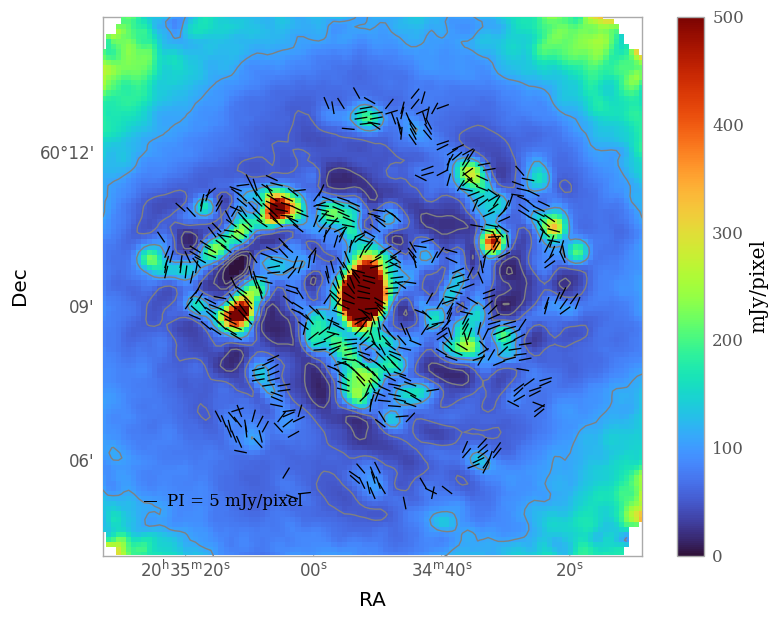

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# --- Load FITS files ---
I_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-18.fits'
sigma_I_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-I-Err-18.fits'
Q_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-Q.fits'
U_file = '/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits'
PI_file = '/content/drive/MyDrive/SALSA_NGC6946/debiased_polarized_intensity.fits'

# Load data
hdu_I = fits.open(I_file)[0]
FIR_I = hdu_I.data
wcs = WCS(hdu_I.header)

FIR_Q = fits.getdata(Q_file)
FIR_U = fits.getdata(U_file)
FIR_dbiasp = fits.getdata(PI_file)
rms_FIR_I = np.nanstd(fits.getdata(sigma_I_file))  # Estimate noise from error map

# Debug: Print data statistics
print(f"rms_FIR_I: {rms_FIR_I:.4e}")
print(f"FIR_I min/max/mean: {np.nanmin(FIR_I):.4e}, {np.nanmax(FIR_I):.4e}, {np.nanmean(FIR_I):.4e}")
print(f"FIR_dbiasp min/max/mean: {np.nanmin(FIR_dbiasp):.4e}, {np.nanmax(FIR_dbiasp):.4e}, {np.nanmean(FIR_dbiasp):.4e}")

# Set thresholds
intensity_limit = 8.0 * rms_FIR_I
pi_limit = 0.1 * rms_FIR_I

# Create base mask
mask_Bfield = np.ones_like(FIR_I)
mask_Bfield[FIR_I < intensity_limit] = np.nan
mask_Bfield[FIR_dbiasp < pi_limit] = np.nan
mask_Bfield[np.isnan(FIR_I)] = np.nan

# --- Define new circular mask ---
center_x, center_y = 71, 84
edge_x, edge_y = 72, 125

radius = np.sqrt((edge_x - center_x)**2 + (edge_y - center_y)**2)
print(f"Using circular radius: {radius:.2f} pixels")

Y, X = np.indices(FIR_I.shape)
R = np.sqrt((X - center_x)**2 + (Y - center_y)**2)
mask_Bfield[R > radius] = np.nan

# Count valid pixels
valid_pixels = np.sum(np.isfinite(mask_Bfield))
print(f"Number of valid pixels for vectors: {valid_pixels}")

# --- Compute polarization vectors ---
FIR_pangle = (90 / np.pi) * np.arctan2(FIR_U, FIR_Q)
pol_angles_rad = np.deg2rad((FIR_pangle + 90) % 360)

# Normalize vectors for plotting
pol_vector_x = np.cos(pol_angles_rad) * 5.0
pol_vector_y = np.sin(pol_angles_rad) * 5.0

# --- Apply mask and subsample vectors ---
y_coords, x_coords = np.where(np.isfinite(mask_Bfield))
pol_vector_x = pol_vector_x[np.isfinite(mask_Bfield)]
pol_vector_y = pol_vector_y[np.isfinite(mask_Bfield)]

# Subsample
step = 3
x_coords = x_coords[::step]
y_coords = y_coords[::step]
pol_vector_x = pol_vector_x[::step]
pol_vector_y = pol_vector_y[::step]

# Check vector count
if len(x_coords) == 0:
    print("Warning: No valid vectors to plot after masking!")
else:
    print(f"Plotting {len(x_coords)} vectors")

# --- Plotting ---
plt.figure(figsize=(9, 7))
ax = plt.subplot(projection=wcs)

# Set plot view
plt.xlim([20, 125])
plt.ylim([35, 140])
plt.rcParams['font.family'] = 'serif'

# Show FIR intensity image
im = ax.imshow(FIR_I * 1e3, origin='lower', cmap='turbo', vmin=0, vmax=500, zorder=1)
plt.colorbar(im, ax=ax, label='mJy/pixel')

# Contours
levels = np.array([1.5, 3, 6, 12]) * rms_FIR_I * 1e3
ax.contour(FIR_I * 1e3, levels=levels, colors='grey', linewidths=1, zorder=2)

# Draw vectors
if len(x_coords) > 0:
    q = ax.quiver(
        x_coords, y_coords,
        pol_vector_x, pol_vector_y,
        angles='xy', scale=2, scale_units='xy',
        color='black', headlength=0, headaxislength=0,
        zorder=4
    )
    ax.quiverkey(
        q, X=0.1, Y=0.1, U=5,
        label='PI = 5 mJy/pixel', labelpos='E', coordinates='axes'
    )

# Labels
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
ax.set_title('')



# Save main plot
plt.savefig('FIR-Bfieldvector.pdf')




In [ ]:
1.8*(6/6.9)**2

#Magnetic pitch angle

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from astropy.coordinates import SkyCoord
import astropy.units as u

def compute_polarization(I, Q, U, dI, dQ, dU):
    """Step 1: Compute debiased polarization and its uncertainty"""
    P = np.sqrt((Q / I) ** 2 + (U / I) ** 2)

    num = (Q * dQ)**2 + (U * dU)**2
    denom = Q**2 + U**2
    dP = (1 / I) * np.sqrt(num / denom + dI**2 * denom / I**2)

    P_debias = np.sqrt(np.clip(P**2 - dP**2, 0, None))  # Avoid negatives
    return P_debias, P, dP

def rotate_coords(x, y, angle_deg):
    """2D rotation for θ and i, positive angle is counter-clockwise"""
    theta = np.radians(angle_deg)
    x_rot = x * np.cos(theta) - y * np.sin(theta)
    y_rot = x * np.sin(theta) + y * np.cos(theta)
    return x_rot, y_rot

def deproject(x, y, inclination, tilt):
    """Step 2: Apply tilt and inclination to coordinates"""
    x_rot, y_rot = rotate_coords(x, y, -tilt)
    y_proj = y_rot / np.cos(np.radians(inclination))
    return x_rot, y_proj

def compute_radial_azimuthal(x_proj, y_proj):
    """Step 3: Compute galactocentric radius and angle"""
    R = np.sqrt(x_proj**2 + y_proj**2)
    phi = np.arctan2(y_proj, x_proj)
    return R, phi

def compute_pitch_angle(B_PA, phi):
    """Step 5 & 7: Pitch angle = angle between B-field and azimuthal (Ξ)"""
    pitch = B_PA - (phi + np.pi / 2)
    # Normalize to [-90°, +90°]
    pitch = (pitch + np.pi) % (2 * np.pi) - np.pi
    pitch = np.degrees(pitch)
    return pitch

def angular_average(pitch_map, R_map, R_bins):
    """Step 8: Azimuthal average in radial bins"""
    pitch_profile = []
    for i in range(len(R_bins)-1):
        mask = (R_map >= R_bins[i]) & (R_map < R_bins[i+1])
        if np.any(mask):
            sin_vals = np.sin(np.radians(pitch_map[mask]))
            cos_vals = np.cos(np.radians(pitch_map[mask]))
            avg_pitch = np.degrees(np.arctan2(np.median(sin_vals), np.median(cos_vals)))
            pitch_profile.append(avg_pitch)
        else:
            pitch_profile.append(np.nan)
    return np.array(pitch_profile)

# Optional Monte Carlo simulation loop could go here (see below)



In [94]:
def monte_carlo_pitch(I, Q, U, dI, dQ, dU, x, y, center, i, theta, n_iter=1000):
    ny, nx = I.shape
    pitch_cube = []

    for _ in range(n_iter):
        # Perturb inputs
        I_ = I + np.random.normal(0, dI)
        Q_ = Q + np.random.normal(0, dQ)
        U_ = U + np.random.normal(0, dU)
        i_ = np.random.normal(i, 5)      # e.g., ±5°
        theta_ = np.random.normal(theta, 3)  # ±3°

        P_debias, P, dP = compute_polarization(I_, Q_, U_, dI, dQ, dU)
        x_rel, y_rel = x - center[0], y - center[1]
        x_proj, y_proj = deproject(x_rel, y_rel, i_, theta_)
        R, phi = compute_radial_azimuthal(x_proj, y_proj)

        B_PA = 0.5 * np.arctan2(U_, Q_)  # In radians
        pitch = compute_pitch_angle(B_PA, phi)

        pitch_cube.append(pitch)

    pitch_cube = np.stack(pitch_cube, axis=0)
    return pitch_cube


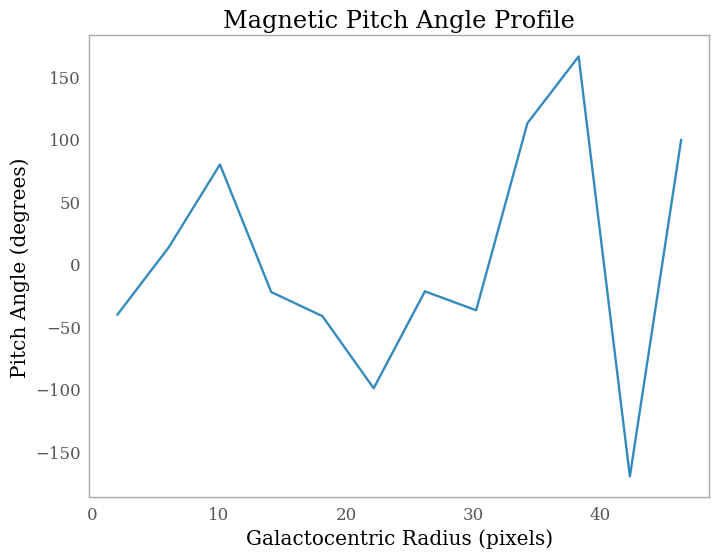

In [93]:
from astropy.io import fits

# Load FITS files
I_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-I-18.fits")
Q_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-Q.fits")
U_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-U-18.fits")

# Uncertainties (if you have them in separate files or extensions)
dI_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-I-Err-18.fits")
dQ_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-Q-Err-18.fits")
dU_data = fits.getdata("/content/drive/MyDrive/SALSA_NGC6946/FIR-U-Err-18.fits")

# Morphological parameters of M51 or your target
center_pix = (71, 84)   # example: central pixel (y, x); update for your data
inclination = 38.0        # degrees
tilt_angle = 242.0         # degrees

# Image coordinate grid
ny, nx = I_data.shape
y, x = np.indices((ny, nx))
x = x - center_pix[1]
y = y - center_pix[0]


# Step 1: Polarization
P_debias, P, dP = compute_polarization(I_data, Q_data, U_data, dI_data, dQ_data, dU_data)

# Step 2–3: Deprojection and galactocentric coordinates
x_proj, y_proj = deproject(x, y, inclination, tilt_angle)
R, phi = compute_radial_azimuthal(x_proj, y_proj)

# Step 5: Compute B-field orientation and pitch angle
B_PA = 0.5 * np.arctan2(U_data, Q_data)  # In radians
pitch_map = compute_pitch_angle(B_PA, phi)

R_max = np.nanmax(R)
R_bins = np.linspace(0, R_max, 40)  # 20 radial bins

pitch_profile = angular_average(pitch_map, R, R_bins)

# Plot the pitch angle profile
plt.plot(0.5 * (R_bins[:-1] + R_bins[1:]), pitch_profile)
plt.xlabel("Galactocentric Radius (pixels)")
plt.ylabel("Pitch Angle (degrees)")
plt.title("Magnetic Pitch Angle Profile")
plt.grid()
plt.show()



In [ ]:
n_iter = 1000
pitch_cube = []
for _ in range(n_iter):
    I_ = I_data + np.random.normal(0, dI_data)
    Q_ = Q_data + np.random.normal(0, dQ_data)
    U_ = U_data + np.random.normal(0, dU_data)
    i_ = np.random.normal(inclination, 5)
    t_ = np.random.normal(tilt_angle, 3)

    P_debias, _, _ = compute_polarization(I_, Q_, U_, dI_data, dQ_data, dU_data)
    x_proj, y_proj = deproject(x, y, i_, t_)
    R, phi = compute_radial_azimuthal(x_proj, y_proj)
    B_PA = 0.5 * np.arctan2(U_, Q_)
    pitch = compute_pitch_angle(B_PA, phi)
    pitch_cube.append(angular_average(pitch, R, R_bins))

pitch_cube = np.array(pitch_cube)
pitch_med = np.nanmedian(pitch_cube, axis=0)
pitch_68 = np.nanpercentile(pitch_cube, [16, 84], axis=0)

plt.plot(0.5 * (R_bins[:-1] + R_bins[1:]), pitch_med, label="Median")
plt.fill_between(0.5 * (R_bins[:-1] + R_bins[1:]), pitch_68[0], pitch_68[1], alpha=0.4, label="68% CI")
plt.xlabel("Radius (pixels)")
plt.ylabel("Pitch Angle (degrees)")
plt.title("Pitch Angle with Monte Carlo Uncertainty")
plt.legend()
plt.grid()
plt.show()


In [ ]:
1.81*((141*167)/(124*121))*((6/6.9)**2)